Postrun data process script - 1PFT, 2sites, CO2 treatment
case - CO2 treatment x site;  instances - different hydraulic traits/parameters
1) import modules
2) pre-analysis 
   a) read flux tower data
   b) read in lookup table
   c) read in selected history fields
   d) define functions to plot for stoma, xylem, and root profile 
3) run data analysis
    a) total basal area, DDBH, mortality as BA(MTba), recruitment, GPP for each PFT (pine)
    b) calculate mean and std of BA, DDBH, MTba for each case and instance
    c) calculate difference in mean and std for each instance between different CO2 treatment cases
4) make plots
   a) choose instances to compare
   b) plot stoma, xylem, root profiles for selected instances
   c) plot 
   
======Available history fields=======================
hist_fincl1='NEP','NPP','GPP','QVEGT','EFLX_LH_TOT','AR','HR','ED_biomass','FSDS','FSH','Rnet','BTRAN','TLAI','ED_NPATCHES','AREA_PLANT','AREA_TREES','CANOPY_SPREAD','PFTbiomass','PFTcrownarea','RECRUITMENT','NCL_BY_AGE','QVEGE','ED_balive','DDBH_SCPF','BA_SCPF','NPLANT_SCPF','NPP_SCPF',
'CANOPY_HEIGHT_DIST','LEAF_HEIGHT_DIST','C_STOMATA_BY_AGE','PARPROF_DIR_CNLFPFT','CROWNAREA_CNLF','CROWNAREA_CAN','BA_SCLS','GPP_SCPF','ED_bsapwood','ED_bfineroot','ED_bleaf','ED_bdead','ED_balive','LEAF_MR','NPP_LEAF_SCPF',
'RH','TBOT','PBOT','QBOT','RAIN','SOILLIQ','HK','SMP','QRUNOFF','QDRAI','QRGWL','QOVER','ZWT','ZWT_PERCH','AREA_TREES','AGB','NPLANT_SCAGPFT','SEEDS_IN_LOCAL_ELEM','SEED_BANK_ELEM','SEED_GERM_ELEM','NPP_LEAF',
'M1_SCPF','M2_SCPF','M3_SCPF','M4_SCPF','M5_SCPF','M6_SCPF','M7_SCPF','M8_SCPF','MT_SCPF','CARBON_BALANCE_CANOPY_SCLS','NPLANT_CANOPY_SCPF','NPLANT_UNDERSTORY_SCPF','LAI_CANOPY_SCLS','SAI_CANOPY_SCLS','LAI_UNDERSTORY_SCLS','SAI_UNDERSTORY_SCLS','NPP_SCPF','TRIMMING_CANOPY_SCLS',
'GPP_CANOPY_SCPF','AR_CANOPY_SCPF','DDBH_CANOPY_SCPF','DDBH_UNDERSTORY_SCPF','MORTALITY_CANOPY_SCPF','NPLANT_CANOPY_SCPF','MORTALITY_UNDERSTORY_SCPF',


'FATES_TRAN_SCPF','FATES_ERRH2O_SCPF','FATES_TRAN_SCPF','FATES_SAPFLOW_SCPF','FATES_SAPFLOW_SI','FATES_ITERH1_SCPF','FATES_ITERH2_SCPF','GPP_PLANT_SCPF','G_SB_SCPF','TRIMMING_CANOPY_SCLS',
'SITE_GDD','SITE_NCHILLDAYS','SITE_NCOLDDAYS','SITE_DAYSINCE_COLDLEAFOFF','SITE_DAYSINCE_COLDLEAFON','SITE_COLD_STATUS',
'BSTOR_CANOPY_SCPF','BSTOR_UNDERSTORY_SCPF',

'FATES_ATH_SCPF', 'FATES_TTH_SCPF','FATES_STH_SCPF','FATES_LTH_SCPF','FATES_AWP_SCPF','FATES_TWP_SCPF','FATES_SWP_SCPF','FATES_LWP_SCPF',
'FATES_AFLC_SCPF','FATES_TFLC_SCPF','FATES_SFLC_SCPF','FATES_LFLC_SCPF','FATES_BTRAN_SCPF','FATES_ROOTWGT_SOILVWC_SI','FATES_ROOTWGT_SOILVWCSAT_SI',
'FATES_ROOTWGT_SOILMATPOT_SI','FATES_SOILMATPOT_SL','FATES_SOILVWC_SL','FATES_SOILVWCSAT_SL', 'FATES_ROOTUPTAKE_SI', 'FATES_ROOTUPTAKE_SL',
'FATES_ROOTUPTAKE0_SCPF','FATES_ROOTUPTAKE10_SCPF','FATES_ROOTUPTAKE50_SCPF','FATES_ROOTUPTAKE100_SCPF','H2OVEG','H2OVEG_DEAD','H2OVEG_RECRUIT',
'H2OVEG_GROWTURN_ERR','H2OVEG_PHENO_ERR','H2OVEG_HYDRO_ERR','FIRE_NESTEROV_INDEX','FIRE_ROS','FIRE_TFC_ROS','FIRE_INTENSITY','FIRE_AREA','FUEL_MOISTURE_NFSC','FIRE_FUEL_EFF_MOIST','CROWNFIREMORT_SCPF','MORTALITY_CANOPY_SCPF'

'FIRE_ROS','FIRE_TFC_ROS','FIRE_TFC_ROS_AREA_PRODUCT','FIRE_INTENSITY','FIRE_INTENSITY_AREA_PRODUCT','FIRE_AREA','FIRE_FUEL_MEF','FIRE_FUEL_BULKD', 
'FIRE_FUEL_EFF_MOIST','FIRE_FUEL_SAV','SUM_FUEL','FUEL_MOISTURE_NFSC','AREA_BURNT_BY_PATCH_AGE',  'FIRE_INTENSITY_BY_PATCH_AGE','SUM_FUEL_BY_PATCH_AGE',
'BURNT_LITTER_FRAC_AREA_PRODUCT','LITTER_IN','SEED_BANK', 'SEEDS_IN'

In [1]:
# 1) import modules
import numpy as np
import pandas as pd

import datetime
from sympy import *
#
from scipy import io, integrate, linalg, signal
from scipy.sparse.linalg import eigs
from scipy.io import netcdf as nc
from scipy.optimize import curve_fit

#
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator

from scipy.stats import linregress

FLUXcz1.head()

In [2]:
# read variables into array - pine
## User defined options
vars1D  = ['GPP','QVEGT','EFLX_LH_TOT','RAIN','TBOT','PBOT','QBOT','RH','NPP','TLAI','AGB']
# 2D variable to explore: recruitment, seeds, DDBH, 
vars2D = ['BA_SCPF','FATES_LWP_SCPF','M3_SCPF','M2_SCPF','MT_SCPF',
          'RECRUITMENT','DDBH_SCPF','NPLANT_SCPF','FATES_AWP_SCPF','NPP_SCPF',
          'DDBH_CANOPY_SCPF','MORTALITY_CANOPY_SCPF','NPLANT_CANOPY_SCPF',
          'DDBH_UNDERSTORY_SCPF','MORTALITY_UNDERSTORY_SCPF','NPLANT_UNDERSTORY_SCPF',
          'M6_SCPF','M8_SCPF']
# M3 and M6, M2 to M8
# M2 hyudraulic failure, M3 carbon starvation
#M6 termination mortality, M8 freeze mortality 
PFT=0
#define path and file surname: 1 - cz1, 2- cz2; L-  co2=283, M- co2=400, H- co2=566
if PFT==1:
  #for pine, use these sets
  ThePFT="Pine"
  pathP1L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2Low.2021-06-29/outcome/'
  fnamesurP1L = 'CZ1_PineT32bPn9S4_CO2L_'

  pathP1M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2Mid.2021-06-28/outcome/'
  fnamesurP1M = 'CZ1_PineT32bPn9S4_'

  pathP1H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2High.2021-06-28/outcome/'
  fnamesurP1H = 'CZ1_PineT32bPn9S4_CO2H_'

  pathP2L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2Low.2021-06-29/outcome/'
  fnamesurP2L = 'CZ2_PineT32bPn9S4_CO2L_'

  pathP2M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2Mid.2021-09-23/run/lnd/outcome/'
  fnamesurP2M = 'CZ2_PineT32bPn9S4_CO2M_'

  pathP2H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Pine_Inven_T32bPn9S4_CO2High.2021-06-28/run/lnd/outcome/'
  fnamesurP2H = 'CZ2_PineT32bPn9S4_CO2H_'

if PFT==2:
  ##  for oak use these sets
  ThePFT="Oak"
  pathP1L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Oak_Inven_T32bPn9S5b_CO2Low.2021-10-09/outcome/'
  fnamesurP1L = 'CZ1_OakT32bPn9S5b_CO2L_'

  pathP1M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Oak_Inven_T32bPn9S5b_CO2Mid.2021-10-08/run/lnd/outcome/'
  fnamesurP1M = 'CZ1_OakT32bPn9S5b_CO2M_'

  pathP1H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_1pft_Oak_Inven_T32bPn9S5b_CO2High.2021-10-08/run/lnd/outcome/'
  fnamesurP1H = 'CZ1_OakT32bPn9S5b_CO2H_'

  pathP2L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Oak_Inven_T32bPn9S5_CO2Low.2021-10-09/outcome/'
  fnamesurP2L = 'CZ2_OakT32bPn9S5b_CO2L_'

  pathP2M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Oak_Inven_T32bPn9S5_CO2Mid.2021-10-08/run/lnd/outcome/'
  fnamesurP2M = 'CZ2_OakT32bPn9S5b_CO2M_'

  pathP2H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_1pft_Oak_Inven_T32bPn9S5_CO2High.2021-10-08/run/lnd/outcome/'
  fnamesurP2H = 'CZ2_OakT32bPn9S5b_CO2H_'

# pine and oak
if PFT==3:  
  pathP1L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Ls5b.2021-10-14/run/lnd/outcome/'
  fnamesurP1L = 'CZ1_Pine_Oak_T32bPn9S5_'
  #pathP1L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2H_testTerNthresholdB_s5b.2021-10-27/outcome/'
  #fnamesurP1L = 'CZ1_Pine_Oak_T32bPn9S5_'    
  
  # use for test run 
  pathP1M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Ms5b.2021-10-11/run/lnd/outcome/'
  fnamesurP1M = 'CZ1_Pine_Oak_T32bPn9S5_'
  #pathP1M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2H_testTerNthresholdA_s5b.2021-10-27/outcome/'
  #fnamesurP1M = 'CZ1_Pine_Oak_T32bPn9S5_'    

  pathP1H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Hs5b.2021-10-14/run/lnd/outcome/'
  fnamesurP1H = 'CZ1_Pine_Oak_T32bPn9S5_'
    
  pathP2L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Ls5b.2021-10-14/outcome/'
  fnamesurP2L = 'CZ2_Pine_Oak_T32bPn9S5_'

  pathP2M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Ms5b.2021-10-12/outcome/'
  fnamesurP2M = 'CZ2_Pine_Oak_T32bPn9S5_'
    
  pathP2H = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz2-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2Hs5b.2021-10-14/outcome/'
  fnamesurP2H = 'CZ2_Pine_Oak_T32bPn9S5_'

# All results together: 1pft and 2pft    
if PFT==0:  
  pathP1L = '/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/'
  fnamesurP1L = 'Pine_Oak_T32bPn9S5_'
  #pathP1L = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2H_testTerNthresholdB_s5b.2021-10-27/outcome/'
  #fnamesurP1L = 'CZ1_Pine_Oak_T32bPn9S5_'    
  
  # use for test run 
  pathP1M = '/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2M/'
  fnamesurP1M = 'Pine_Oak_T32bPn9S5_'
  #pathP1M = '/global/scratch/junyan_ding/Models/FATES-JDgs-cz1-GSWP3_2pft_OAK_Pine_Inven_2PFT_CO2H_testTerNthresholdA_s5b.2021-10-27/outcome/'
  #fnamesurP1M = 'CZ1_Pine_Oak_T32bPn9S5_'    

  pathP1H = '/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2H/'
  fnamesurP1H = 'Pine_Oak_T32bPn9S5_'
    
  pathP2L = '/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2L/'
  fnamesurP2L = 'Pine_Oak_T32bPn9S5_'

  pathP2M = '/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2M/'
  fnamesurP2M = 'Pine_Oak_T32bPn9S5_'
    
  pathP2H = '/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/'
  fnamesurP2H = 'Pine_Oak_T32bPn9S5_'
    
path=np.empty([7], dtype=object)
fnamesur=np.empty([7], dtype=object)

path[1]=pathP1L
fnamesur[1]=fnamesurP1L
path[2]=pathP1M
fnamesur[2]=fnamesurP1M
path[3]=pathP1H
fnamesur[3]=fnamesurP1H
path[4]=pathP2L
fnamesur[4]=fnamesurP2L
path[5]=pathP2M
fnamesur[5]=fnamesurP2M
path[6]=pathP2H
fnamesur[6]=fnamesurP2H

nins = 9    # 36 for 1PFT, 18 for 2PFT 
baseyr=1980
styr=1980
endyr=2600
strt=(styr-baseyr)*12
endt=(endyr-baseyr)*12+12
# define 3D dimension array to store 2D variables associated with each instance
BA=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # basal area
LWP=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # maintainence respiration
M3=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # maintainence respiration
MT=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # total mortality
M2=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # hydraulic mortality
M6=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # termination 
M8=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # freeze mortality

DDBH=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DDBH       
NPLANT=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # NPLANT
NPPscpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # NPP by size class and pft
AWP=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # AWP
OTHER1scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables
OTHER2scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables
OTHER3scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables
OTHER4scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables
OTHER5scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables
OTHER6scpf=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # other 2D variables


REC=np.nan*np.empty((len(path),nins+1,12*(endt-strt),3))  # recruitment           

TLAI=np.nan*np.empty((len(path),nins+1,(endt-strt)))
AGB=np.nan*np.empty((len(path),nins+1,(endt-strt)))
GPP=np.nan*np.empty((len(path),nins+1,(endt-strt)))
NPP=np.nan*np.empty((len(path),nins+1,(endt-strt)))

QVEGT=np.nan*np.empty((len(path),nins+1,(endt-strt)))
LH=np.nan*np.empty((len(path),nins+1,(endt-strt)))  
# environment variable, distinguish between cases(cid)
RAIN=np.nan*np.empty((len(path),(endt-strt)))  # rain
TBOT=np.nan*np.empty((len(path),(endt-strt)))  # temperature
RYear=np.nan*np.empty((len(path),(endt-strt)))
RMonth=np.nan*np.empty((len(path),(endt-strt)))
MaxT=0                       #maximum length of time

#GR = np.array[[[]]]
#AR = np.array[[[]]]
cases=np.array([1,2,3,4,5,6])
# cid refer to the treatment: 2 cz sites X 3 CO2 level
for cid in cases:
 for ins in range (1,nins+1):

    Theins = format(ins, '04')        
    filenm = path[cid] + fnamesur[cid] + Theins +'.nc'
    print(cid, path[cid], fnamesur[cid])
    print(filenm)  
    fin = nc.netcdf_file(filenm)
    ### read general variables if this is the first instance
    
    Thetime = np.array(fin.variables['time'][:])
    for iTime in range(0,int(len(Thetime)/12)):
      for iMon in range (1,13):
         RYear[cid][iTime*12+iMon-1] = styr + iTime   # convert fates time fueld to year           
         RMonth[cid][(iTime*12+iMon-1)] = iMon    # conver fates time field to month
    # read size class, pft number, and environment variables when it is the first instance
    if ins == 1 :
       Thesizebin = np.array(fin.variables['fates_levscls'][:])
       Npft = len(np.squeeze(np.array(fin.variables['fates_levpft'][:]))) 
        
       print(Npft)
      
    BAtmp = np.squeeze(np.array(fin.variables[vars2D[0]][0:len(Thetime)]))
    RECtmp = np.squeeze(np.array(fin.variables[vars2D[5]][0:len(Thetime)]))
    MTtmp = np.squeeze(np.array(fin.variables[vars2D[4]][0:len(Thetime)]))
    M2tmp = np.squeeze(np.array(fin.variables[vars2D[3]][0:len(Thetime)])) 
    M3tmp = np.squeeze(np.array(fin.variables[vars2D[2]][0:len(Thetime)]))    
    M6tmp = np.squeeze(np.array(fin.variables[vars2D[16]][0:len(Thetime)])) 
    M8tmp = np.squeeze(np.array(fin.variables[vars2D[17]][0:len(Thetime)]))    

    DDBHtmp = np.squeeze(np.array(fin.variables[vars2D[6]][0:len(Thetime)]))
    NPLANTtmp = np.squeeze(np.array(fin.variables[vars2D[7]][0:len(Thetime)]))
    AWPtmp =  np.squeeze(np.array(fin.variables[vars2D[8]][0:len(Thetime)]))
    LWPtmp =  np.squeeze(np.array(fin.variables[vars2D[1]][0:len(Thetime)]))    
    NPPscpftmp = np.squeeze(np.array(fin.variables[vars2D[9]][0:len(Thetime)]))
    OTHER1scpftmp = np.squeeze(np.array(fin.variables[vars2D[10]][0:len(Thetime)]))
    OTHER2scpftmp = np.squeeze(np.array(fin.variables[vars2D[11]][0:len(Thetime)]))
    OTHER3scpftmp = np.squeeze(np.array(fin.variables[vars2D[12]][0:len(Thetime)]))
    OTHER4scpftmp = np.squeeze(np.array(fin.variables[vars2D[13]][0:len(Thetime)]))
    OTHER5scpftmp = np.squeeze(np.array(fin.variables[vars2D[14]][0:len(Thetime)]))
    OTHER6scpftmp = np.squeeze(np.array(fin.variables[vars2D[15]][0:len(Thetime)]))
            
    
    BA[cid][ins][0:len(Thetime)][:] = BAtmp[0:len(Thetime)][:]
    REC[cid][ins][0:len(Thetime)][:] = RECtmp[0:len(Thetime)][:]
    MT[cid][ins][0:len(Thetime)][:] = MTtmp[0:len(Thetime)][:]
    M2[cid][ins][0:len(Thetime)][:] = M2tmp[0:len(Thetime)][:]
    M3[cid][ins][0:len(Thetime)][:] = M3tmp[0:len(Thetime)][:]
    M6[cid][ins][0:len(Thetime)][:] = M6tmp[0:len(Thetime)][:]
    M8[cid][ins][0:len(Thetime)][:] = M8tmp[0:len(Thetime)][:]    
    
    DDBH[cid][ins][0:len(Thetime)][:] = DDBHtmp[0:len(Thetime)][:]
    NPLANT[cid][ins][0:len(Thetime)][:] = NPLANTtmp[0:len(Thetime)][:]    
    AWP[cid][ins][0:len(Thetime)][:] = AWPtmp[0:len(Thetime)][:] 
    LWP[cid][ins][0:len(Thetime)][:] = LWPtmp[0:len(Thetime)][:]     
    NPPscpf[cid][ins][0:len(Thetime)][:] = NPPscpftmp[0:len(Thetime)][:]
    OTHER1scpf[cid][ins][0:len(Thetime)][:] = OTHER1scpftmp[0:len(Thetime)][:]
    OTHER2scpf[cid][ins][0:len(Thetime)][:] = OTHER2scpftmp[0:len(Thetime)][:]
    OTHER3scpf[cid][ins][0:len(Thetime)][:] = OTHER3scpftmp[0:len(Thetime)][:]
    OTHER4scpf[cid][ins][0:len(Thetime)][:] = OTHER4scpftmp[0:len(Thetime)][:]
    OTHER5scpf[cid][ins][0:len(Thetime)][:] = OTHER5scpftmp[0:len(Thetime)][:]
    OTHER6scpf[cid][ins][0:len(Thetime)][:] = OTHER6scpftmp[0:len(Thetime)][:]
    
    TLAI[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[9]][0:len(Thetime)]))
    AGB[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[10]][0:len(Thetime)]))
    GPP[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[0]][0:len(Thetime)]))
    NPP[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[8]][0:len(Thetime)]))    
    QVEGT[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[1]][0:len(Thetime)]))
    LH[cid][ins][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[2]][0:len(Thetime)]))
    RAIN[cid][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[3]][0:len(Thetime)]))
    TBOT[cid][0:len(Thetime)] = np.squeeze(np.array(fin.variables[vars1D[4]][0:len(Thetime)]))
    
    
    fin.close()    
BApftsum=np.nan*np.empty((len(path),nins+1,(endt-strt),3))
BAtotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
BApctPine=np.nan*np.empty((len(path),nins+1,(endt-strt)))
MTbapftsum=np.nan*np.empty((len(path),nins+1,(endt-strt),3))
DBAtotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
MTbatotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
M2batotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
M3batotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
# TOTAL growth respiration by pft
GRpftsum=np.nan*np.empty((len(path),nins+1,(endt-strt),3))
GRtotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))

GRpctPine=np.nan*np.empty((len(path),nins+1,(endt-strt)))

# total maintenance respiration by pft

MRtotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
MRpctPine=np.nan*np.empty((len(path),nins+1,(endt-strt)))

#ADJUST AWP and MTba for nan by NPLNAT
# the unit of mortality rate is ratio except M6 - termination mortality, which is n plants
AWPadj=(AWP*NPLANT)/NPLANT
LWPadj=(LWP*NPLANT)/NPLANT
DDBHadj=(DDBH*NPLANT)/NPLANT**2
MTadj=(MT*NPLANT)/NPLANT
M2adj=(M2*NPLANT)/NPLANT
M3adj=(M3*NPLANT)/NPLANT
M6adj=(M6*NPLANT)/NPLANT**2 
M8adj=(M8*NPLANT)/NPLANT
NPPscpfadj=NPPscpf/NPLANT


1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0001.nc
3
1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0002.nc
1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0003.nc
1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0004.nc
1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0005.nc
1 /global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ1_CO2L/Pine_Oak_T32bPn9S5_0006.nc
1 

6 /global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/Pine_Oak_T32bPn9S5_0006.nc
6 /global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/Pine_Oak_T32bPn9S5_0007.nc
6 /global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/Pine_Oak_T32bPn9S5_0008.nc
6 /global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/ Pine_Oak_T32bPn9S5_
/global/scratch/junyan_ding/Models/Paper2Results/CZ2_CO2H/Pine_Oak_T32bPn9S5_0009.nc


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:245: RuntimeWarning: invalid value encountered in multiply
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:246: RuntimeWarning: invalid value encountered in multiply
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:248: RuntimeWarning: invalid value encountered in multiply
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:265: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:266: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:267: RuntimeWarning: invalid value encountere

In [3]:
# adjust for nplant for other 2D variables,
# others:DDBH canopy, Mortality canopy, nplant canopy
# others:DDBH understory, mortality understory, nplant understory
OTHER1scpfadj=OTHER1scpf/OTHER3scpf  # DDBH per tree canopy
OTHER2scpfadj=OTHER2scpf/OTHER3scpf  # mortality rate canopy

OTHER4scpfadj=OTHER4scpf/OTHER6scpf  # DDBY per tree understory
OTHER5scpfadj=OTHER5scpf/OTHER6scpf  # mortality rate understory

NPLANT_CAN=OTHER3scpf
NPLANT_UND=OTHER6scpf

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:4: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:5: RuntimeWarning: divide by zero encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:5: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:7: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:8: RuntimeWarning: divide by zero encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:8: RuntimeWarning: invalid value encountered

#len(Thetime)/12
#print(NPLANTtmp.shape)
#ArrayTst=np.zeros((1800,39))
#print("ArrayTst")
#print(ArrayTst[:,1])
#print(ArrayTst[1][:])
MTadj=(MT/NPLANT)*NPLANT
print (Thetime[1200], 5400/12)
#print(RYear[3][0:100])
#print(GPP[3][1][0:100] )
print(NPLANTtmp.shape)
print("NPLANTtmp[3,:]:",NPLANTtmp[3,:])
print("MT[5][23][400:500,5]",MT[5][23][400:500,5])
print("MTtmp[:,5]:",MTtmp[:,5])
print("AWP")
print(AWP[5][1][1:15][0:12])
print("AWPadj")
#AWPadj=(AWP/NPLANT)*NPLANT
print(AWPadj[5][1][3][0:12])
#NPLANT[5][21][0:300][8]
AWPtest=np.zeros((len(path),nins+1,(endt-strt),13*3))
AWPtest[5][1][3][0:12]=AWPadj[5][1][3][0:12]
print("====")
print(np.nanmean(AWPtest[5][1][3][0:12]))
print(np.mean(AWPtest[5][1][3][0:12]))

In [4]:
DBH=np.zeros(len(Thesizebin)*2)
CIRC=np.zeros(len(Thesizebin)*2)

for i in range(0,len(Thesizebin)-1):
   DBH[i]=(Thesizebin[i]+Thesizebin[i+1])/2
   DBH[i+13]=(Thesizebin[i]+Thesizebin[i+1])/2
  # diameter
DBH[12]=Thesizebin[12]+5
DBH[12+13]=Thesizebin[12]+5
BAchr=(3.14*(DBH/2)**2)/10000   # 2*3.14*R
    #GPP[15]

#BAchr=BA/NPLANT  # can't use this method for canopy and understory 
#DBHchr=2*(BAchr/3.14)**0.5  # can't use this method for canopy and understory

BAtree=(3.14*(DBH/2)**2)/10000 # basal area of the individual
DDBH_CANscpfadj=OTHER1scpfadj
DDBH_CAN=OTHER1scpf
MT_CANscpfadj=OTHER2scpfadj

DDBH_UNDscpfadj=OTHER4scpfadj
DDBH_UND=OTHER4scpf
MT_UNDscpfadj=OTHER5scpfadj

# DBH is in cm, BA is in m^2, so divide by 10000 to convert cm^2 to m^2
def CAL_DBA(dbhin, DDBHtreein):
    DBAout=None
    GRout=None
    BA=3.14*(dbhin/2)**2/10000
    DBAout=(3.14*(dbhin/2+DDBHtreein/2)**2 - 3.14*(dbhin/2)**2)/10000
    GRout=DBAout/BA
    return DBAout,GRout
# another mode to calculate mean annual DBA and GR



In [5]:
# 1) calculate the total BA and MR, AR, GPP, MT, AWP of each pft
# 2) calculate 33 years statistic:mean, variation, SD ,of BA, MTba : 100 to 133 year by case and instances
# 3) calculate annual mean BA, MTba, AWP
# 4) calculate DDBH Recruitment to MTba ratio
# define time range for statistic

# DIMA is the diameter of the cohort, DBA=DDBH*DIMA of each individual in that size class
# total DBA of a cohort is DBAtotal=TDBA*NPLANTS

endyr=150
styr=endyr-33
# zero BA, MTba statis variables
DBA=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DBA by month by cohort
GR=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))

DBA_CAN=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DBA by month by cohort
DBA_UND=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DBA by month by cohort
MTba_CAN=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DBA by month by cohort
MTba_UND=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))  # DBA by month by cohort
GR_CAN=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3)) # Growth rate as DDBH/DBH
GR_UND=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))

DBAtotal=np.nan*np.empty((len(path),nins+1,(endt-strt)))
BAmean=np.nan*np.empty((7,nins+1))
BAstd=np.nan*np.empty((7,nins+1))
MTbamean=np.nan*np.empty((7,nins+1))
MTbastd=np.nan*np.empty((7,nins+1))
M2bamean=np.nan*np.empty((7,nins+1))
M2bastd=np.nan*np.empty((7,nins+1))

DBAmean=np.nan*np.empty((7,nins+1))  #increase in BA area as converted from DDBH m^2
DBAstd=np.nan*np.empty((7,nins+1))   # 

# annual mean
DDBHyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3)) # total DDBH of a size class as tally of all individuals
DDBHadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))  # DDBH of individual tree of each size class
DBAyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
GRyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
BAyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MTyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MTbayrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M2yrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M2bayrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M3yrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M3bayrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M6yrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M6nyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))   # as number of plants died
M6bayrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M8yrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
M8bayrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))


NPLANTyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DDBHyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))  # summed DDBH of the entire size class

NPLANT_CANyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
NPLANT_UNDyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DDBH_CANyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DDBH_CANadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DBA_CANadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MTba_CANadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MT_CANadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DDBH_UNDyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DDBH_UNDadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
DBA_UNDadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MTba_UNDadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
MT_UNDadjyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))

GR_CANyrmean=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3)) # Growth rate as DDBH/DBH
GR_UNDyrmean=np.nan*np.empty((len(path),nins+1,(endt-strt),13*3))


AWPyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))
LWPyrmean=np.nan*np.empty((7,nins+1,endyr+2,13*3))

TLAIyrmean=np.nan*np.empty((7,nins+1,endyr+2))
AGByrmean=np.nan*np.empty((7,nins+1,endyr+2))
GPPyrmean=np.nan*np.empty((7,nins+1,endyr+2))
NPPyrmean=np.nan*np.empty((7,nins+1,endyr+2))
QVEGTyrmean=np.nan*np.empty((7,nins+1,endyr+2))
TBAyrmean=np.nan*np.empty((7,nins+1,endyr+2))
RAINyrmean=np.nan*np.empty((7,endyr+2))  # annual mean precipitation rate mm/year
TBOTyrmean=np.nan*np.empty((7,endyr+2))  # annual mean temperature
# BA weighted DDBHmean & std, MTmean & std,
DBAmeanByBA=np.nan*np.empty((7,nins+1))
DBAstdByBA=np.nan*np.empty((7,nins+1))
MTbameanByBA=np.nan*np.empty((7,nins+1))
MTbastdByBA=np.nan*np.empty((7,nins+1))

# by pft, population level
LWPpftyrmean=np.nan*np.empty((len(path),nins+1,endyr+2,4))
AWPpftyrmean=np.nan*np.empty((len(path),nins+1,endyr+2,4))
TBApftyrmean=np.nan*np.empty((len(path),nins+1,endyr+2,4))
RECpftyrmean=np.nan*np.empty((len(path),nins+1,endyr+2,4))

RECbamean=np.nan*np.empty((7,nins+1))
BArec=3.14*((2.5/100)/2)**2    # basal of the individual of the recruitment, dbh=2.5cm
SperYr=365*24*60*60
# convert MT to basal area
MTba=BA*MT
M2ba=BA*M2
M3ba=BA*M3
# Individual level
DDBHadj=DDBH/NPLANT   # DDBH in fates history file is calculated as the sum of all the individuals in that size class
MTbaadj=MTba/NPLANT
#MRch=MR*(BA/NPLANT)
# calculating 
for cid in cases:
  for theins in range (1,nins+1):
      #print ('theins:', theins)
      for Ctime in range (1,(endt-1)):
        for Thepft in range (1,3):
          BApftsum[cid][theins][Ctime][Thepft]=np.sum(BA[cid][theins][Ctime,((Thepft-1)*13):(Thepft-1)*13+12])
          #MRpftsum[cid][theins][Ctime][Thepft]=np.sum(MR[cid][theins][Ctime,((Thepft-1)*13):(Thepft-1)*13+12])          
          #GRpftsum[cid][theins][Ctime][Thepft]=np.sum(GR[cid][theins][Ctime,((Thepft-1)*13):(Thepft-1)*13+12])          
          MTbapftsum[cid][theins][Ctime][Thepft]=np.sum(MTba[cid][theins][Ctime,((Thepft-1)*13):(Thepft-1)*13+12])   
          

        #print ('thepft:',Thepft)
        # calculate total BA, DBA, MT for each time step of the frid
        # since this is one PFT runs, the grid total also is the total of the PFT 
        BAtotal[cid][theins][Ctime]=np.sum((BA[cid][theins][Ctime,0:25]))
        # unit of DBAtotal is m^2, converted from DDBH(cm) and DIMA (cm), 
        # (DIMA+0.5DDBH)*NPLANT
        #for thech in range(0,26):
         # DBA[cid][theins][Ctime][thech],GR[cid][theins][Ctime][thech]=CAL_DBA(DBH[thech],DDBHadj[cid][theins][Ctime][thech])
         # DBA_CAN[cid][theins][Ctime][thech],GR_CAN[cid][theins][Ctime][thech]=CAL_DBA(DBH[thech],DDBH_CANscpfadj[cid][theins][Ctime][thech])
         # DBA_UND[cid][theins][Ctime][thech],GR_UND[cid][theins][Ctime][thech]=CAL_DBA(DBH[thech],DDBH_UNDscpfadj[cid][theins][Ctime][thech])
        MTba_CAN[cid][theins][Ctime][0:25]=MT_CANscpfadj[cid][theins][Ctime][0:25]*BAtree[0:25]
        MTba_UND[cid][theins][Ctime][0:25]=MT_UNDscpfadj[cid][theins][Ctime][0:25]*BAtree[0:25]
        
        DBAtotal[cid][theins][Ctime]=np.nansum((3.14*(DDBHadj[cid][theins][Ctime][0:25]/2+DBH[0:25]/2)**2-3.14*(DBH[0:25]/2)**2))/10000       
        BApctPine[cid][theins][Ctime]=BApftsum[cid][theins][Ctime][1]/BAtotal[cid][theins][Ctime]  
        #MRtotal[cid][theins][Ctime]=np.sum((MR[cid][theins][Ctime][0:25]))
        #MRpctPine[cid][theins][Ctime]=MRpftsum[cid][theins][Ctime][1]/MRtotal[cid][theins][Ctime]
        MTbatotal[cid][theins][Ctime]=np.sum((MTba[cid][theins][Ctime][0:25]))
        M2batotal[cid][theins][Ctime]=np.sum((M2ba[cid][theins][Ctime][0:25]))

      # CALCULATE annual average of DBA, MT, AWPadj of each cohort, ingore the last year
      for Ytime in range (1, (endyr-1)):
        # I think there is a bug in the python as to check the array length. If I put   
        # 
        #startTime=(Ytime-1)*12+1
        #endTime=(Ytime-1)*12+15
        # set the value to be 10 12+10
        strMon=11
        endMon=11+11 

        # 
        for chid in range (0,26):
          #print("year", Ytime,"startime:", startTime, "endTime:", endTime)
          #print(chid,Ctime,DDBH[cid][theins][startTime:endTime][chid]) 
          #MTbayrmean[cid][theins][Ytime][chid]=np.nanmean(MTbaadj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          NPLANTyrmean[cid][theins][Ytime][chid]=np.nanmean(NPLANT[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          DDBHyrmean[cid][theins][Ytime][chid]=np.nanmean(DDBH[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          DDBHadjyrmean[cid][theins][Ytime][chid]=DDBHyrmean[cid][theins][Ytime][chid]/NPLANTyrmean[cid][theins][Ytime][chid]
          BAyrmean[cid][theins][Ytime][chid]= np.nanmean(BA[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])           
          R1,R2=CAL_DBA(DBH[chid],DDBHyrmean[cid][theins][Ytime][chid]/NPLANTyrmean[cid][theins][Ytime][chid])

          DBAyrmean[cid][theins][Ytime][chid]=R1
          GRyrmean[cid][theins][Ytime][chid]=R2

          #GRyrmean[cid][theins][Ytime][chid]=np.nanmean(GR[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          
          NPLANT_CANyrmean[cid][theins][Ytime][chid]=np.nanmean(NPLANT_CAN[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])            
          NPLANT_UNDyrmean[cid][theins][Ytime][chid]=np.nanmean(NPLANT_UND[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])            

          DDBH_CANyrmean[cid][theins][Ytime][chid]=np.nanmean(DDBH_CAN[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          DDBH_UNDyrmean[cid][theins][Ytime][chid]=np.nanmean(DDBH_UND[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
                      
            
          DDBH_CANadjyrmean[cid][theins][Ytime][chid]=DDBH_CANyrmean[cid][theins][Ytime][chid]/NPLANT_CANyrmean[cid][theins][Ytime][chid]
          DDBH_UNDadjyrmean[cid][theins][Ytime][chid]=DDBH_UNDyrmean[cid][theins][Ytime][chid]/NPLANT_UNDyrmean[cid][theins][Ytime][chid]

          R3,R4=CAL_DBA(DBH[chid],DDBH_CANadjyrmean[cid][theins][Ytime][chid])
          R5,R6=CAL_DBA(DBH[chid],DDBH_UNDadjyrmean[cid][theins][Ytime][chid])
        
          DBA_CANadjyrmean[cid][theins][Ytime][chid]=R3
          GR_CANyrmean[cid][theins][Ytime][chid]=R4
          DBA_UNDadjyrmean[cid][theins][Ytime][chid]=R5
          GR_UNDyrmean[cid][theins][Ytime][chid]=R6

          MTba_CANadjyrmean[cid][theins][Ytime][chid]=np.nanmean(MTba_CAN[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          MT_CANadjyrmean[cid][theins][Ytime][chid]=np.nanmean(MT_CANscpfadj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])

          MTba_UNDadjyrmean[cid][theins][Ytime][chid]=np.nanmean(MTba_UND[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          MT_UNDadjyrmean[cid][theins][Ytime][chid]=np.nanmean(MT_UNDscpfadj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
                
          LWPyrmean[cid][theins][Ytime][chid]=np.nanmean(LWPadj[cid][theins][((Ytime-1)*12+strMon+5):((Ytime-1)*12+endMon),chid])        
          AWPyrmean[cid][theins][Ytime][chid]=np.nanmean(AWPadj[cid][theins][((Ytime-1)*12+strMon+5):((Ytime-1)*12+endMon),chid])
          MTyrmean[cid][theins][Ytime][chid]=np.nanmean(MTadj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          M2yrmean[cid][theins][Ytime][chid]=np.nanmean(M2adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          M3yrmean[cid][theins][Ytime][chid]=np.nanmean(M3adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          M6nyrmean[cid][theins][Ytime][chid]=np.nanmean(M6[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid]) 
          M6yrmean[cid][theins][Ytime][chid]=np.nanmean(M6adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
          M8yrmean[cid][theins][Ytime][chid]=np.nanmean(M8adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])

        
        # calculater for pft1 obnly
        for Thepft in range (1,3):
          LWPpftyrmean[cid][theins][Ytime][Thepft]=np.nanmean(LWPadj[cid][theins][((Ytime-1)*12+strMon+5):((Ytime-1)*12+endMon),((Thepft-1)*13):(Thepft-1)*13+12])  
          AWPpftyrmean[cid][theins][Ytime][Thepft]=np.nanmean(AWPadj[cid][theins][((Ytime-1)*12+strMon+5):((Ytime-1)*12+endMon),((Thepft-1)*13):(Thepft-1)*13+12])  
          TBApftyrmean[cid][theins][Ytime][Thepft]=np.nanmean(BApftsum[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),Thepft])   
          RECpftyrmean[cid][theins][Ytime][Thepft]=np.nanmean(REC[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),Thepft-1])        

        TBAyrmean[cid][theins][Ytime]=np.nanmean(BAtotal[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])
        RAINyrmean[cid][Ytime]=np.mean(RAIN[cid][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])*SperYr
        TBOTyrmean[cid][Ytime]=np.mean(TBOT[cid][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])
        TLAIyrmean[cid][theins][Ytime]=np.nanmean(TLAI[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])
        AGByrmean[cid][theins][Ytime]=np.nanmean(AGB[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])
        GPPyrmean[cid][theins][Ytime]=SperYr*np.nanmean(GPP[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])      
        NPPyrmean[cid][theins][Ytime]=SperYr*np.nanmean(NPP[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])      
        QVEGTyrmean[cid][theins][Ytime]=SperYr*np.nanmean(QVEGT[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon)])
        
      # calculate mean and std for the last 33 years
      #print(REC[cid][theins][styr*12:endyr*12][0])  
      RECbamean[cid][theins]=np.mean(REC[cid][theins][styr*12:endyr*12,0])*BArec        
      BAmean[cid][theins]=np.mean(BAtotal[cid][theins][styr*12:endyr*12])
      BAstd[cid][theins]=np.std(BAtotal[cid][theins][styr*12:endyr*12])
      MTbamean[cid][theins]=np.mean(MTbatotal[cid][theins][styr*12:endyr*12])
      MTbastd[cid][theins]=np.std(MTbatotal[cid][theins][styr*12:endyr*12])
      DBAmean[cid][theins]=np.mean(DBAtotal[cid][theins][styr*12:endyr*12])
      DBAstd[cid][theins]=np.std(DBAtotal[cid][theins][styr*12:endyr*12])
      #BA weighted
      MTbameanByBA[cid][theins]=np.mean((MTbatotal[cid][theins][styr*12:endyr*12]/BAtotal[cid][theins][styr*12:endyr*12]))
      MTbastdByBA[cid][theins]=np.std((MTbatotal[cid][theins][styr*12:endyr*12]/BAtotal[cid][theins][styr*12:endyr*12]))
      DBAmeanByBA[cid][theins]=np.mean((DBAtotal[cid][theins][styr*12:endyr*12]/BAtotal[cid][theins][styr*12:endyr*12]))
      DBAstdByBA[cid][theins]=np.std((DBAtotal[cid][theins][styr*12:endyr*12]/BAtotal[cid][theins][styr*12:endyr*12]))        

# compute the difference in BAmean,std; DDBHmean,DDBHstd; MTmean, std between low-medium,
# high - medium co2 by per ppm change of c02
DifCO2_low_med=386-283
DifCO2_high_med=566-386


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:104: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:105: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:173: RuntimeWarning: invalid value encountered in double_scalars
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:186: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:187: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:156: RuntimeWarning: invalid value encountered in double_scalars
/global/so

In [8]:
#BAyrmean[cid][theins][Ytime][chid]= np.nanmean(BA[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])           
#MTyrmean[cid][theins][Ytime][chid]=np.nanmean(MTadj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
#M2yrmean[cid][theins][Ytime][chid]=np.nanmean(M2adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
#M3yrmean[cid][theins][Ytime][chid]=np.nanmean(M3adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
#M6nyrmean[cid][theins][Ytime][chid]=np.nanmean(M6[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid]) 
#M6yrmean[cid][theins][Ytime][chid]=np.nanmean(M6adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
#M8yrmean[cid][theins][Ytime][chid]=np.nanmean(M8adj[cid][theins][((Ytime-1)*12+strMon):((Ytime-1)*12+endMon),chid])
Thetitle=np.array(['hydraulic failure','carbon starvation','termination','freeze','total','M6/MT','growth rate as BA of the population'])
M2yrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))
M3yrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))
M6yrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))
M8yrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))
MTyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))
DBAyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2))

#for each pft
M2pftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))
M3pftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))
M6pftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))
M8pftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))
MTpftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))
DBApftyrmean_baSum=np.nan*np.empty((7,nins+1,endyr+2,3))

DBAyrmean_sc=DBAyrmean*NPLANTyrmean  # the summed DBA of all individual in a size class
M2yrmean_ba=BAyrmean*M2yrmean
M3yrmean_ba=BAyrmean*M3yrmean
M6yrmean_ba=BAyrmean*M6yrmean
M8yrmean_ba=BAyrmean*M8yrmean
MTyrmean_ba=M2yrmean_ba+M3yrmean_ba+M6yrmean_ba+M8yrmean_ba

cases=np.array([1,2,3,4,5,6])
for cid in cases:
  for theins in range (1,nins+1):
      for Ytime in range (1, (endyr-1)):
         M2yrmean_baSum[cid][theins][Ytime]=np.nansum(M2yrmean_ba[cid][theins][Ytime][0:25])
         M3yrmean_baSum[cid][theins][Ytime]=np.nansum(M3yrmean_ba[cid][theins][Ytime][0:25])                                                    
         M6yrmean_baSum[cid][theins][Ytime]=np.nansum(M6yrmean_ba[cid][theins][Ytime][0:25])                                                    
         M8yrmean_baSum[cid][theins][Ytime]=np.nansum(M8yrmean_ba[cid][theins][Ytime][0:25]) 
         MTyrmean_baSum[cid][theins][Ytime]=np.nansum(MTyrmean_ba[cid][theins][Ytime][0:25])            
         DBAyrmean_baSum[cid][theins][Ytime]=np.nansum(DBAyrmean[cid][theins][Ytime][0:25])          
         for Thepft in [1,2]:
            M2pftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(M2yrmean_ba[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12])
            M3pftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(M3yrmean_ba[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12])                                                    
            M6pftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(M6yrmean_ba[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12])                                                    
            M8pftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(M8yrmean_ba[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12]) 
            MTpftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(MTyrmean_ba[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12])            
            DBApftyrmean_baSum[cid][theins][Ytime][Thepft]=np.nansum(DBAyrmean[cid][theins][Ytime][(Thepft-1)*13:(Thepft-1)*13+12])          
            
            
# calculate the proportion of termination mortality to total mortality 
M6ratio=M6yrmean_baSum/MTyrmean_baSum
M2ratio=M2yrmean_baSum/MTyrmean_baSum
M3ratio=M3yrmean_baSum/MTyrmean_baSum
M8ratio=M8yrmean_baSum/MTyrmean_baSum

M6pftratio=M6pftyrmean_baSum/MTpftyrmean_baSum
M2pftratio=M2pftyrmean_baSum/MTpftyrmean_baSum
M3pftratio=M3pftyrmean_baSum/MTpftyrmean_baSum
M8pftratio=M8pftyrmean_baSum/MTpftyrmean_baSum




/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:51: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:52: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:53: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:54: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:56: RuntimeWarning: invalid value encountered in true_divide
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:57: RuntimeWarning: invalid value encount

In [9]:
# create a dataframe to store mortality ratio of canopy tree to create pie chart
recid=0   # table key index
sets=np.arange(1,7)
column_names = ["cid", "CZ","instid","PFT", "MT2","MT3","MT6","MT8"]
MTratioPFT = pd.DataFrame(columns = column_names)
for cid in cases:
    for theins in sets:
        for thepft in [1,2]:
             MT2=np.nanmean(M2pftratio[cid][theins][70:149,thepft])
             MT3=np.nanmean(M3pftratio[cid][theins][70:149,thepft])
             MT6=np.nanmean(M6pftratio[cid][theins][70:149,thepft])
             MT8=np.nanmean(M8pftratio[cid][theins][70:149,thepft])

             if cid<=3:
                cz=1
             else:
                cz=2
             MTratioPFT.loc[recid]=[cid,cz,theins,thepft,MT2,MT3,MT6,MT8] 
             recid=recid+1

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:9: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:10: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:11: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:12: RuntimeWarning: Mean of empty slice


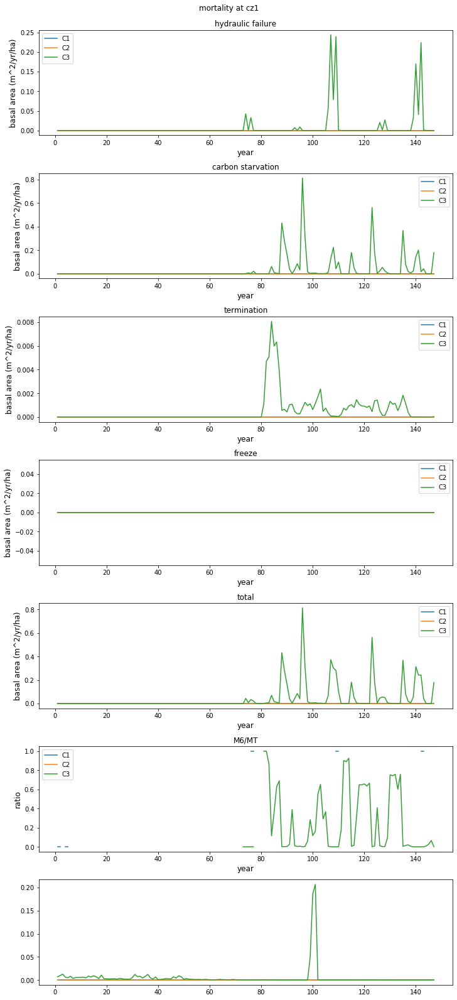

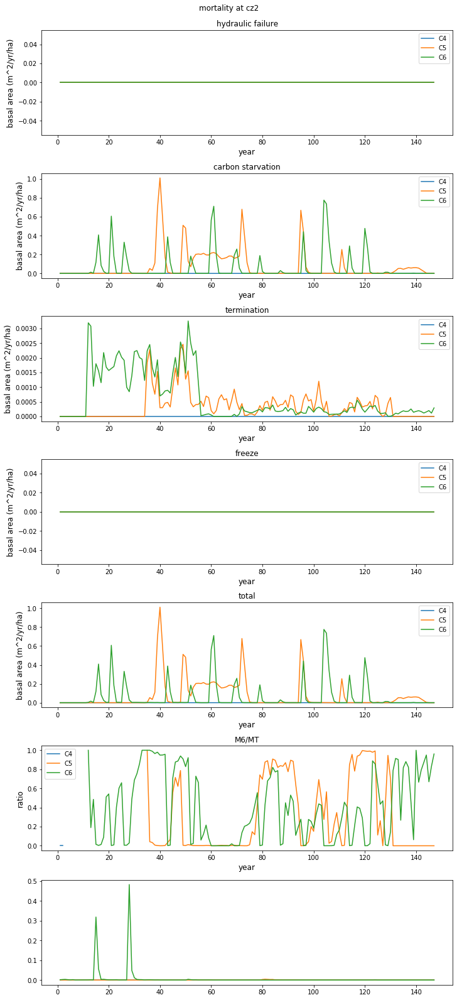

In [10]:
# plot the mortality ratio of the whole community
fig,MTplt=plt.subplots(nrows=7,ncols=1,figsize=(10,22),constrained_layout=True) 
fig.suptitle("mortality at cz1")
inst=2
for cida in [1,2,3]:
   MTplt[0].plot(range(1,150-2), M2yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[1].plot(range(1,150-2), M3yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[2].plot(range(1,150-2), M6yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[3].plot(range(1,150-2), M8yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[4].plot(range(1,150-2), MTyrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[5].plot(range(1,150-2), M6ratio[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[6].plot(range(1,150-2), DBAyrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))


for i in range(0,6):
  MTplt[i].set_title(Thetitle[i])
  MTplt[i].set_xlabel("year",fontsize=12)
  if i==5:
    MTplt[i].set_ylabel("ratio",fontsize=12)    
  else:  
    MTplt[i].set_ylabel("basal area (m^2/yr/ha)",fontsize=12)    
  MTplt[i].legend()  


fig,MTplt=plt.subplots(nrows=7,ncols=1,figsize=(10,22),constrained_layout=True) 
fig.suptitle("mortality at cz2")
for cida in [4,5,6]:
   MTplt[0].plot(range(1,150-2), M2yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[1].plot(range(1,150-2), M3yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[2].plot(range(1,150-2), M6yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[3].plot(range(1,150-2), M8yrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[4].plot(range(1,150-2), MTyrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[5].plot(range(1,150-2), M6ratio[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))
   MTplt[6].plot(range(1,150-2), DBAyrmean_baSum[cida][inst][1:150-2], linewidth=1.5,label="C"+str(cida))


for i in range(0,6):
  MTplt[i].set_title(Thetitle[i])
  MTplt[i].set_xlabel("year",fontsize=12)
  if i==5:
    MTplt[i].set_ylabel("ratio",fontsize=12)    
  else:  
    MTplt[i].set_ylabel("basal area (m^2/yr/ha)",fontsize=12)    
  MTplt[i].legend()  
 # plot scatter plot of growth vs. mortality of the whole population in terms of basal area

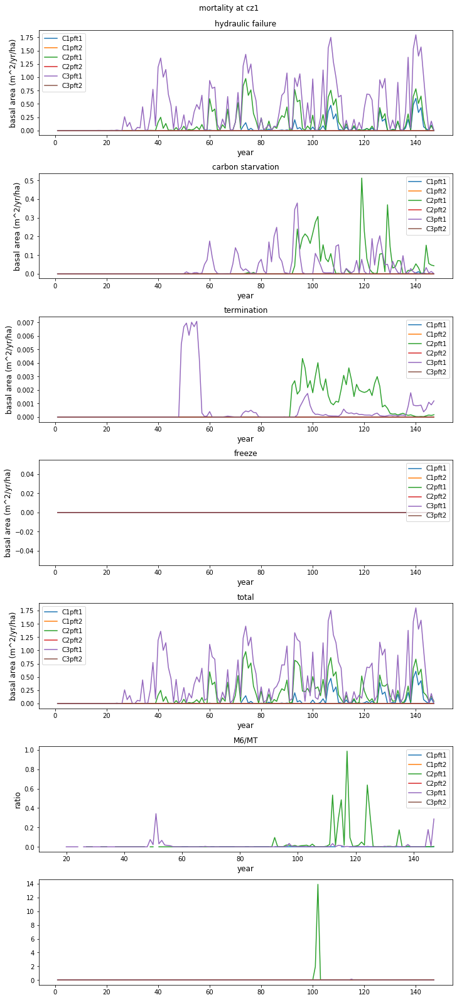

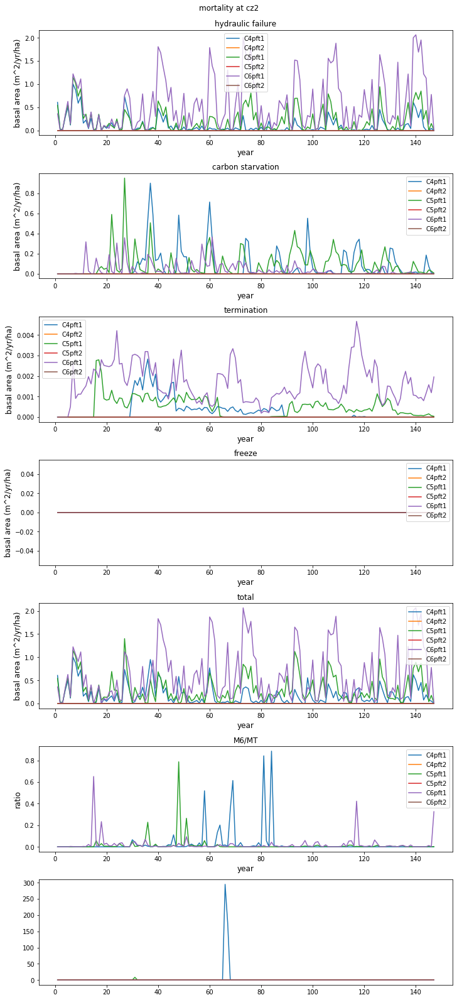

In [11]:
# plot the mortality ratio for each pft
fig,MTplt=plt.subplots(nrows=7,ncols=1,figsize=(10,22),constrained_layout=True) 
fig.suptitle("mortality at cz1")
for cida in [1,2,3]:
   for Thepft in [1,2]: 
     MTplt[0].plot(range(1,150-2), M2pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[1].plot(range(1,150-2), M3pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[2].plot(range(1,150-2), M6pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[3].plot(range(1,150-2), M8pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[4].plot(range(1,150-2), MTpftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[5].plot(range(1,150-2), M6pftratio[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[6].plot(range(1,150-2), DBApftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))


for i in range(0,6):
  MTplt[i].set_title(Thetitle[i])
  MTplt[i].set_xlabel("year",fontsize=12)
  if i==5:
    MTplt[i].set_ylabel("ratio",fontsize=12)    
  else:  
    MTplt[i].set_ylabel("basal area (m^2/yr/ha)",fontsize=12)    
  MTplt[i].legend()  


fig,MTplt=plt.subplots(nrows=7,ncols=1,figsize=(10,22),constrained_layout=True) 
fig.suptitle("mortality at cz2")
for cida in [4,5,6]:
   for Thepft in [1,2]: 
     MTplt[0].plot(range(1,150-2), M2pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[1].plot(range(1,150-2), M3pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[2].plot(range(1,150-2), M6pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[3].plot(range(1,150-2), M8pftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[4].plot(range(1,150-2), MTpftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[5].plot(range(1,150-2), M6pftratio[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))
     MTplt[6].plot(range(1,150-2), DBApftyrmean_baSum[cida][3][1:150-2,Thepft], linewidth=1.5,label="C"+str(cida)+"pft"+str(Thepft))


for i in range(0,6):
  MTplt[i].set_title(Thetitle[i])
  MTplt[i].set_xlabel("year",fontsize=12)
  if i==5:
    MTplt[i].set_ylabel("ratio",fontsize=12)    
  else:  
    MTplt[i].set_ylabel("basal area (m^2/yr/ha)",fontsize=12)    
  MTplt[i].legend()  
 # plot scatter plot of growth vs. mortality of the whole population in terms of basal area

Figure S1. Communnity level properties: AGB, LAI,TBA,GPP,QVEGT at 2 sites under 3 CO2 treatment


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


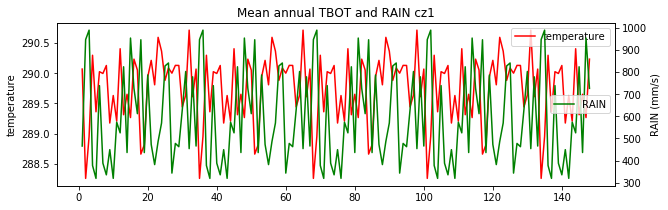

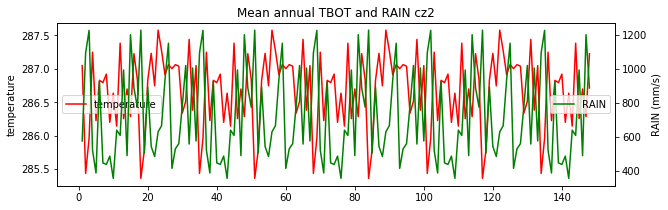

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


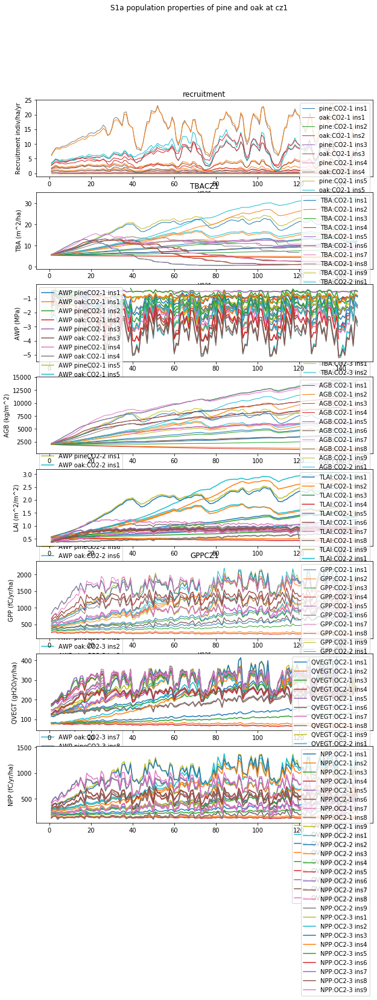

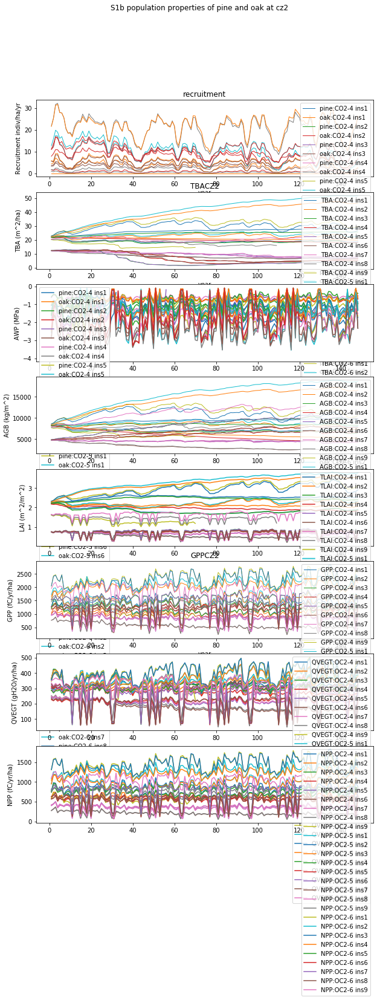

In [12]:
# plot recruitment
# Results figure 1
print("Figure S1. Communnity level properties: AGB, LAI,TBA,GPP,QVEGT at 2 sites under 3 CO2 treatment")
fig,figmet1 = plt.subplots(figsize=(10,3))
figmet1.plot(range(1,150-1), TBOTyrmean[1][1:150-1], c="red",label="temperature")
figmet1.set_ylabel("temperature")
figmet1.set_title("Mean annual TBOT and RAIN cz1")
figmet1b=figmet1.twinx() 
figmet1b.plot(range(1,150-1), RAINyrmean[1][1:150-1], c="green",label="RAIN")
figmet1b.set_ylabel("RAIN (mm/s)") 
figmet1.legend()
figmet1b.legend()

fig,figmet2 = plt.subplots(figsize=(10,3))
figmet2.plot(range(1,150-1), TBOTyrmean[4][1:150-1], c="red",label="temperature")
figmet2.set_ylabel("temperature")
figmet2.set_title("Mean annual TBOT and RAIN cz2")
figmet2b=figmet2.twinx() 
figmet2b.plot(range(1,150-1), RAINyrmean[4][1:150-1], c="green",label="RAIN")
figmet2b.set_ylabel("RAIN (mm/s)") 
figmet2.legend()
figmet2b.legend()

#sets=np.array([1,2])  #3,21
sets=np.arange(1,10)
cases=np.array([1,2,3])
fig, (figplt1, figplt2,figplt2b, figplt3,figplt3b,figplt4,figplt4b,figplt4c) = plt.subplots(nrows=8,ncols=1, figsize=(10,22),constrained_layout=True)
fig.suptitle("S1a population properties of pine and oak at cz1")
for pcid in cases:
    
   for pinst in sets:
     figplt1.plot(range(1,150-1), RECpftyrmean[pcid][pinst][1:150-1,0], linewidth=1,label="pine:CO2-"+str(pcid)+" ins"+str(pinst))
     figplt1.plot(range(1,150-1), RECpftyrmean[pcid][pinst][1:150-1,1], linewidth=1,label="oak:CO2-"+str(pcid)+" ins"+str(pinst))   

     figplt2.plot(range(1,150-1), TBAyrmean[pcid][pinst][1:150-1], linewidth=1,label="TBA:CO2-"+str(pcid)+" ins"+str(pinst))

     figplt2b.plot(range(1,150-1), AWPyrmean[pcid][pinst][1:150-1,3], label="AWP pineCO2-"+str(pcid)+" ins"+str(pinst))
     figplt2b.plot(range(1,150-1), AWPyrmean[pcid][pinst][1:150-1,15], label="AWP oak:CO2-"+str(pcid)+" ins"+str(pinst))
     
     #figplt2c.legend()

     figplt3.plot(range(1,150-1), AGByrmean[pcid][pinst][1:150-1], linewidth=1,label="AGB:CO2-"+str(pcid)+" ins"+str(pinst))
     #figplt3b=figplt3.twinx() 
     figplt3b.plot(range(1,150-1), TLAIyrmean[pcid][pinst][1:150-1], label="TLAI:CO2-"+str(pcid)+" ins"+str(pinst))
             
     figplt4.plot(range(1,150-1), GPPyrmean[pcid][pinst][1:150-1], linewidth=1,label="GPP:CO2-"+str(pcid)+" ins"+str(pinst))
#     figplt4b=figplt4.twinx() 
     figplt4b.plot(range(1,150-1), QVEGTyrmean[pcid][pinst][1:150-1], label="QVEGT:OC2-"+str(pcid)+" ins"+str(pinst))
     figplt4c.plot(range(1,150-1), NPPyrmean[pcid][pinst][1:150-1], label="NPP:OC2-"+str(pcid)+" ins"+str(pinst))
      
    # figplt5.plot(range(1,150-1), MTyrmean[pcid][pinst][1:150-1,3], linewidth=1,label="Pine:CO2-"+str(pcid)+" ins"+str(pinst))
    # figplt5.plot(range(1,150-1), MTyrmean[pcid][pinst][1:150-1,15], linewidth=1,label="Oak:CO2-"+str(pcid)+" ins"+str(pinst))

        #     figplt4b=figplt4.twinx() 
     #figplt5b.plot(range(1,150-1), M2yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5b.plot(range(1,150-1), M2yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5c.plot(range(1,150-1), M3yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))    
     #figplt5c.plot(range(1,150-1), M3yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))

     #figplt5d.plot(range(1,150-1), M6yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5d.plot(range(1,150-1), M6yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5e.plot(range(1,150-1), M8yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))    
     #figplt5e.plot(range(1,150-1), M8yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))
        
        
figplt1.set_title("recruitment")  
figplt1.set_xlabel("year")    
figplt1.set_ylabel("Recruitment indiv/ha/yr")  
figplt1.legend()    

figplt2.set_title("TBA"+"CZ1")  
figplt2.set_xlabel("year")
figplt2.set_ylabel("TBA (m^2/ha)")  
figplt2b.set_ylabel("AWP (MPa)") 
figplt2.legend()
figplt2b.legend()

figplt3.set_ylabel("AGB (kg/m^2)") 
figplt3.legend()

figplt3b.set_ylabel("LAI (m^2/m^2)") 
figplt3b.legend()
        
figplt4.set_title("GPP"+"CZ1")    
figplt4.set_xlabel("year")
figplt4.set_ylabel("GPP (fC/yr/ha)")     
figplt4.legend()
figplt4b.set_ylabel("QVEGT (gH2O/yr/ha)") 
figplt4b.legend()
figplt4c.set_ylabel("NPP (fC/yr/ha)") 
figplt4c.legend()

#figplt5.set_title("MT :c"+str(pcid)+" ins"+str(pinst)+"CZ1")    
#figplt5.set_xlabel("year")
#figplt5.set_ylabel("%/year")     
#figplt5.legend()
#figplt5b.set_ylabel("M2 (%/yr)") 
#figplt5b.legend()
#figplt5c.set_ylabel("M3 (%/yr)") 
#figplt5c.legend()

#figplt5d.set_ylabel("M6 Termination (%/yr)") 
#figplt5d.legend()
#figplt5e.set_ylabel("M8 Freeze (%/yr)") 
#figplt5e.legend()
#  plot for cz2    
cases=np.array([4,5,6])

fig, (figplt1, figplt2,figplt2b,figplt3 ,figplt3b,figplt4,figplt4b,figplt4c) = plt.subplots(nrows=8,ncols=1, figsize=(10,22),constrained_layout=True)
fig.suptitle("S1b population properties of pine and oak at cz2")
for pcid in cases:
    
   for pinst in sets:
     figplt1.plot(range(1,150-1), RECpftyrmean[pcid][pinst][1:150-1,0], linewidth=1,label="pine:CO2-"+str(pcid)+" ins"+str(pinst))
     figplt1.plot(range(1,150-1), RECpftyrmean[pcid][pinst][1:150-1,1], linewidth=1,label="oak:CO2-"+str(pcid)+" ins"+str(pinst))   

     figplt2.plot(range(1,150-1), TBAyrmean[pcid][pinst][1:150-1], linewidth=1,label="TBA:CO2-"+str(pcid)+" ins"+str(pinst))

     figplt2b.plot(range(1,150-1), AWPyrmean[pcid][pinst][1:150-1,3], label="pine:CO2-"+str(pcid)+" ins"+str(pinst))
     figplt2b.plot(range(1,150-1), AWPyrmean[pcid][pinst][1:150-1,15], label="oak:CO2-"+str(pcid)+" ins"+str(pinst))
     
     #figplt2c.legend()

     figplt3.plot(range(1,150-1), AGByrmean[pcid][pinst][1:150-1], linewidth=1,label="AGB:CO2-"+str(pcid)+" ins"+str(pinst))
     #figplt3b=figplt3.twinx() 
     figplt3b.plot(range(1,150-1), TLAIyrmean[pcid][pinst][1:150-1], label="TLAI:CO2-"+str(pcid)+" ins"+str(pinst))
             
     figplt4.plot(range(1,150-1), GPPyrmean[pcid][pinst][1:150-1], linewidth=1,label="GPP:CO2-"+str(pcid)+" ins"+str(pinst))
#     figplt4b=figplt4.twinx() 
     figplt4b.plot(range(1,150-1), QVEGTyrmean[pcid][pinst][1:150-1], label="QVEGT:OC2-"+str(pcid)+" ins"+str(pinst))
     figplt4c.plot(range(1,150-1), NPPyrmean[pcid][pinst][1:150-1], label="NPP:OC2-"+str(pcid)+" ins"+str(pinst))
      
     #figplt5.plot(range(1,150-1), MTyrmean[pcid][pinst][1:150-1,3], linewidth=1,label="Pine:CO2-"+str(pcid)+" ins"+str(pinst))
     #figplt5.plot(range(1,150-1), MTyrmean[pcid][pinst][1:150-1,15], linewidth=1,label="Oak:CO2-"+str(pcid)+" ins"+str(pinst))

        #     figplt4b=figplt4.twinx() 
     #figplt5b.plot(range(1,150-1), M2yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5b.plot(range(1,150-1), M2yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5c.plot(range(1,150-1), M3yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))    
     #figplt5c.plot(range(1,150-1), M3yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))

     #figplt5d.plot(range(1,150-1), M6yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5d.plot(range(1,150-1), M6yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))
     #figplt5e.plot(range(1,150-1), M8yrmean[pcid][pinst][1:150-1,3], label="Pine:OC2-"+str(pcid)+" ins"+str(pinst))    
     #figplt5e.plot(range(1,150-1), M8yrmean[pcid][pinst][1:150-1,15], label="Oak:OC2-"+str(pcid)+" ins"+str(pinst))

                
figplt1.set_title("recruitment")  
figplt1.set_xlabel("year")    
figplt1.set_ylabel("Recruitment indiv/ha/yr")  
figplt1.legend()    

figplt2.set_title("TBA"+"CZ2")  
figplt2.set_xlabel("year")
figplt2.set_ylabel("TBA (m^2/ha)")  
figplt2b.set_ylabel("AWP (MPa)") 
figplt2.legend()
figplt2b.legend()

figplt3.set_ylabel("AGB (kg/m^2)") 
figplt3.legend()

figplt3b.set_ylabel("LAI (m^2/m^2)") 
figplt3b.legend()
        
figplt4.set_title("GPP"+"CZ2")    
figplt4.set_xlabel("year")
figplt4.set_ylabel("GPP (fC/yr/ha)")     
figplt4.legend()
figplt4b.set_ylabel("QVEGT (gH2O/yr/ha)") 
figplt4b.legend()
figplt4c.set_ylabel("NPP (fC/yr/ha)") 
figplt4c.legend()

#figplt5.set_title("MT :c"+str(pcid)+" ins"+str(pinst)+"CZ2")    
#figplt5.set_xlabel("year")
#figplt5.set_ylabel("%/year")     
#figplt5.legend()
#figplt5b.set_ylabel("M2 HF (%/yr)") 
#figplt5b.legend()
#figplt5c.set_ylabel("M3 CS (%/yr)") 
#figplt5c.legend()

#figplt5d.set_ylabel("M6 Termination (%/yr)") 
#figplt5d.legend()
#figplt5e.set_ylabel("M8 Freeze (%/yr)") 
#figplt5e.legend()

#histpl.hist(AWPyrmean[pcid][pinst][1:150-1,1+pftadj], bins=10)

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/global/softwa

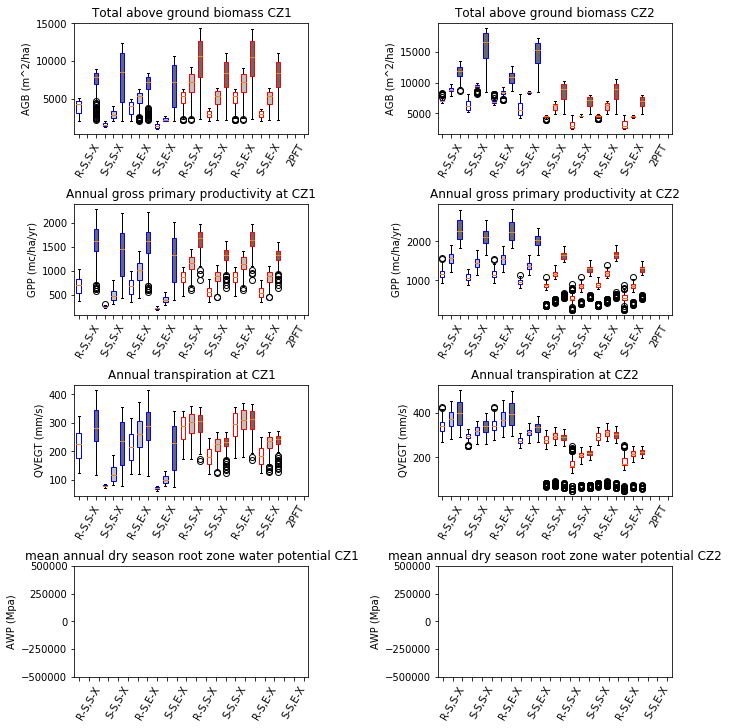

In [40]:
# Figure 1, boxplot community level properties by cz1 and cz2
# 1a AGB, 1b GPP, 1c QVEGT, 1d WUE
TickID=np.arange(1,28)

# define box color
boxcl=np.array(['blue','red','purple']) # distinguish pft: 1pft pine - green, 1pft oak - orange, 2pft - black

# define fill color, represent CO2 level, 
fcl=np.array(['white','silver','dimgray'])

#  note % symbol in python is to get the remainder of a / function
# e.g 11%3 -> 2

#TickText=''
TickText=np.array(['','R-S,S-X','','','S-S,S-X','','','R-S,E-X','','','S-S,E-X','','','R-S,S-X','','','S-S,S-X','',
                   '','R-S,E-X','','','S-S,E-X','','','2PFT',''])
# vert=True,  # vertical box alignment
#                     patch_artist=True,  # fill with color
#                     labels=labels
# create two dataframe 
fig, bp = plt.subplots(nrows=4,ncols=2,figsize=(10,10),constrained_layout=True)

# fig 1a AGB
bpdata=np.nan*np.empty((27,147))  # define an array to contain bp variable
did=0
for sid in range(1,10):
  for cid in [1,2,3]: 
  
    bpdata[did]=AGByrmean[cid][sid][1:148]
    did=did+1  
bpx = bp[0][0].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[0][0].set_ylabel("AGB (m^2/ha)") 
bp[0][0].set_title("Total above ground biomass CZ1")
bp[0][0].set_xticklabels(TickText,rotation = 60)

for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)

#plt.setp(bp['whiskers'], color='black')
#plt.setp(bp['fliers'], color='red', marker='+')
# change length of the array once have the right data - no nan values

bpdata=np.nan*np.empty((27,147)) 
did=0
for sid in range(1,10):
  for cid in [4,5,6]: 
    
    bpdata[did]=AGByrmean[cid][sid][1:148]
    #print(did,":",bpdata[did])
    did=did+1  
bpx = bp[0][1].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[0][1].set_ylabel("AGB (m^2/ha)") 
bp[0][1].set_title("Total above ground biomass CZ2")
bp[0][1].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)
# fig 1b GPP

bpdata=np.nan*np.empty((27,147))  # define an array to contain bp variable
did=0
for sid in range(1,10):
  for cid in [1,2,3]: 
  
    bpdata[did]=GPPyrmean[cid][sid][1:148]
    did=did+1  
bpx = bp[1][0].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[1][0].set_ylabel("GPP (mc/ha/yr)") 
bp[1][0].set_title("Annual gross primary productivity at CZ1")
bp[1][0].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)
# change length of the array once have the right data - no nan values
bpdata=np.nan*np.empty((27,147)) 
did=0
for sid in range(1,10):
  for cid in [4,5,6]: 
    
    bpdata[did]=GPPyrmean[cid][sid][1:148]
    #print(did,":",bpdata[did])
    did=did+1  
bpx = bp[1][1].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[1][1].set_ylabel("GPP (mc/ha/yr)") 
bp[1][1].set_title("Annual gross primary productivity at CZ2")
bp[1][1].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)

# fig1c annual transpiration

bpdata=np.nan*np.empty((27,147))  # define an array to contain bp variable
did=0
for sid in range(1,10):
  for cid in [1,2,3]: 
  
    bpdata[did]=QVEGTyrmean[cid][sid][1:148]
    did=did+1  
bpx = bp[2][0].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[2][0].set_ylabel("QVEGT (mm/s)") 
bp[2][0].set_title("Annual transpiration at CZ1")
bp[2][0].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)
# change length of the array once have the right data - no nan values
bpdata=np.nan*np.empty((27,147)) 
did=0
for sid in range(1,10):
  for cid in [4,5,6]: 
    
    bpdata[did]=QVEGTyrmean[cid][sid][1:148]
    #print(did,":",bpdata[did])
    did=did+1  
bpx = bp[2][1].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23],
                  bpdata[24],bpdata[25],bpdata[26]],
                vert=True,patch_artist=True)
bp[2][1].set_ylabel("QVEGT (mm/s)") 
bp[2][1].set_title("Annual transpiration at CZ2")
bp[2][1].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)
# plot AWP of pine and oak 1pft cases
# AWPpftyrmean[cid][theins][Ytime][Thepft]
did=0
for id in range(1,9):
  for cid in [1,2,3]: 
    if id <=4:
       bpdata[did]=AWPpftyrmean[cid][sid][1:148,1]
    else:
       bpdata[did]=AWPpftyrmean[cid][sid][1:148,2] 
    #print(did,":",bpdata[did])
    did=did+1  
bpx = bp[3][0].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23]],
                vert=True,patch_artist=True)
bp[3][0].set_ylabel("AWP (Mpa)") 
bp[3][0].set_title("mean annual dry season root zone water potential CZ1")
bp[3][0].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)
did=0
for id in range(1,9):
  for cid in [4,5,6]: 
    if id <=4:
       bpdata[did]=AWPpftyrmean[cid][sid][1:148,1]
    else:
       bpdata[did]=AWPpftyrmean[cid][sid][1:148,2] 
    #print(did,":",bpdata[did])
    did=did+1  
bpx = bp[3][1].boxplot([bpdata[0],bpdata[1],bpdata[2],bpdata[3],bpdata[4],bpdata[5],
                  bpdata[6],bpdata[7],bpdata[8],bpdata[9],bpdata[10],bpdata[11],
                  bpdata[12],bpdata[13],bpdata[14],bpdata[15],bpdata[16],bpdata[17],
                  bpdata[18],bpdata[19],bpdata[20],bpdata[21],bpdata[22],bpdata[23]],
                vert=True,patch_artist=True)
bp[3][1].set_ylabel("AWP (Mpa)") 
bp[3][1].set_title("mean annual dry season root zone water potential CZ2")
bp[3][1].set_xticklabels(TickText,rotation = 60)
for i in range(0,did):
   j=int(i/12) 
   plt.setp(bpx['boxes'][i], facecolor = fcl[i%3],edgecolor=boxcl[j], linewidth=1)

Figcaption="S-S safe stome, R-S risky stoma, S-X safe xylem, E-X efficient xylem"

Figure 2 dynamic of cohorts: a)basal area, b)number individual, 3)mortality rate


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:12: RuntimeWarning: divide by zero encountered in log10
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:16: RuntimeWarning: divide by zero encountered in log10
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


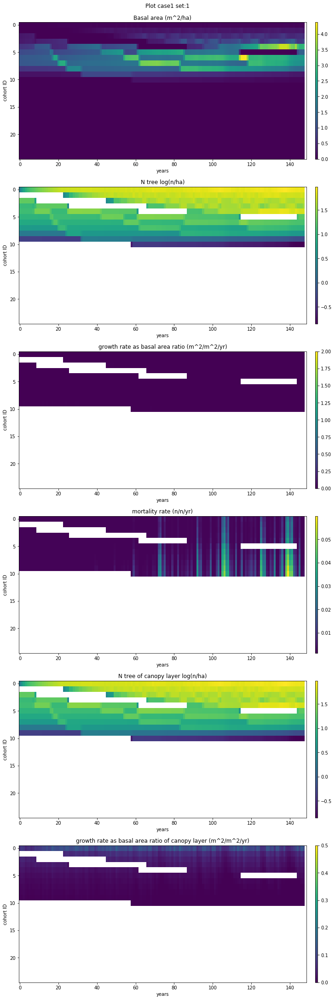

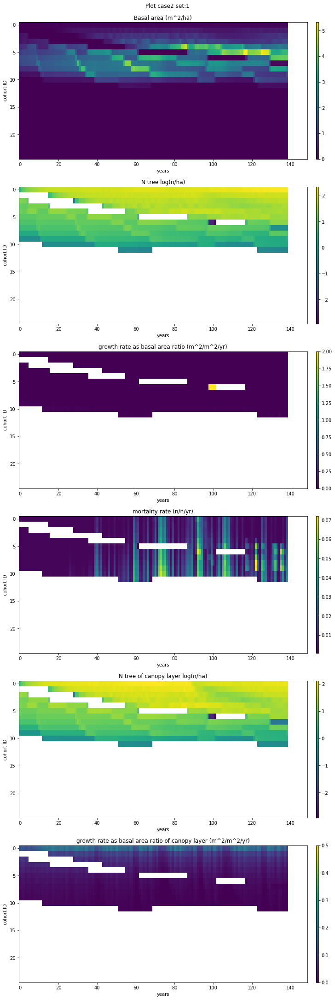

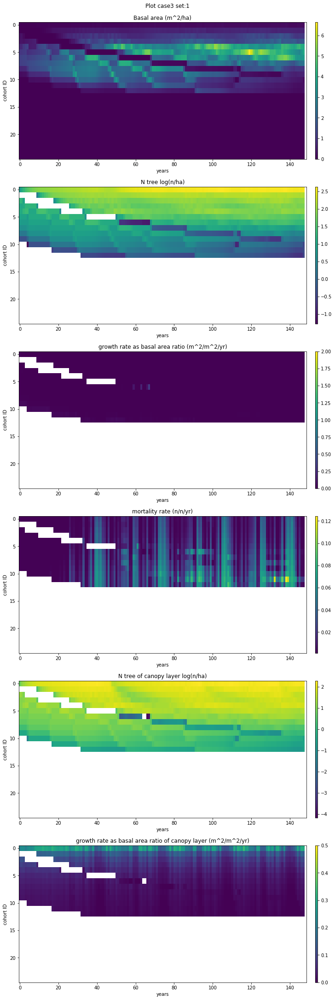

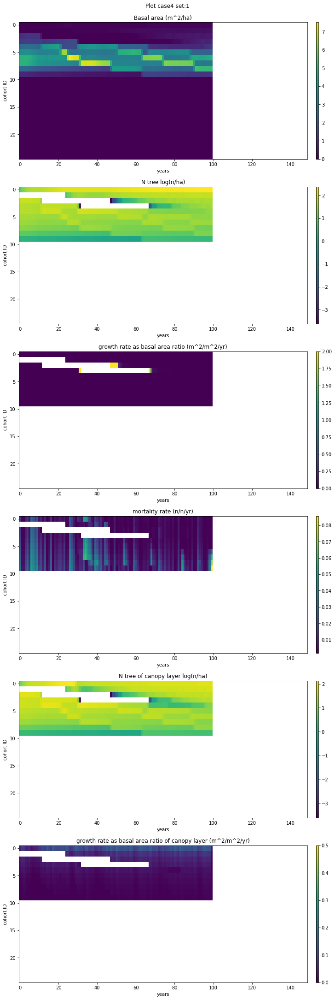

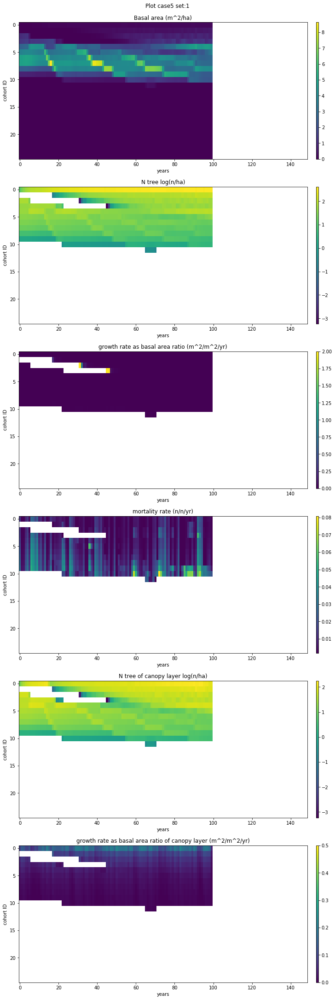

...

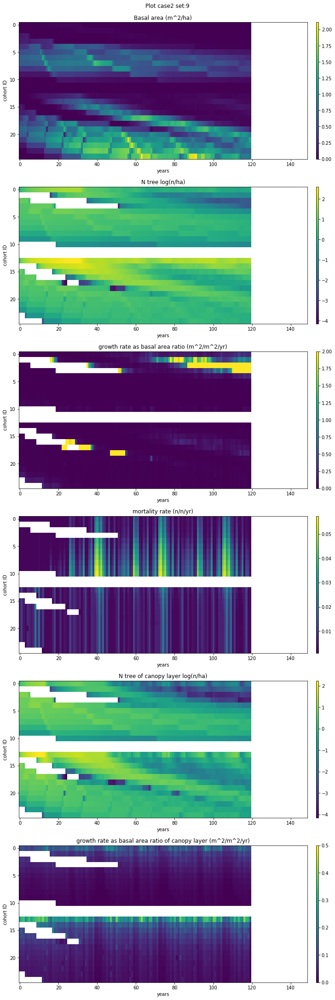

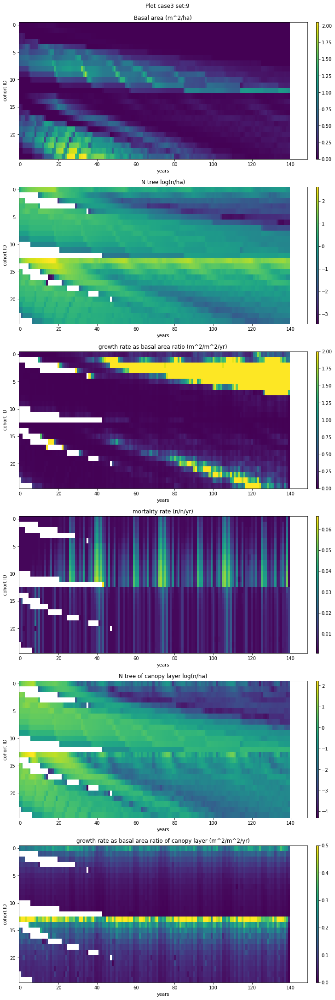

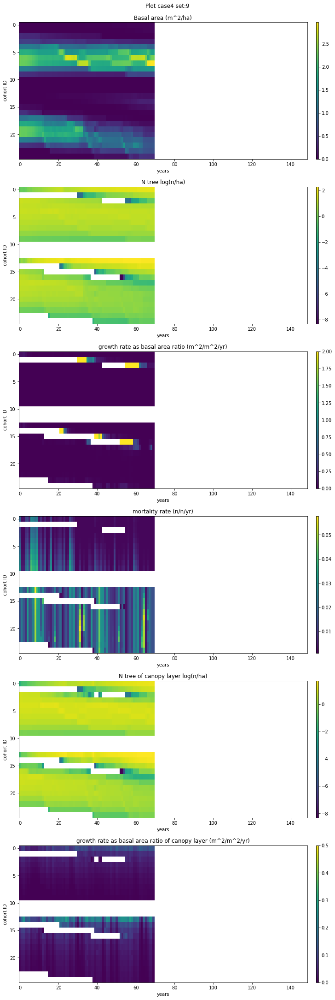

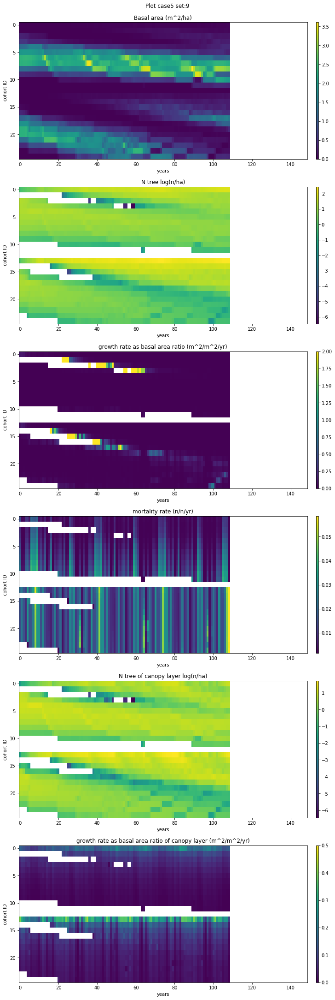

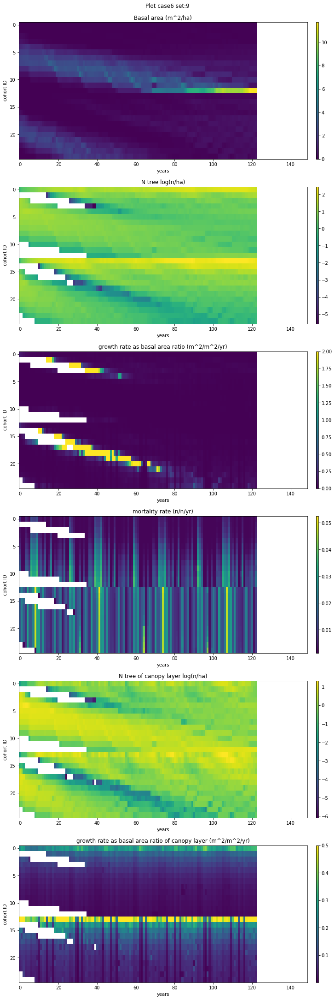

In [13]:
# Resultes figure 2
# plot map ofBAyrmean, NPLANTyrmean, GRyrmean,  MTyrmean  
# by time and size class
# reference https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
print("Figure 2 dynamic of cohorts: a)basal area, b)number individual, 3)mortality rate")
cases=np.array([1,2,3,4,5,6])
sets=np.array([1,2,3,4,5,6,7,8,9])
pinst=3
for pinst in sets:
  for pcid in cases:
    Z1=np.transpose(BAyrmean[pcid][pinst][1:150,0:25])
    Z2=np.transpose(np.log10(NPLANTyrmean[pcid][pinst][1:150,0:25]))
    Z3=np.transpose(GRyrmean[pcid][pinst][1:150,0:25])
    Z4=np.transpose(MTyrmean[pcid][pinst][1:150,0:25])
    # plot NPLANT and GR of canopy level  
    Z5=np.transpose(np.log10(NPLANT_CANyrmean[pcid][pinst][1:150,0:25]))  
    Z6=np.transpose(GR_CANyrmean[pcid][pinst][1:150,0:25])


  #  print("Z3,Z4",np.nanmax(Z3),np.nanmin(Z3),np.nanmax(Z4),np.nanmin(Z4))
    fig, figplt = plt.subplots(nrows=6,ncols=1, figsize=(10,30),constrained_layout=True)
    fig.suptitle("Plot case"+str(pcid)+" set:"+str(pinst))
    img0=figplt[0].imshow(Z1, aspect='auto')
    figplt[0].set_title("Basal area (m^2/ha)")  
    figplt[0].set_xlabel("years")
    figplt[0].set_ylabel("cohort ID")  
    fig.colorbar(img0, ax=figplt[0],location='right')
    # color bar example  
    #  neg = ax2.imshow(Zneg, cmap='Reds_r', interpolation='none')
    # fig.colorbar(neg, ax=ax2, location='right', anchor=(0, 0.3), shrink=0.7)
 
    
    img1=figplt[1].imshow(Z2, aspect='auto')
    figplt[1].set_title("N tree log(n/ha)")  
    figplt[1].set_xlabel("years")
    figplt[1].set_ylabel("cohort ID") 
    fig.colorbar(img1, ax=figplt[1],location='right')
    
    img2=figplt[2].imshow(Z3, aspect='auto',vmax=2)
    figplt[2].set_title("growth rate as basal area ratio (m^2/m^2/yr)")  
    figplt[2].set_xlabel("years")
    figplt[2].set_ylabel("cohort ID")  
    fig.colorbar(img2, ax=figplt[2],location='right')
               
    img3=figplt[3].imshow(Z4, aspect='auto')
    figplt[3].set_title("mortality rate (n/n/yr)")  
    figplt[3].set_xlabel("years")
    figplt[3].set_ylabel("cohort ID")  
    fig.colorbar(img3, ax=figplt[3],location='right')

    img4=figplt[4].imshow(Z5, aspect='auto')
    figplt[4].set_title("N tree of canopy layer log(n/ha)")  
    figplt[4].set_xlabel("years")
    figplt[4].set_ylabel("cohort ID")  
    fig.colorbar(img4, ax=figplt[4],location='right')

    img5=figplt[5].imshow(Z6, aspect='auto',vmax=0.5)
    figplt[5].set_title("growth rate as basal area ratio of canopy layer (m^2/m^2/yr)")  
    figplt[5].set_xlabel("years")
    figplt[5].set_ylabel("cohort ID")  
    fig.colorbar(img5, ax=figplt[5],location='right')

In [42]:
# create master table for means and medians
sets=np.arange(1,10)
setsP=np.array([1,2,3,4,9])
setsO=np.array([5,6,7,8,9])
cases=np.array([1,2,3,4,5,6])
CO2=np.array([283,385,566,283,385,566])
Thechid=0  # the cohort size id
# create an empty datafram 
# define column names
recid=0   # table key index
column_names = ["cid","CZ", "instid","PFT", "chid","CO2","DBAmn","MTbamn","GRmn","MTmn","GRmed","MTmed"]
ChStc = pd.DataFrame(columns = column_names)
for cid in cases:
    co2=CO2[cid-1]
    for theins in sets:
         
         # set chid range depends on instance
         if theins in setsP:
            ch0=0
            nch=13
         if theins in setsO:
            ch0=13
            nch=26
         for chid in range (ch0,nch):
             #print(recid)
             GRmn=np.nanmean(GR_CANyrmean[cid][theins][1:149,chid])
             MTmn=np.nanmean(MT_CANadjyrmean[cid][theins][1:149,chid])  
             GRmed=np.nanmedian(GR_CANyrmean[cid][theins][1:149,chid])
             MTmed=np.nanmedian(MT_CANadjyrmean[cid][theins][1:149,chid])              
             DBAmn=10000*np.nanmean(DBA_CANadjyrmean[cid][theins][1:149,chid])
             MTbamn=10000*np.nanmean(MTba_CANadjyrmean[cid][theins][1:149,chid])
             if cid<=3:
                cz=1
             else:
                cz=2
             if chid<=12:
               thepft=1
               thechid=chid
             else:
                thepft=2
                thechid=chid-13
             #print(MTbamn)
             ChStc.loc[recid]=[cid,cz,theins,thepft,thechid,co2,DBAmn,MTbamn,GRmn,MTmn,GRmed,MTmed] 
             recid=recid+1
            
            
recid=0   # table key index
column_names = ["cid", "CZ","instid","PFT", "chid","DBAmn","MTbamn"]
ChStcUND = pd.DataFrame(columns = column_names)
for cid in cases:
    for theins in sets:
         if theins in setsP:
            ch0=0
            nch=13
         if theins in setsO:
            ch0=13
            nch=26
         for chid in range (ch0,nch):
             #print(recid)

             DBAmn=10000*np.nanmean(DBA_UNDadjyrmean[cid][theins][70:149,chid])
             MTbamn=10000*np.nanmean(MTba_UNDadjyrmean[cid][theins][70:149,chid])
             if cid<=3:
                cz=1
             else:
                cz=2
             if chid<=12:
               thepft=1
               thechid=chid
             else:
                thepft=2
                thechid=chid-13
             #print(MTbamn)
             ChStcUND.loc[recid]=[cid,cz,theins,thepft,thechid,DBAmn,MTbamn] 
             recid=recid+1
            


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:26: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:27: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/apps/ml/tensorflow/2.3.0-py37/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:30: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:31: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:61: RuntimeWarning: Mean of empty slice
/global/software/sl-7.x86_64/modules/langs/python/3

In [ ]:
# figures for results and discussion 
figure 3 growth rate vs. mortality rate of selected size class (or average of all size class) of canopy layer 

Figure 4 growth rate vs. awp and temperature
Figure 5 mortality rate vs. awp and temperature
Figure 6 TBA or TAGB vs. awp grouped by a) precipitation and b) temperature

Figure 7 GPP vs QVEGT (population level), GPPtree vs. QVEGtree (individual level)


In [18]:
ChStcSel

,cid,CZ,instid,PFT,chid,CO2,DBAmn,MTbamn,GRmn,MTmn,GRmed,MTmed
2,1,1,1,1,2,L,4.783736,0.550648,0.039001,0.004489,0.040751,0.002000
15,1,1,2,1,2,L,1.768911,0.245312,0.014422,0.002000,0.012827,0.002000
28,1,1,3,1,2,L,4.755078,0.441521,0.038768,0.003600,0.039996,0.002000
41,1,1,4,1,2,L,0.782266,0.245312,0.006378,0.002000,0.005573,0.002000
54,1,1,5,2,2,L,8.411381,1.111291,0.068577,0.009060,0.070721,0.006975
67,1,1,6,2,2,L,4.232172,0.790420,0.034504,0.006444,0.035485,0.004919
80,1,1,7,2,2,L,8.534139,1.084176,0.069578,0.008839,0.072868,0.006274
93,1,1,8,2,2,L,4.353531,1.040965,0.035494,0.008487,0.036616,0.004980
106,1,1,9,2,2,L,7.510275,0.800098,0.061230,0.006523,0.063453,0.005109
119,2,1,1,1,2,M,7.368889,0.909317,0.060078,0.007414,0.063851,0.002524


Figure 4. growth and mortality vs. cohort size


ValueError: scatter requires x column to be numeric

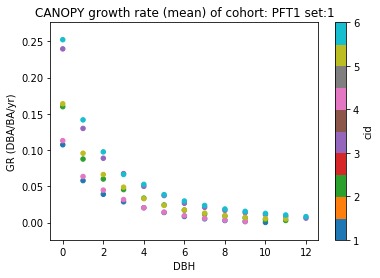

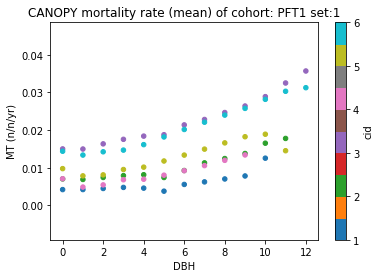

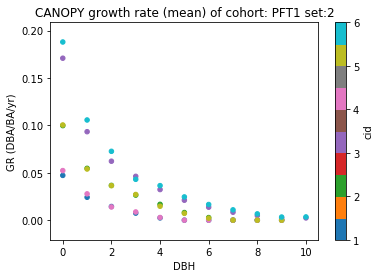

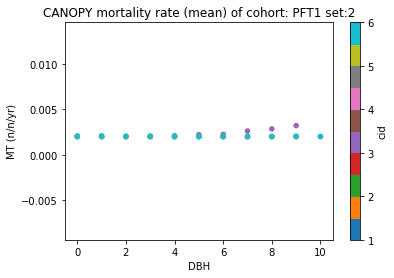

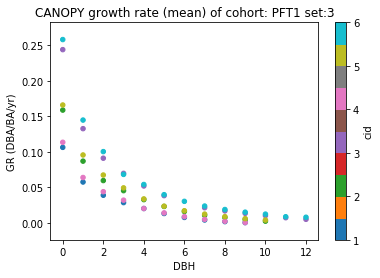

...

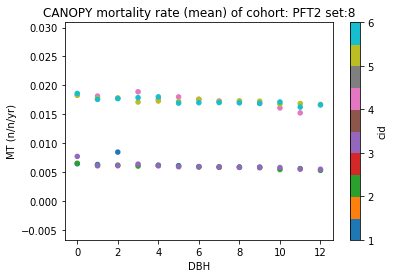

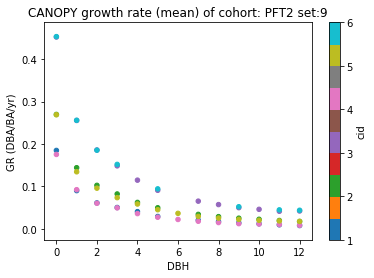

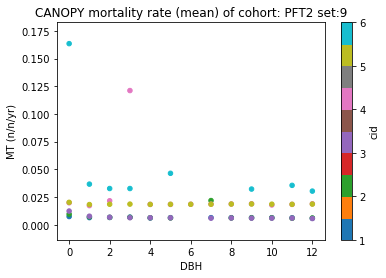

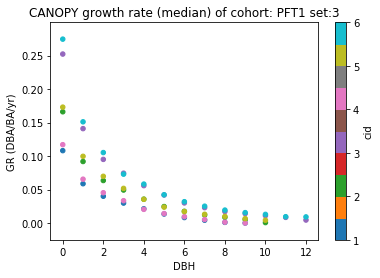

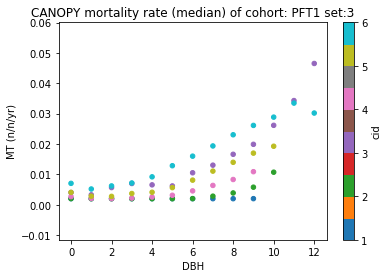

In [32]:
    
print("Figure 3a. growth and mortality vs. cohort size")
for theins in range (1,10):
    ChStcSelb=ChStc[(ChStc.cid.isin([1,2,3,4,5,6])) & (ChStc.instid.isin([theins]))& (ChStc['MTmn']<1)]
    if theins in setsP:
       thepft=1 
    if theins in setsO:
       thepft=2
    
    ChStcSelb0=ChStcSelb[ChStcSelb.PFT.isin([thepft])]

    ax1 = ChStcSelb0.plot.scatter(x='chid',y='GRmn',c='cid',colormap='tab10')
    ax1.set_title("CANOPY growth rate (mean) of cohort: PFT"+str(thepft)+" set:"+str(theins))
    ax1.set_xlabel("DBH")
    ax1.set_ylabel("GR (DBA/BA/yr)")
    ax1.xaxis.get_label().set_visible(True)    
    ax1.tick_params(axis='x', bottom=True, labelbottom=True)

    ax2 = ChStcSelb0.plot.scatter(x='chid',y='MTmn',c='cid',colormap='tab10')
    ax2.set_title("CANOPY mortality rate (mean) of cohort: PFT"+str(thepft)+" set:"+str(theins))
    ax2.set_xlabel("DBH")
    ax2.set_ylabel("MT (n/n/yr)")   
    ax2.xaxis.get_label().set_visible(True)
    ax2.tick_params(axis='x', bottom=True, labelbottom=True)
    
for theins in [3]:
  ChStcSelb=ChStc[(ChStc.cid.isin([1,2,3,4,5,6])) & (ChStc.instid.isin([theins]))]
  for thepft in [1,2]:
    ChStcSelb0=ChStcSelb[ChStcSelb.PFT.isin([thepft])]

    ax1 = ChStcSelb0.plot.scatter(x='chid',y='GRmed',c='cid',colormap='tab10')
    ax1.set_title("CANOPY growth rate (median) of cohort: PFT"+str(thepft)+" set:"+str(theins))
    ax1.set_xlabel("DBH")
    ax1.set_ylabel("GR (DBA/BA/yr)")
    ax1.xaxis.get_label().set_visible(True)    
    ax1.tick_params(axis='x', bottom=True, labelbottom=True)
    
    
    ax2 = ChStcSelb0.plot.scatter(x='chid',y='MTmed',c='cid',colormap='tab10')
    ax2.set_title("CANOPY mortality rate (median) of cohort: PFT"+str(thepft)+" set:"+str(theins))
    ax2.set_xlabel("DBH")
    ax2.set_ylabel("MT (n/n/yr)")      
    ax2.xaxis.get_label().set_visible(True)
    ax2.tick_params(axis='x', bottom=True, labelbottom=True)

Figure 4. Growth vs. mortality rate of a) Pine CZ2, b) Pine CZ2, c) Oak CZ1, d) Oak CZ2


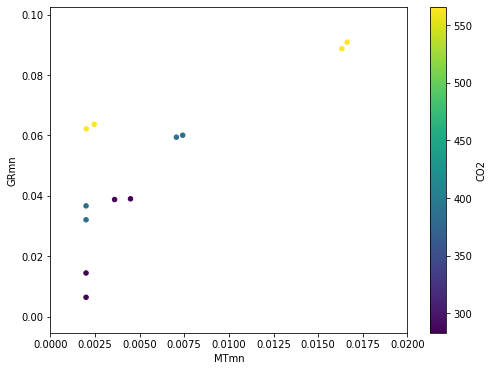

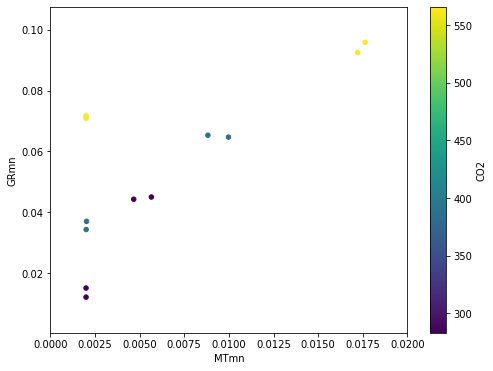

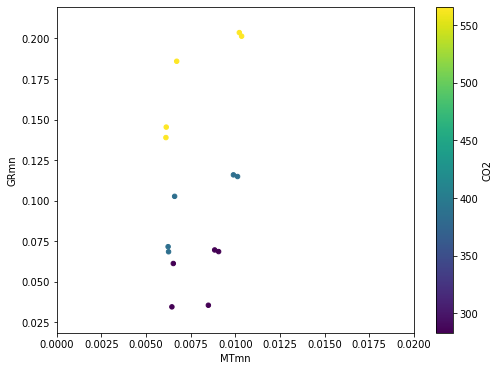

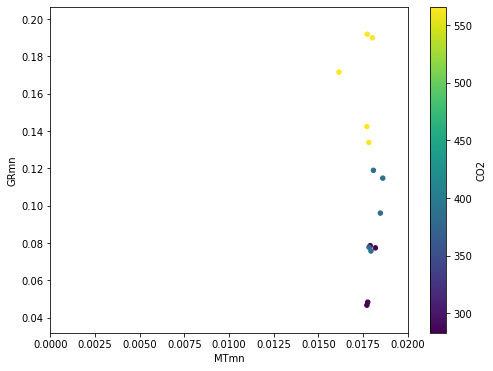

In [64]:
# plot figure 3 growth rate vs. mortality rate of canopy level
setsP=np.array([1,2,3,4,9])
setsO=np.array([5,6,7,8,9])
# seperate boxplot: czs and pfts: 
print("Figure 4. Growth vs. mortality rate of a) Pine CZ2, b) Pine CZ2, c) Oak CZ1, d) Oak CZ2")

# reference for the plot
# https://pandas.pydata.org/pandas-docs/version/0.23/generated/pandas.DataFrame.plot.html
for chid in range(2,3):
    ChStcSel=ChStc[(ChStc.chid.isin([chid]))]  
    gp_ChStcSel=ChStcSel.groupby(['PFT','CZ'])
    ax1 = gp_ChStcSel.plot(x='MTmn',y='GRmn',kind = 'scatter',subplots = True,  
                           figsize=(8,6), sharex=False, 
                           xlim=[0,0.02],c='CO2',colormap='viridis')
    #ax1.title("CANOPY size"+str(DBH[chid])+"cm DBH ins:"+str(theins))  ,s=(ChStcSel["cid"]+2)**2 ,layout=(2, 2)
    #plt.set_xlabel("MT") ['Pine CZ1'],['Pine CZ2'],['Oak CZ1'],['Oak CZ2'], title=(['Pine CZ1'],['Pine CZ2'],['Oak CZ1'],['Oak CZ2']),

    #ax1.xaxis.get_label().set_visible(True)    
    #ax1.tick_params(axis='x', bottom=True, labelbottom=True)
       

In [16]:
cases

array([1, 2, 3, 4, 5, 6])

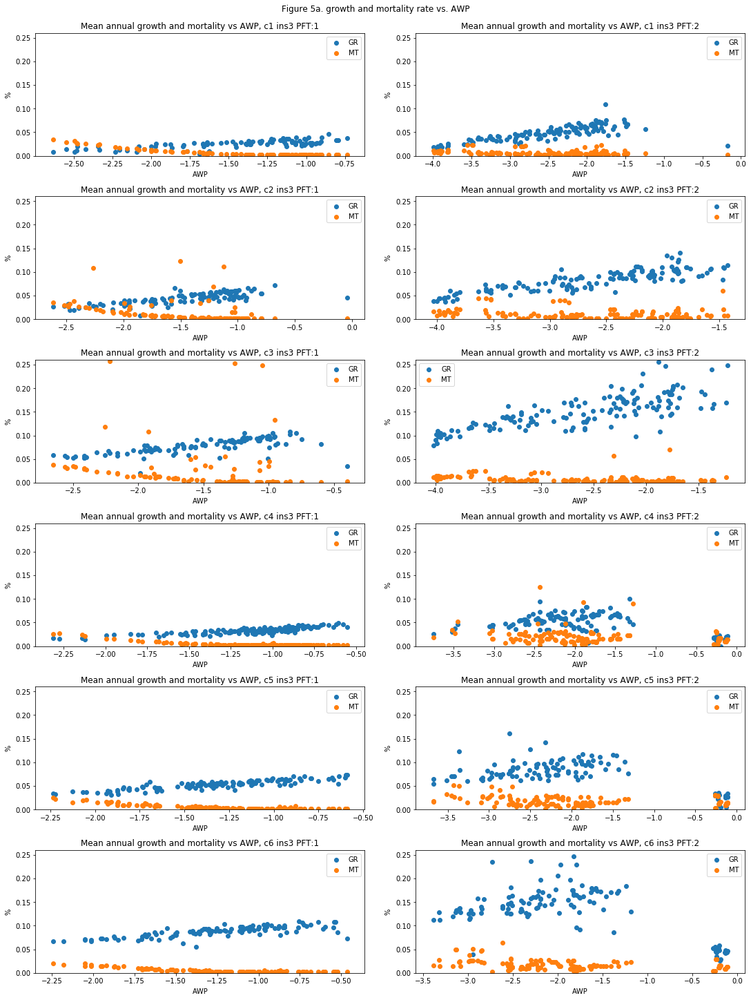

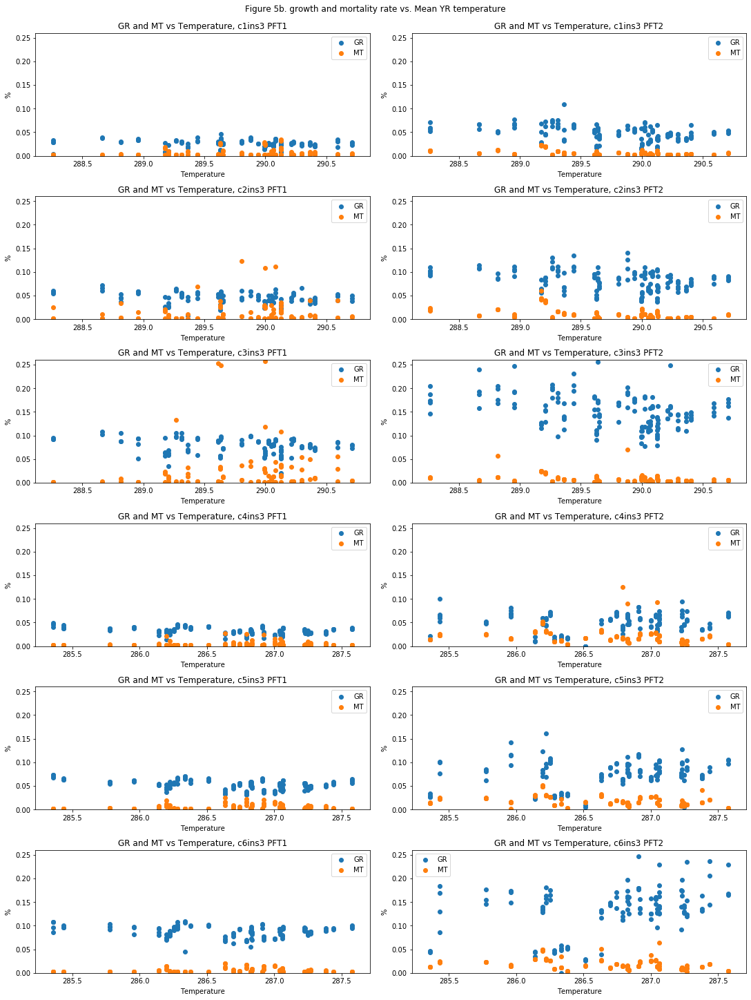

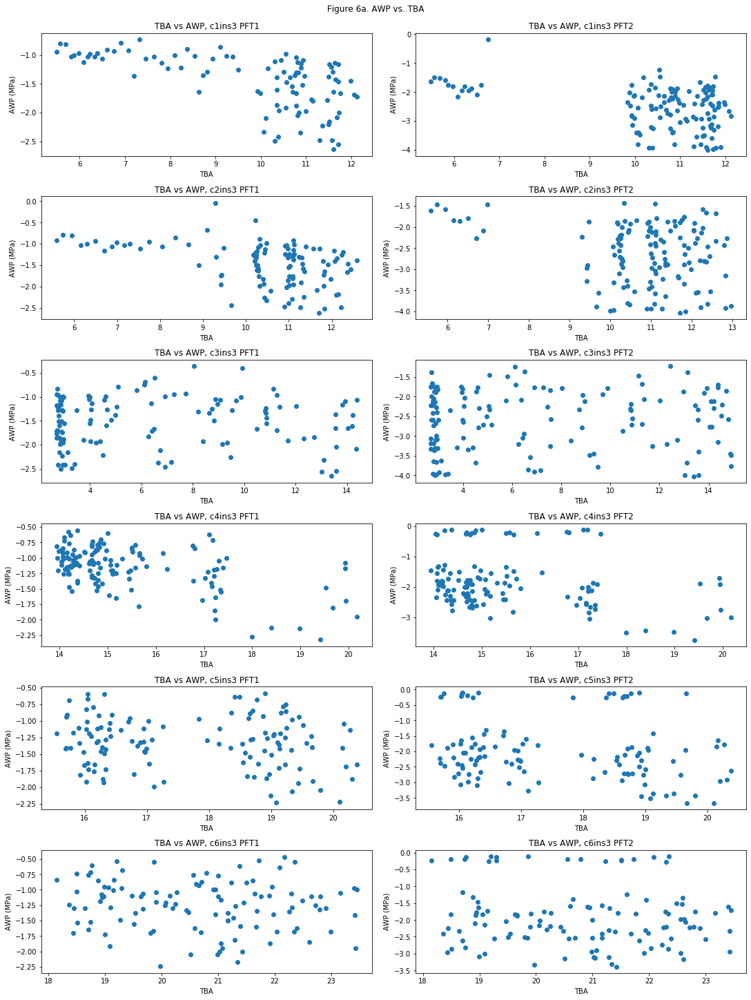

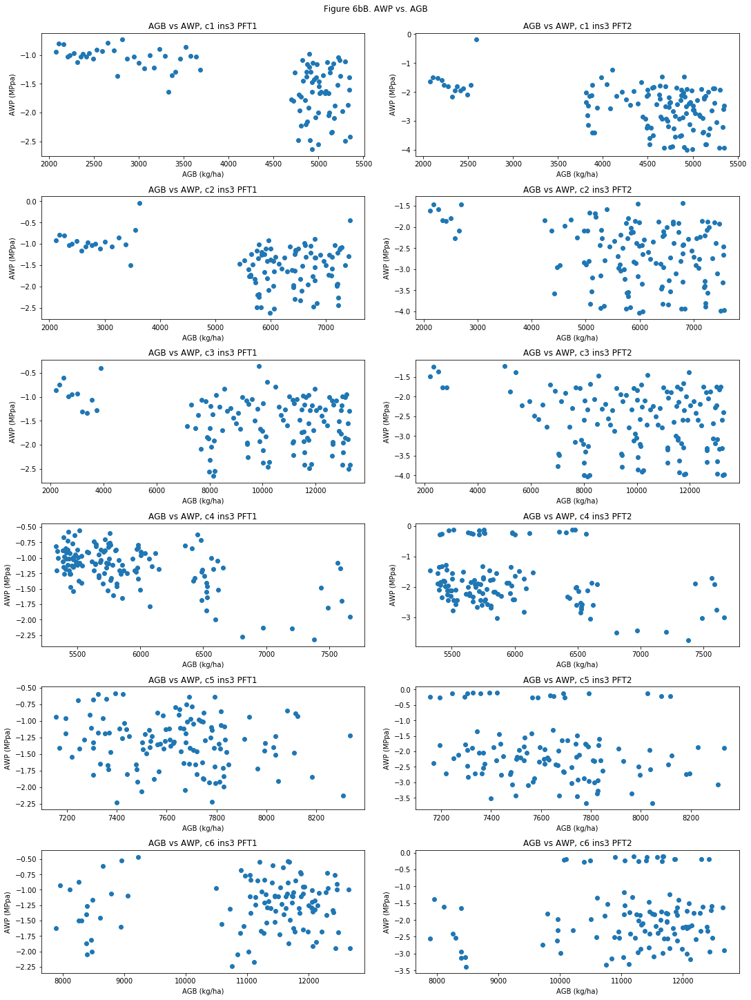

In [12]:
# plot DBA vs AWP and MTba vs AWP on the same plot
# Figure 5 plot GR,MT canopy vs. a) AWP and b) temperature
# Figure 6, plot AGB,TBA vs. AWP
inset=np.array([5,11,29,35])  #[5,11,29,35]
#Thecid=5
Thestyr=1
Theendyr=148
Thechid=3
Thepft=2
sid=0


# plot DBA and MT of canopy layer vs TBOT
insid=0
fig,BAs=plt.subplots(nrows=len(cases),ncols=2,figsize=(15,20),constrained_layout=True)
fig.suptitle("Figure 5a. growth and mortality rate vs. AWP")
for Thecid in cases:       
      #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)
   for pft in range(1,3):
      pftadj=pft*13-13  
      
      BAs[insid][pft-1].scatter(AWPyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj], GR_CANyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj],label="GR") # ,marker=MK[1:54]
      BAs[insid][pft-1].scatter(AWPyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj], MT_CANadjyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj],label="MT") # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      BAs[insid][pft-1].set_xlabel('AWP', labelpad = 5)
      BAs[insid][pft-1].set_ylabel('%', labelpad = 5)
      BAs[insid][pft-1].set_title("Mean annual growth and mortality vs AWP, c"+str(Thecid)+" ins"+str(inset[sid])+" PFT:"+str(pft))
      BAs[insid][pft-1].legend()
      BAs[insid][pft-1].set_ylim([0, 0.26]) 
   insid=insid+1


insid=0
fig,BATs=plt.subplots(nrows=len(cases),ncols=2,figsize=(15,20),constrained_layout=True)
fig.suptitle("Figure 5b. growth and mortality rate vs. Mean YR temperature")
for Thecid in cases:       
  #  TBOT
   #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)
   for pft in range(1,3):
      pftadj=pft*13-13  
      # plot DBA vs AWP  
      BATs[insid][pft-1].scatter(TBOTyrmean[Thecid][Thestyr:Theendyr], GR_CANyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj],label="GR") # ,marker=MK[1:54]
      BATs[insid][pft-1].scatter(TBOTyrmean[Thecid][Thestyr:Theendyr], MT_CANadjyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj],label="MT") # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      BATs[insid][pft-1].set_xlabel('Temperature', labelpad = 5)
      BATs[insid][pft-1].set_ylabel('%', labelpad = 5)
      BATs[insid][pft-1].set_title("GR and MT vs Temperature, c"+str(Thecid)+"ins"+str(inset[sid])+" PFT"+str(pft))
      BATs[insid][pft-1].legend()
      BATs[insid][pft-1].set_ylim([0, 0.26]) 
   insid=insid+1


# BA and AGB vs. AWP
insid=0
fig,BAvsAWPT=plt.subplots(nrows=len(cases),ncols=2,figsize=(15,20),constrained_layout=True)
fig.suptitle("Figure 6a. AWP vs. TBA")
for Thecid in cases:        
   
   #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)

   for pft in range(1,3):
      pftadj=pft*13-13  
      # plot BA vs AWP  
      BAvsAWPT[insid][pft-1].scatter(TBAyrmean[Thecid][inset[sid]][Thestyr:Theendyr], AWPyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]
      #BAvsAWPT[insid][pft-1].scatter(TBOTyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj], MT_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      BAvsAWPT[insid][pft-1].set_xlabel('TBA', labelpad = 5)
      BAvsAWPT[insid][pft-1].set_ylabel('AWP (MPa)', labelpad = 5)
      BAvsAWPT[insid][pft-1].set_title("TBA vs AWP, c"+str(Thecid)+"ins"+str(inset[sid])+" PFT"+str(pft))
      #BAs[i][j].set_ylim([0, 0.00003]) 
   insid=insid+1

insid=0
fig,AGBvsAWPT=plt.subplots(nrows=len(cases),ncols=2,figsize=(15,20),constrained_layout=True)   
fig.suptitle("Figure 6bB. AWP vs. AGB")
for Thecid in cases:       
   #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)

   for pft in range(1,3):
      pftadj=pft*13-13  
      # plot BA vs AWP  
      AGBvsAWPT[insid][pft-1].scatter(AGByrmean[Thecid][inset[sid]][Thestyr:Theendyr], AWPyrmean[Thecid][inset[sid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]
      #BAvsAWPT[insid][pft-1].scatter(TBOTyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj], MT_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      AGBvsAWPT[insid][pft-1].set_xlabel('AGB (kg/ha)', labelpad = 5)
      AGBvsAWPT[insid][pft-1].set_ylabel('AWP (MPpa)', labelpad = 5)
      AGBvsAWPT[insid][pft-1].set_title("AGB vs AWP, c"+str(Thecid)+" ins"+str(inset[sid])+" PFT"+str(pft))
      #BAs[i][j].set_ylim([0, 0.00003]) 
   insid=insid+1
    

In [ ]:
# define arrays to contain par and covs from curve fitting
par_mtba = np.empty((len(path),nins+1,13*3,3))
cov_mtba = np.empty((len(path),nins+1,13*3,3,3))
par_dba = np.empty((len(path),nins+1,13*3,3))
cov_dba = np.empty((len(path),nins+1,13*3,3,3))



for cid in cases:
    for sid in inset:
        xvar = np.squeeze(AWPyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])

        yvar_dba = np.squeeze(10000*DBA_CANadjyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])
        yvar_mtba = np.squeeze(10000*MTba_CANadjyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])
        
        #print("case:", cid, "set:", sid)
        #print("xvar:",xvar)
        #print("yvar_dba:",yvar_dba)
        try:
          pardba,covdba=curve_fit(fitDBA, xvar, yvar_dba)
          parmt,covmt=curve_fit(fitMT, xvar, yvar_mtba)
          par_dba[cid][sid][Thechid+pftadj]=pardba
          #print("pardba",pardba)
          cov_dba[cid][sid][Thechid+pftadj]=covdba
          par_mtba[cid][sid][Thechid+pftadj]=parmt
          cov_mtba[cid][sid][Thechid+pftadj]=covmt 
        except ValueError:
          print("case:", cid, "set:", sid) 
        pass
print("Plot DBA and MT for canopy layer")

IndexError: index 2 is out of bounds for axis 0 with size 2

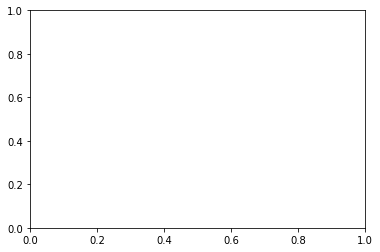

In [17]:
#plot histogram or boxplot of TBA, annual GPP and ET for each instance
# TBAyrmean[cid][theins][Ytime]
Bchid=12
for cid in cases:
    fig, bp = plt.subplots()   
    bpdata0=TBAyrmean[cid][sets[0]][1:148]
    bpdata1=TBAyrmean[cid][sets[1]][1:148]    
    bpdata2=TBAyrmean[cid][sets[2]][1:148]
    bpdata3=TBAyrmean[cid][sets[3]][1:148]        
    
    bp.boxplot([bpdata0,bpdata1,bpdata2,bpdata3])
    bp.set_ylabel("TBA (m^2/ha)") 
    plt.title("Total basal area (case"+str(cid)+")")
# plot size distribution of canopy level as a color map
for cid in cases:
    fig, bps = plt.subplots()   
    bpdata0=NPLANT_CANyrmean[cid][sets[0]][100:148,Bchid+pftadj]
    bpdata1=NPLANT_CANyrmean[cid][sets[1]][100:148,Bchid+pftadj]    
    bpdata2=NPLANT_CANyrmean[cid][sets[2]][100:148,Bchid+pftadj]
    bpdata3=NPLANT_CANyrmean[cid][sets[3]][100:148,Bchid+pftadj]        
    
    bps.boxplot([bpdata0,bpdata1,bpdata2,bpdata3])
    plt.title("number large trees (DBH 85 cm),(case"+str(cid)+")")
    bps.set_ylabel("N trees (n/ha)")

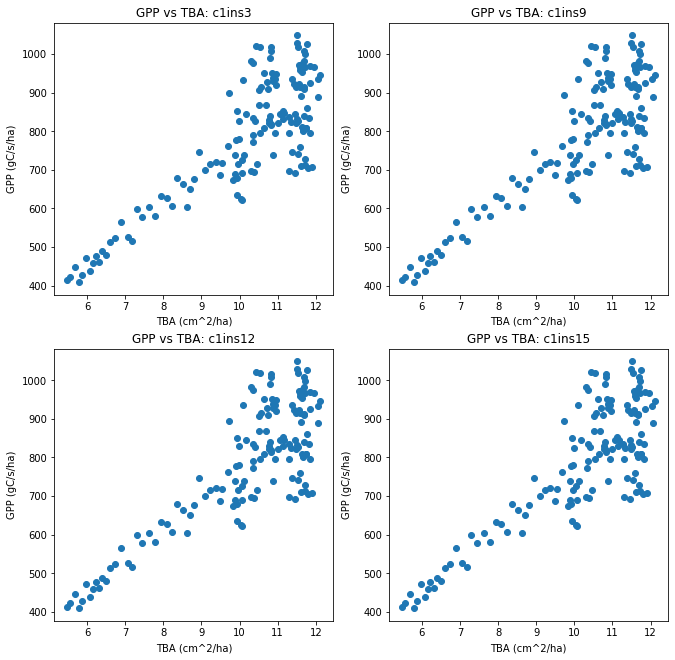

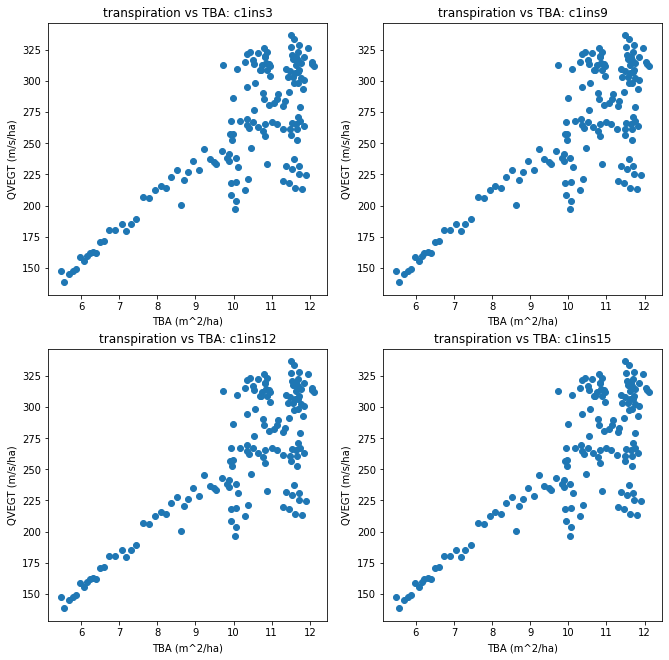

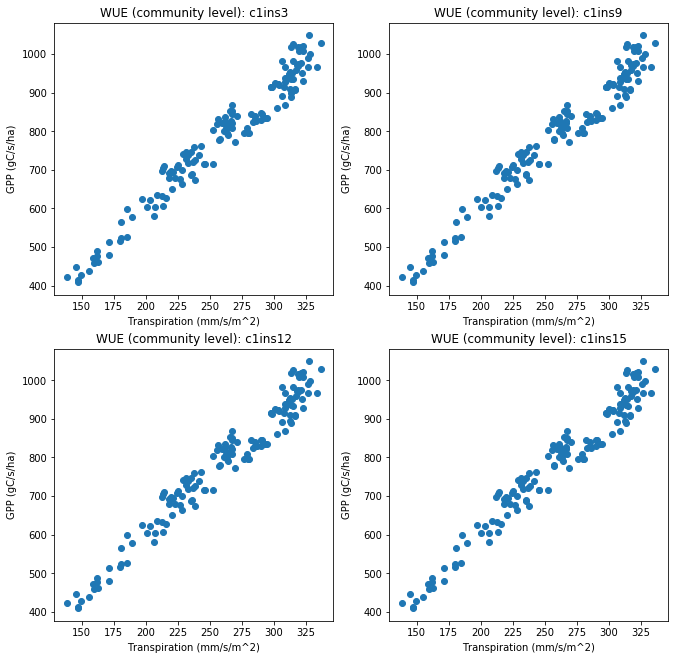

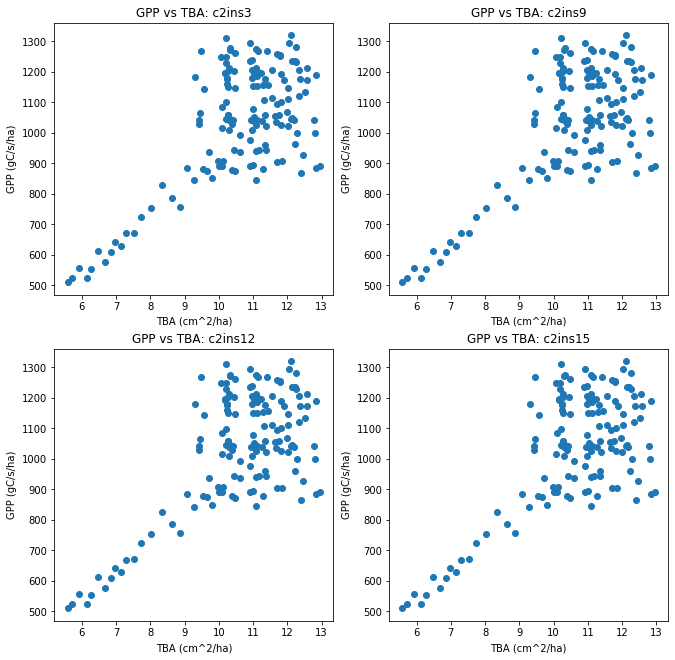

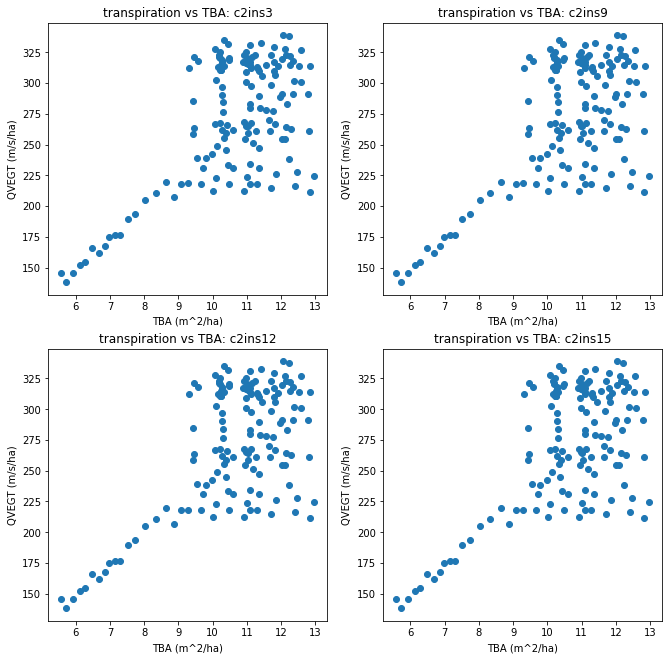

...

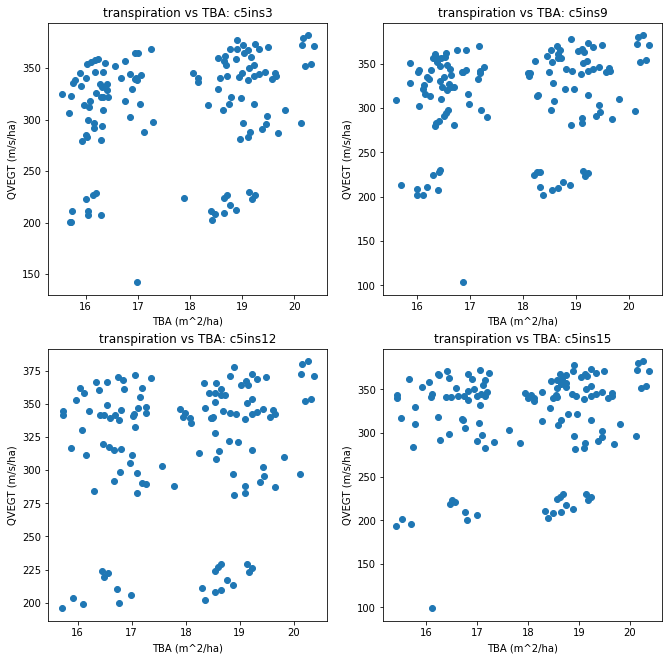

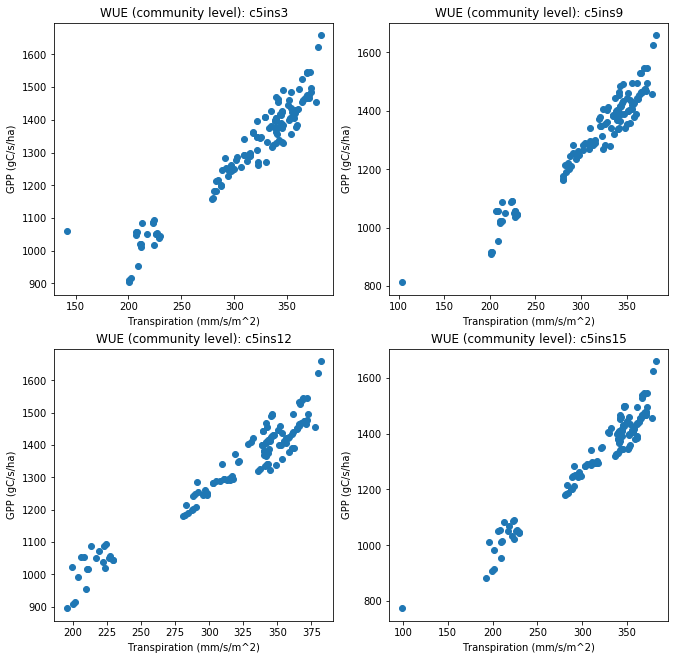

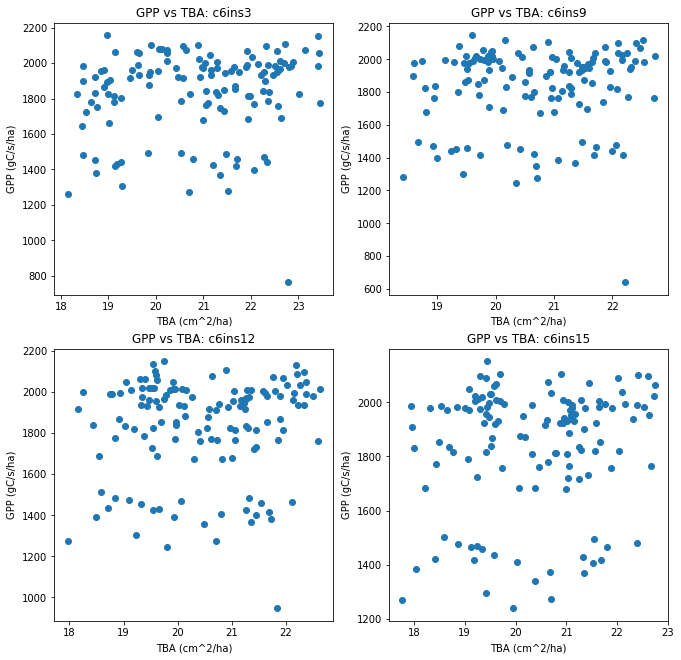

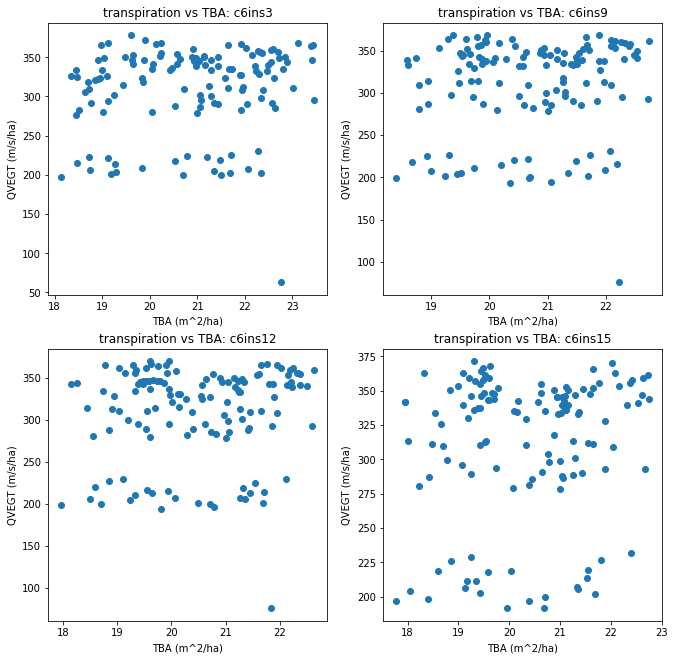

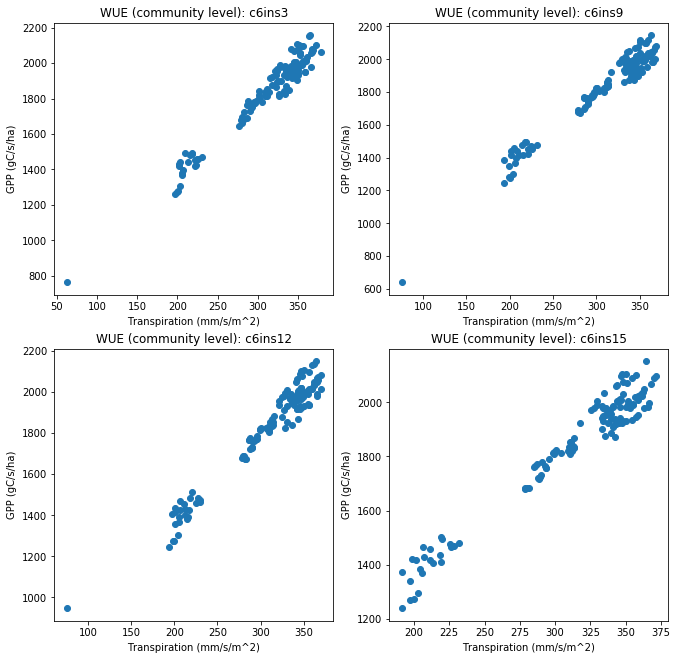

In [37]:
# GPP, QVEGT vs. TBA
# plot 4 sets
sets = np.array([3,9,12,15,5,6])
cases=np.array([1,2,3,4,5,6])
Thestyr=1
Theendyr=149
for cid in cases:
  fig,GPPpt=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
  insid=0
  for i in range(0,2):
    for j in range(0,2):
     # plot DBA vs MTba  
     GPPpt[i][j].scatter(TBAyrmean[cid][sets[insid]][Thestyr:Theendyr],GPPyrmean[cid][sets[insid]][Thestyr:Theendyr]) # ,marker=MK[1:54]
#     BAvsMT[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)], MTbayrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)]) # ,marker=MK[1:54]
  
     GPPpt[i][j].set_xlabel('TBA (cm^2/ha)', labelpad = 5)
     GPPpt[i][j].set_ylabel('GPP (gC/s/ha)', labelpad = 5)
     GPPpt[i][j].set_title("GPP vs TBA: c"+str(cid)+"ins"+str(sets[insid]))
     #BAvsMT[i][j].set_ylim([0, 0.00002]) 
     #BAvsMT[i][j].set_xlim([0, 0.00002])
     insid=insid+1

  fig,QVEGTpt=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
  insid=0
  for i in range(0,2):
    for j in range(0,2):
     # plot DBA vs MTba  
     QVEGTpt[i][j].scatter(TBAyrmean[cid][sets[insid]][Thestyr:Theendyr],QVEGTyrmean[cid][sets[insid]][Thestyr:Theendyr]) # ,marker=MK[1:54]
#     BAvsMT[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)], MTbayrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)]) # ,marker=MK[1:54]
  
     QVEGTpt[i][j].set_xlabel('TBA (m^2/ha)', labelpad = 5)
     QVEGTpt[i][j].set_ylabel('QVEGT (m/s/ha)', labelpad = 5)
     QVEGTpt[i][j].set_title("transpiration vs TBA: c"+str(cid)+"ins"+str(sets[insid]))
     #BAvsMT[i][j].set_ylim([0, 0.00002]) 
     #BAvsMT[i][j].set_xlim([0, 0.00002])
     insid=insid+1

  fig,WUEpt=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
  insid=0
  for i in range(0,2):
    for j in range(0,2):
     # plot DBA vs MTba  
     WUEpt[i][j].scatter(QVEGTyrmean[cid][sets[insid]][Thestyr:Theendyr],GPPyrmean[cid][sets[insid]][Thestyr:Theendyr]) # ,marker=MK[1:54]
#     BAvsMT[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)], MTbayrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)]) # ,marker=MK[1:54]
  
     WUEpt[i][j].set_xlabel('Transpiration (mm/s/m^2)', labelpad = 5)
     WUEpt[i][j].set_ylabel('GPP (gC/s/ha)', labelpad = 5)
     WUEpt[i][j].set_title("WUE (community level): c"+str(cid)+"ins"+str(sets[insid]))
     #BAvsMT[i][j].set_ylim([0, 0.00002]) 
     #BAvsMT[i][j].set_xlim([0, 0.00002])
     insid=insid+1
    

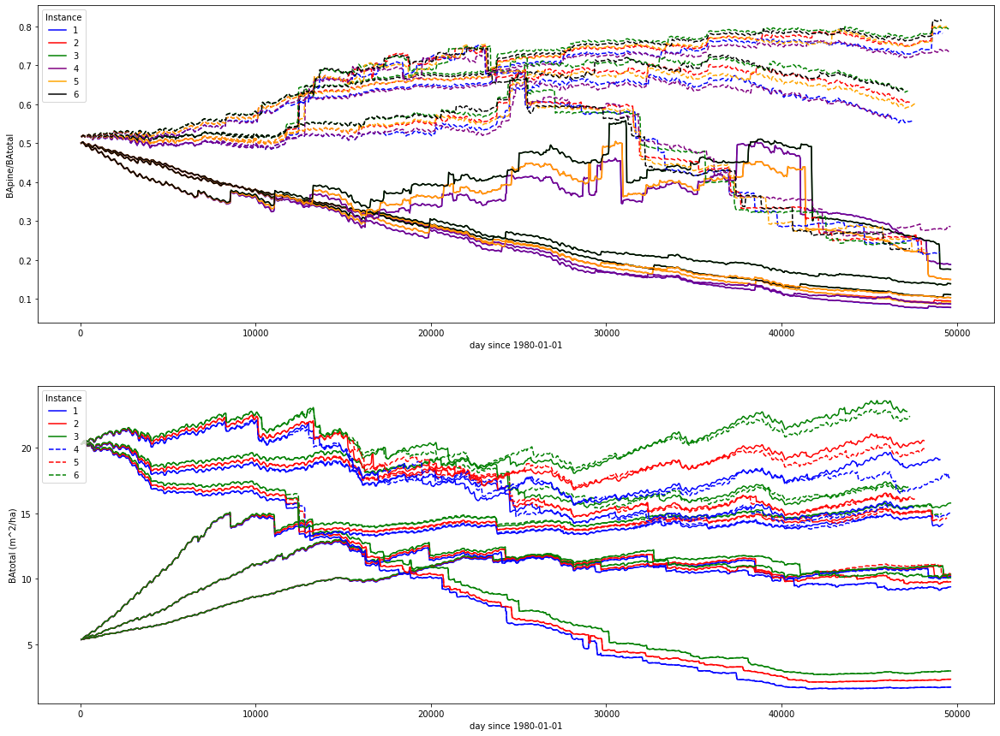

In [24]:
## plot total basal area of two pft by month
## dinguish pft by line type, instance by color 
cases=[1,2,3,4,5,6]
sets=np.array([3,21])
Oneins=3
## assign line type, and line color
lc = np.array(['blue','red','green','purple','orange','black','olive','brown','peachpuff','green'])           # line color
ls = np.array(['-','--',])    
## plot 
## setup plots to make

fig,(pBA, Bt)=plt.subplots(nrows=2,ncols=1,figsize=(20,15))  
for cid in cases:
  lid1=0
  lid2=0
  
  for inst in cases:
     if cid <=Oneins:
       ils = 0
       ilc = lid1 
       lid1=lid1+1
     else:
       ils = 1  
       ilc = lid2
       lid2=lid2+1 
     pBA.plot(Thetime[1:len(Thetime)], BApctPine[cid][inst][1:(len(Thetime))], linestyle=ls[ils], color=lc[ilc], linewidth=1.5)
#pBA.plot(Thetime[1:len(Thetime)],[0.3,0.3],'b-')


  # plot total basal area
  lid1=0
  lid2=0  
  for inst in cases:
   if inst <=Oneins:
     ils = 0
     ilc = lid1 
     lid1=lid1+1
   else:
     ils = 1  
     ilc = lid2
     lid2=lid2+1 
   Bt.plot(Thetime[1:len(Thetime)], BAtotal[cid][inst][1:(len(Thetime))], linestyle=ls[ils], color=lc[ilc], linewidth=1.5)

pBA.set_xlabel("day since 1980-01-01") 
pBA.set_ylabel("BApine/BAtotal")
pBA.legend(cases, title="Instance", loc='upper left')
Bt.set_xlabel("day since 1980-01-01") 
Bt.set_ylabel("BAtotal (m^2/ha)")
Bt.legend(cases, title="Instance",loc='upper left')
#plt.show        
#print("notes: large fluctuation are because of the storagy cushion is too low - 2, so during a cold year, most of oak are died from carbon starvation, while during normal year, they have more carbon to grow")

Text(0, 0.5, 'cohort ID')

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/matplotlib/image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/global/software/sl-7.x86_64/modules/apps/ml/tensorflow/2.3.0-py37/lib/python3.7/site-packages/numpy/ma/core.py:722: UserWarning: Warning: conver

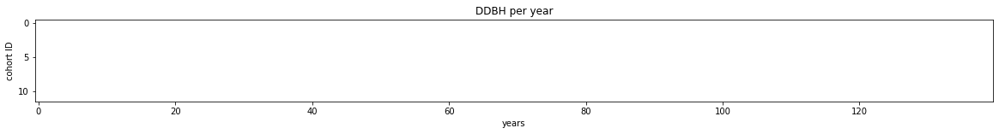

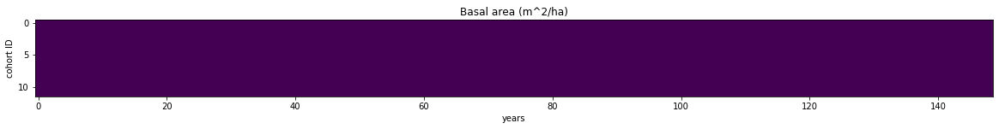

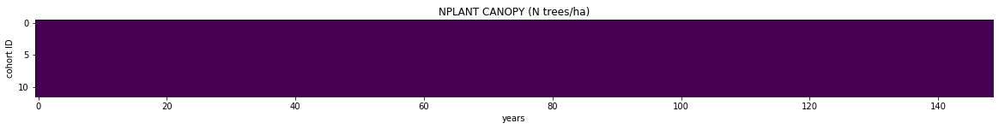

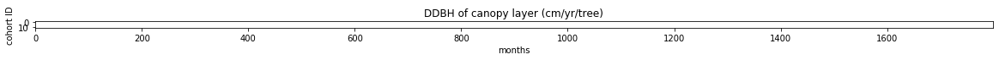

In [14]:
# plot 2D var as map by cohort x time
pcid=3
pinst=3 #5 11 29 35
pft=PFT
pftadj=pft*13-13
Z=np.transpose(DDBHadjyrmean[pcid][pinst][10:150,0+pftadj:12+pftadj])
fig, figplt = plt.subplots(nrows=1,ncols=1, figsize=(20,40))
figplt.imshow(Z)
figplt.set_title("DDBH per year")  
figplt.set_xlabel("years")
figplt.set_ylabel("cohort ID")  

Z=np.transpose(BA[pcid][pinst][1:150,0+pftadj:12+pftadj])
fig, figplt = plt.subplots(nrows=1,ncols=1, figsize=(20,40))
figplt.imshow(Z)
figplt.set_title("Basal area (m^2/ha)")  
figplt.set_xlabel("years")
figplt.set_ylabel("cohort ID")  

Z=np.transpose(NPLANT_CAN[pcid][pinst][1:150,0+pftadj:12+pftadj])
fig, figplt = plt.subplots(nrows=1,ncols=1, figsize=(20,40))
figplt.imshow(Z)
figplt.set_title("NPLANT CANOPY (N trees/ha)")  
figplt.set_xlabel("years")
figplt.set_ylabel("cohort ID")  


Z=np.transpose(DDBH_CANscpfadj[pcid][pinst][1:150*12,0+pftadj:12+pftadj])
fig, figplt = plt.subplots(nrows=1,ncols=1, figsize=(20,40))
figplt.imshow(Z)
figplt.set_title("DDBH of canopy layer (cm/yr/tree)")  
figplt.set_xlabel("months")
figplt.set_ylabel("cohort ID")  

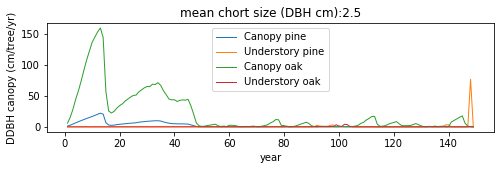

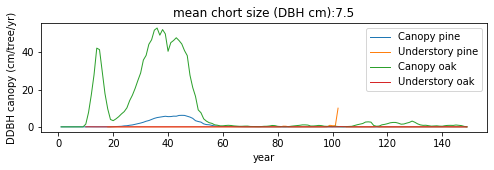

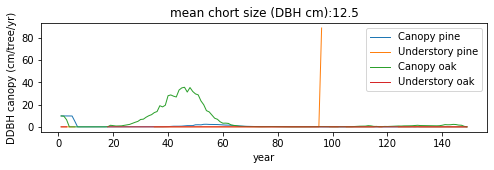

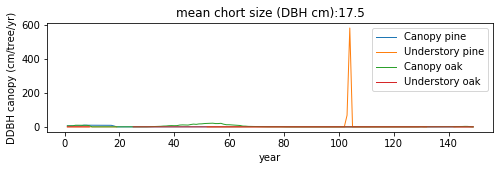

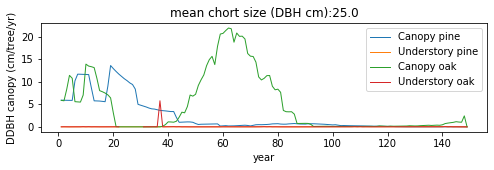

...

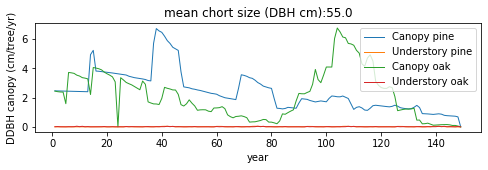

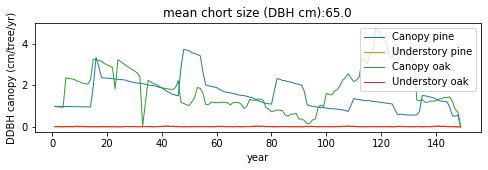

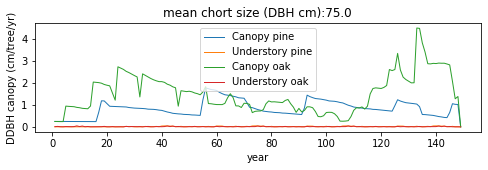

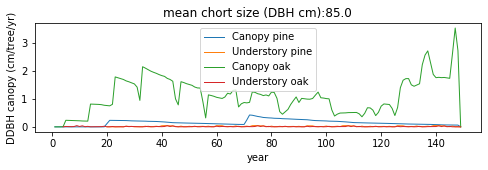

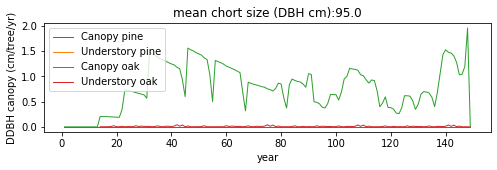

In [37]:
# plot DDBHadj by month of canopy layer for each cohort bin
pcid=2
pftadj=13
pinst=3
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
  figplt.plot(range(1,150), DDBH_CANadjyrmean[pcid][pinst][1:150,pchid], linewidth=1,label='Canopy pine')
  figplt.plot(range(1,150), DDBH_UNDadjyrmean[pcid][pinst][1:150,pchid], linewidth=1, label='Understory pine')
  figplt.plot(range(1,150), DDBH_CANadjyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1,label='Canopy oak')
  figplt.plot(range(1,150), DDBH_UNDadjyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1, label='Understory oak')

  figplt.set_title("mean chort size (DBH cm):"+str(DBH[pchid]))  
  figplt.set_xlabel("year")
  figplt.set_ylabel("DDBH canopy (cm/tree/yr)")  
  figplt.legend() 

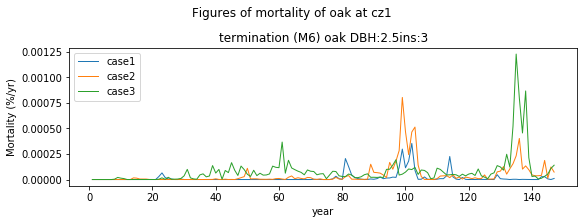

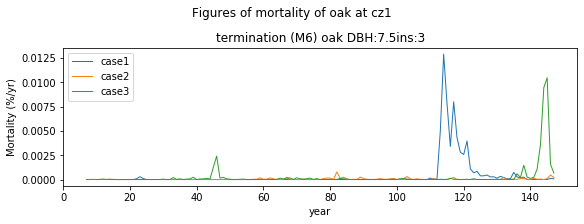

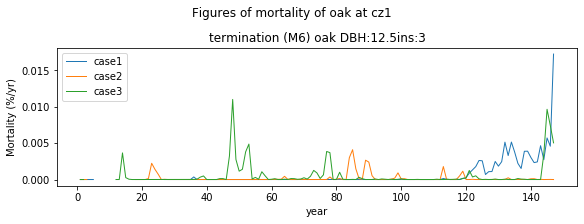

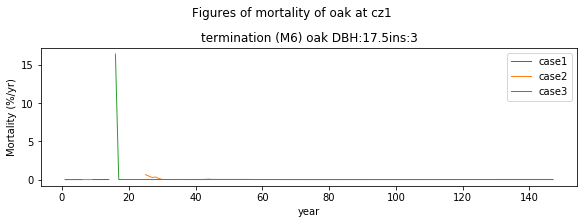

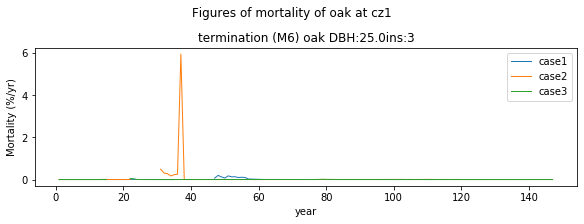

...

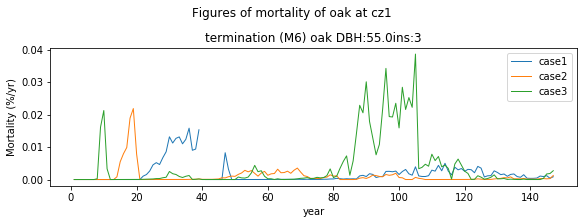

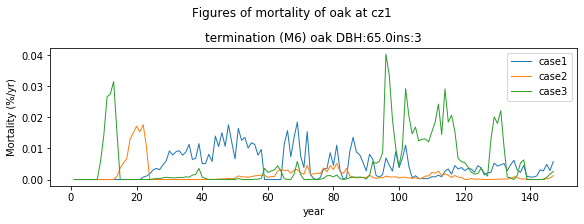

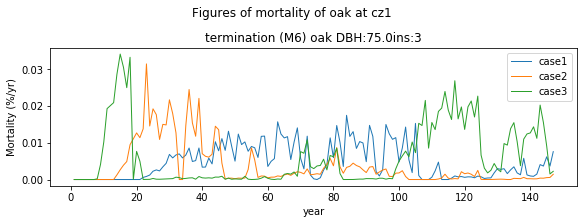

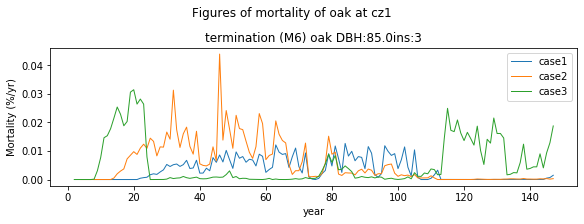

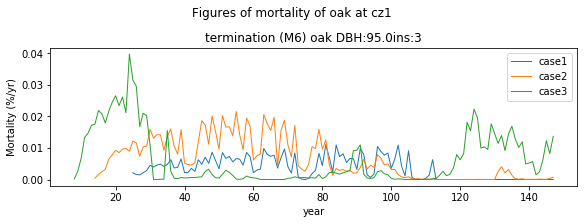

In [23]:
# plot termination mortality of oak at cz1
# plot canopy, understory and all in different figures
pftadj=13
pinst=3

for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,3),constrained_layout=True)
  fig.suptitle("Figures of mortality of oak at cz1")
  for pcid in [1,2,3]:

    figplt.plot(range(1,150-2), M6yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
   
    figplt.set_title("termination (M6) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt.set_xlabel("year")
    figplt.set_ylabel("Mortality (%/yr)")  
    figplt.legend()     
      

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:76: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


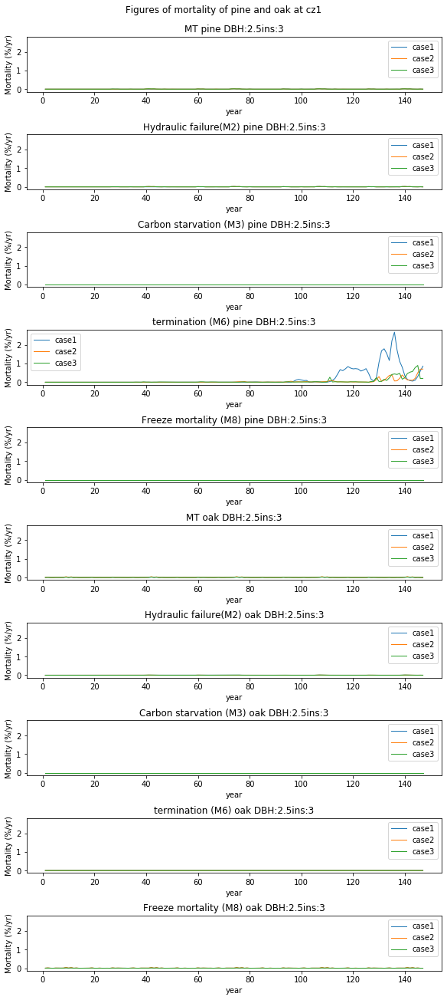

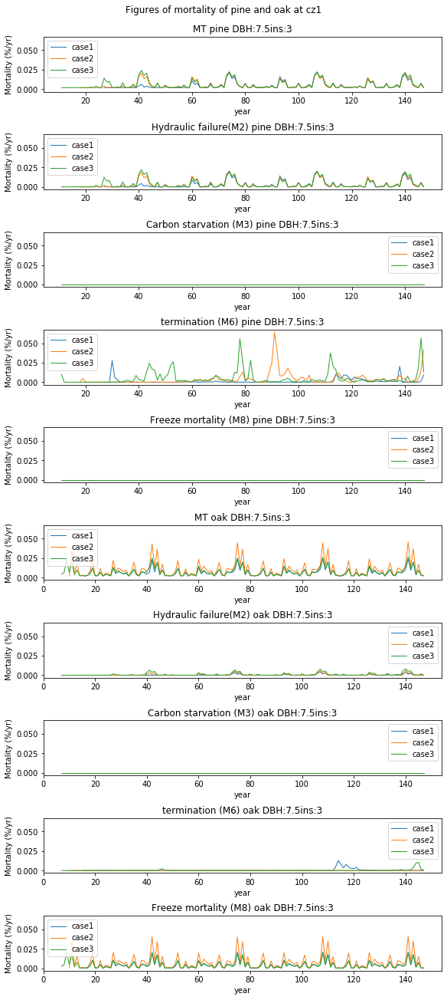

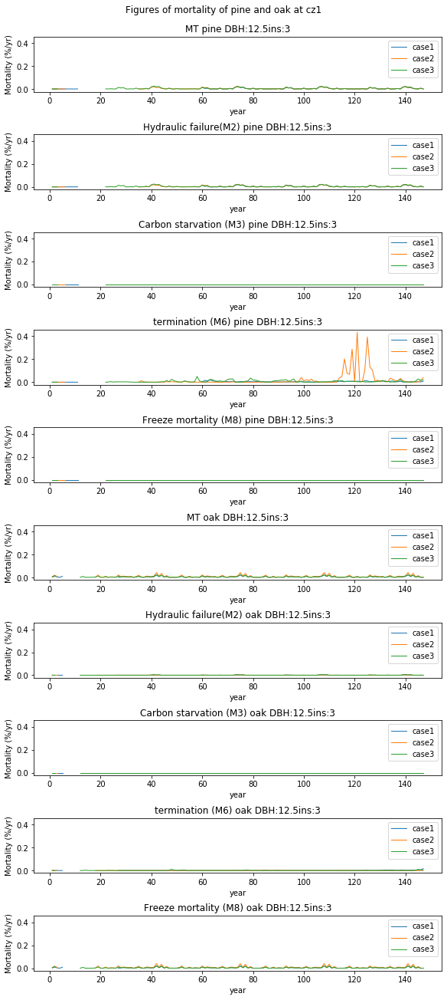

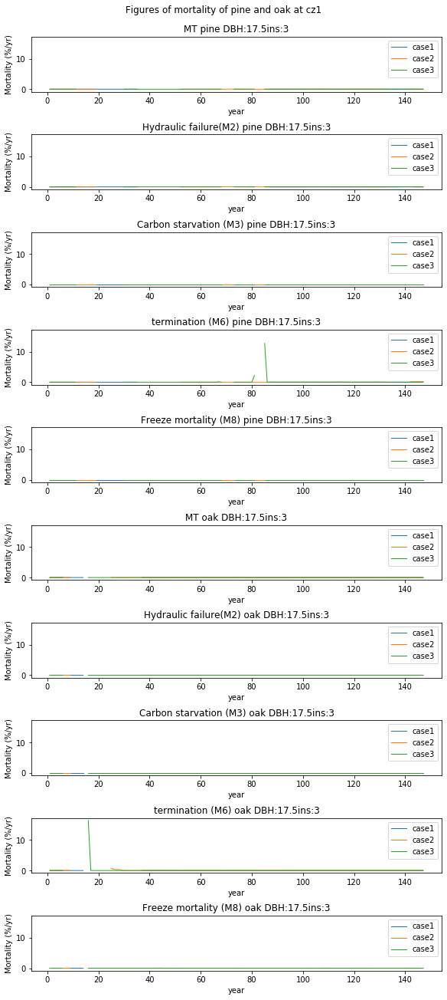

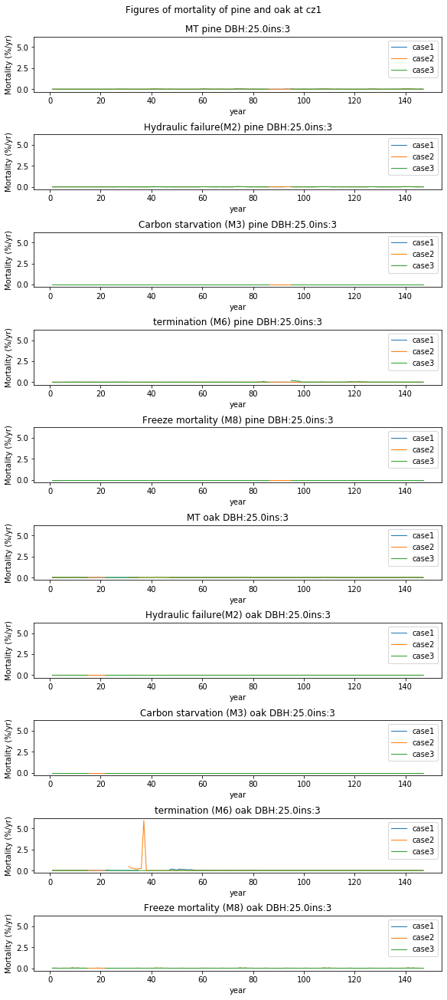

...

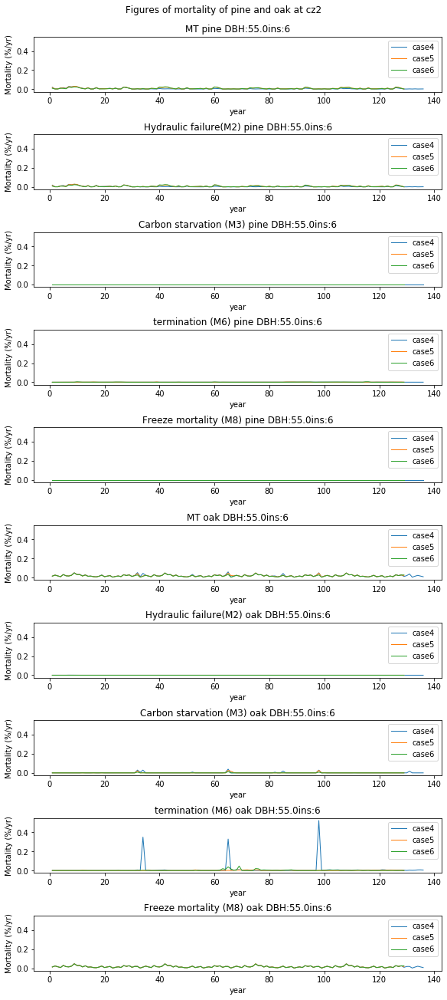

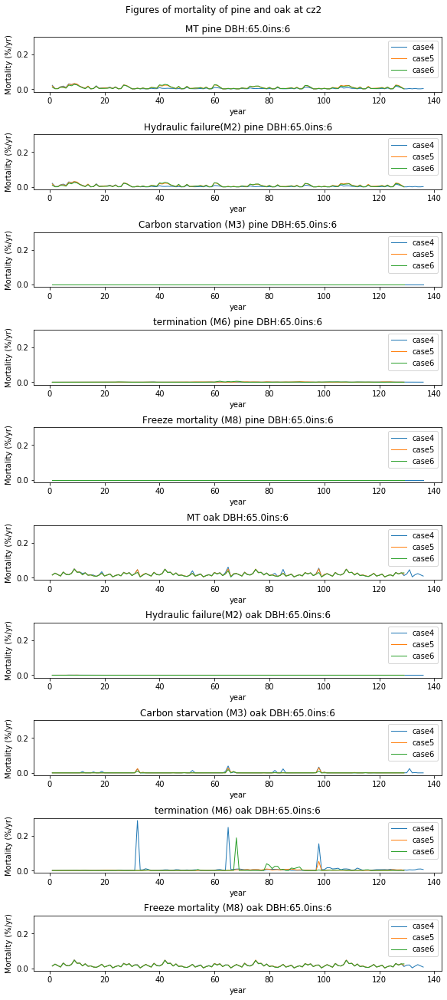

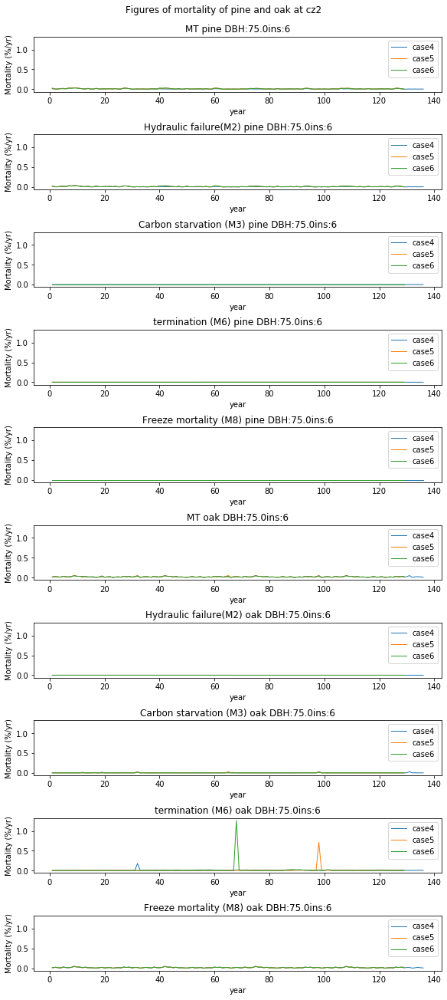

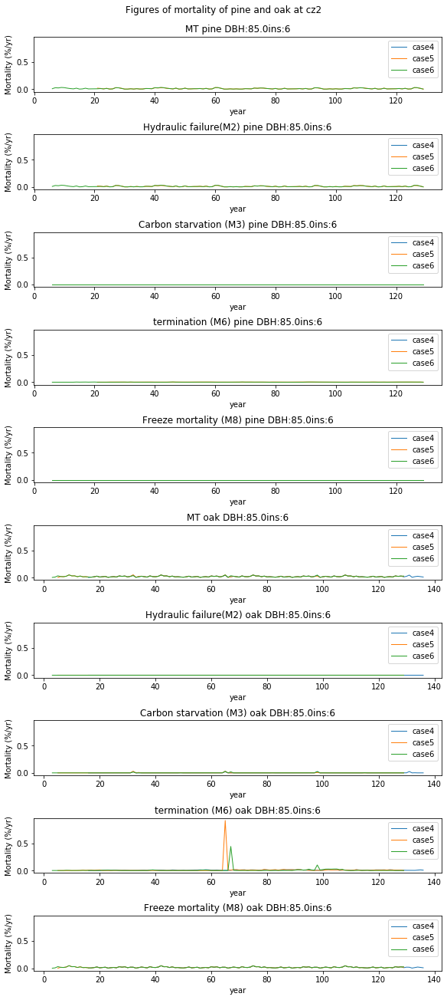

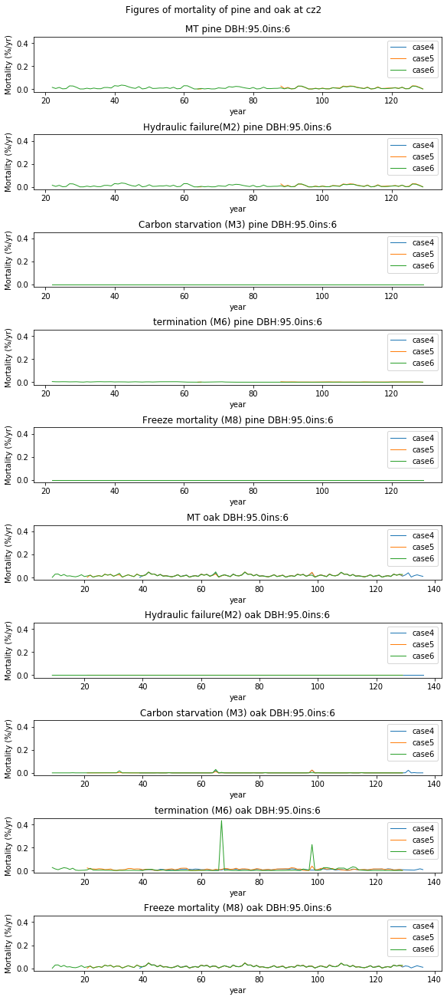

In [21]:
# plot different mortality rate of pine and oak
# plot canopy, understory and all in different figures
pftadj=13
pinst=3

for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=10,ncols=1, sharey=True, figsize=(8,18),constrained_layout=True)
  fig.suptitle("Figures of mortality of pine and oak at cz1")
  for pcid in [1,2,3]:
    figplt[0].plot(range(1,150-2), MTyrmean[pcid][pinst][1:150-2,pchid], linewidth=1,label="case"+str(pcid))
    figplt[1].plot(range(1,150-2), M2yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[2].plot(range(1,150-2), M3yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[3].plot(range(1,150-2), M6yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[4].plot(range(1,150-2), M8yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))

    figplt[5].plot(range(1,150-2), MTyrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1,label="case"+str(pcid))
    figplt[6].plot(range(1,150-2), M2yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[7].plot(range(1,150-2), M3yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[8].plot(range(1,150-2), M6yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[9].plot(range(1,150-2), M8yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))

    figplt[0].set_title("MT pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[0].set_xlabel("year")
    figplt[0].set_ylabel("Mortality (%/yr)")  
    figplt[0].legend() 
    
    figplt[1].set_title("Hydraulic failure(M2) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[1].set_xlabel("year")
    figplt[1].set_ylabel("Mortality (%/yr)")  
    figplt[1].legend()     

    figplt[2].set_title("Carbon starvation (M3) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[2].set_xlabel("year")
    figplt[2].set_ylabel("Mortality (%/yr)")  
    figplt[2].legend() 

    figplt[3].set_title("termination (M6) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[3].set_xlabel("year")
    figplt[3].set_ylabel("Mortality (%/yr)")  
    figplt[3].legend()     

    figplt[4].set_title("Freeze mortality (M8) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[4].set_xlabel("year")
    figplt[4].set_ylabel("Mortality (%/yr)")  
    figplt[4].legend() 
    
    
    figplt[5].set_title("MT oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[5].set_xlabel("year")
    figplt[5].set_ylabel("Mortality (%/yr)")  
    figplt[5].legend() 
    
    figplt[6].set_title("Hydraulic failure(M2) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[6].set_xlabel("year")
    figplt[6].set_ylabel("Mortality (%/yr)")  
    figplt[6].legend()     

    figplt[7].set_title("Carbon starvation (M3) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[7].set_xlabel("year")
    figplt[7].set_ylabel("Mortality (%/yr)")  
    figplt[7].legend() 
    
    figplt[8].set_title("termination (M6) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[8].set_xlabel("year")
    figplt[8].set_ylabel("Mortality (%/yr)")  
    figplt[8].legend()     

    figplt[9].set_title("Freeze mortality (M8) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[9].set_xlabel("year")
    figplt[9].set_ylabel("Mortality (%/yr)")  
    figplt[9].legend() 

    figplt[3].legend()        
#for pcid in [4,5,6]:    
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=10,ncols=1, sharey=True, figsize=(8,18),constrained_layout=True)
  fig.suptitle("Figures of mortality of pine and oak at cz2")
  for pcid in [4,5,6]:
    figplt[0].plot(range(1,150-2), MTyrmean[pcid][pinst][1:150-2,pchid], linewidth=1,label="case"+str(pcid))
    figplt[1].plot(range(1,150-2), M2yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[2].plot(range(1,150-2), M3yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[3].plot(range(1,150-2), M6yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))
    figplt[4].plot(range(1,150-2), M8yrmean[pcid][pinst][1:150-2,pchid], linewidth=1, label="case"+str(pcid))

    figplt[5].plot(range(1,150-2), MTyrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1,label="case"+str(pcid))
    figplt[6].plot(range(1,150-2), M2yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[7].plot(range(1,150-2), M3yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[8].plot(range(1,150-2), M6yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))
    figplt[9].plot(range(1,150-2), M8yrmean[pcid][pinst][1:150-2,pchid+pftadj], linewidth=1, label="case"+str(pcid))

    figplt[0].set_title("MT pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[0].set_xlabel("year")
    figplt[0].set_ylabel("Mortality (%/yr)")  
    figplt[0].legend() 
    
    figplt[1].set_title("Hydraulic failure(M2) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[1].set_xlabel("year")
    figplt[1].set_ylabel("Mortality (%/yr)")  
    figplt[1].legend()     

    figplt[2].set_title("Carbon starvation (M3) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[2].set_xlabel("year")
    figplt[2].set_ylabel("Mortality (%/yr)")  
    figplt[2].legend() 

    figplt[3].set_title("termination (M6) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[3].set_xlabel("year")
    figplt[3].set_ylabel("Mortality (%/yr)")  
    figplt[3].legend()     

    figplt[4].set_title("Freeze mortality (M8) pine DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[4].set_xlabel("year")
    figplt[4].set_ylabel("Mortality (%/yr)")  
    figplt[4].legend() 
    
    
    figplt[5].set_title("MT oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[5].set_xlabel("year")
    figplt[5].set_ylabel("Mortality (%/yr)")  
    figplt[5].legend() 
    
    figplt[6].set_title("Hydraulic failure(M2) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[6].set_xlabel("year")
    figplt[6].set_ylabel("Mortality (%/yr)")  
    figplt[6].legend()     

    figplt[7].set_title("Carbon starvation (M3) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[7].set_xlabel("year")
    figplt[7].set_ylabel("Mortality (%/yr)")  
    figplt[7].legend() 
    
    figplt[8].set_title("termination (M6) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[8].set_xlabel("year")
    figplt[8].set_ylabel("Mortality (%/yr)")  
    figplt[8].legend()     

    figplt[9].set_title("Freeze mortality (M8) oak DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[9].set_xlabel("year")
    figplt[9].set_ylabel("Mortality (%/yr)")  
    figplt[9].legend() 

    figplt[3].legend()

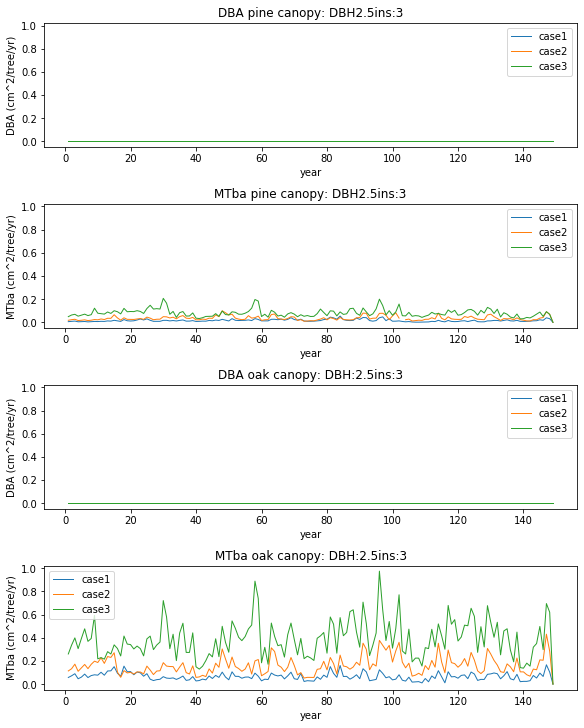

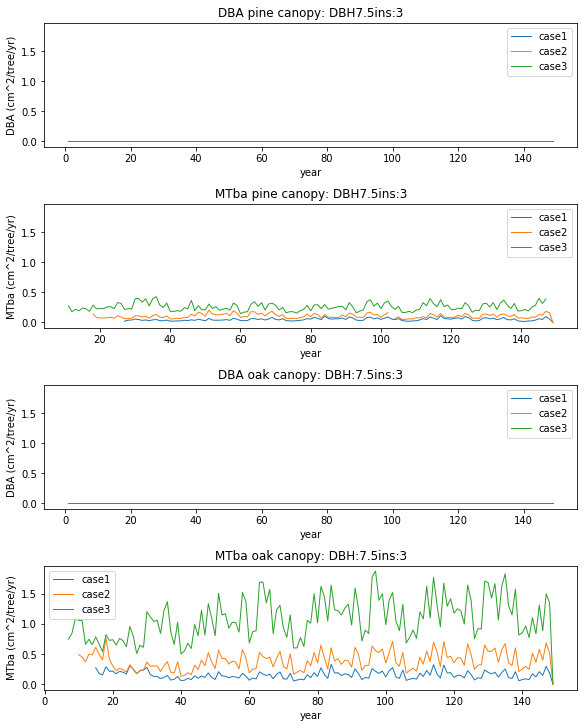

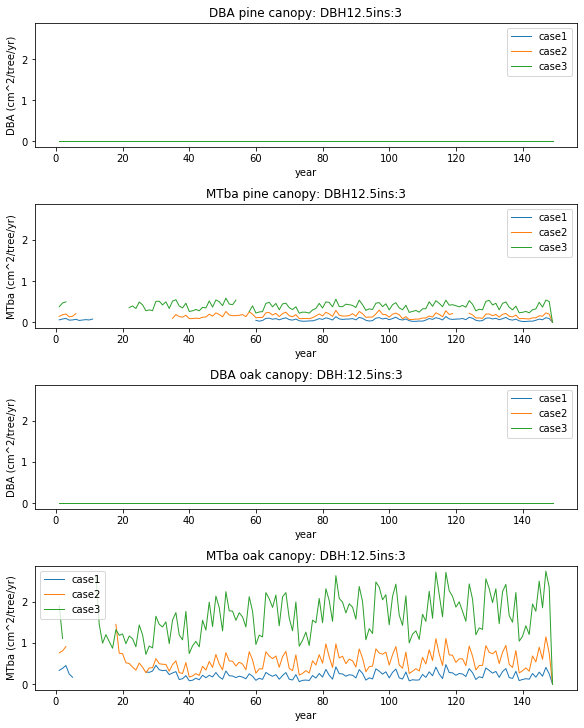

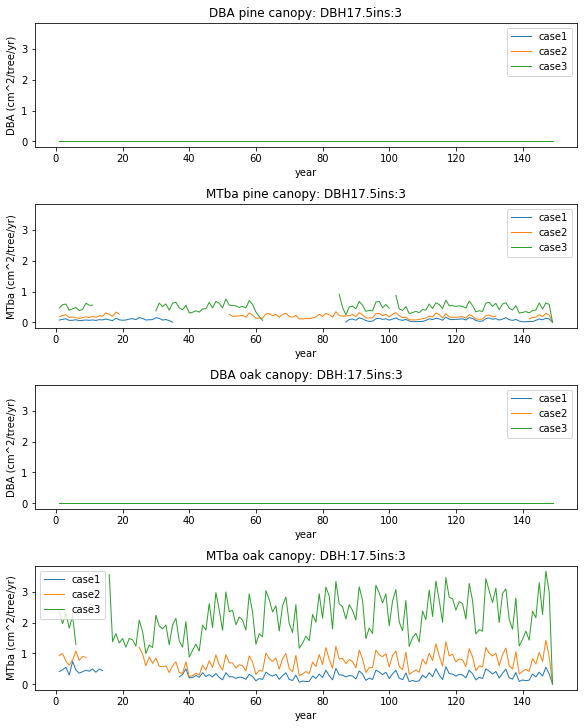

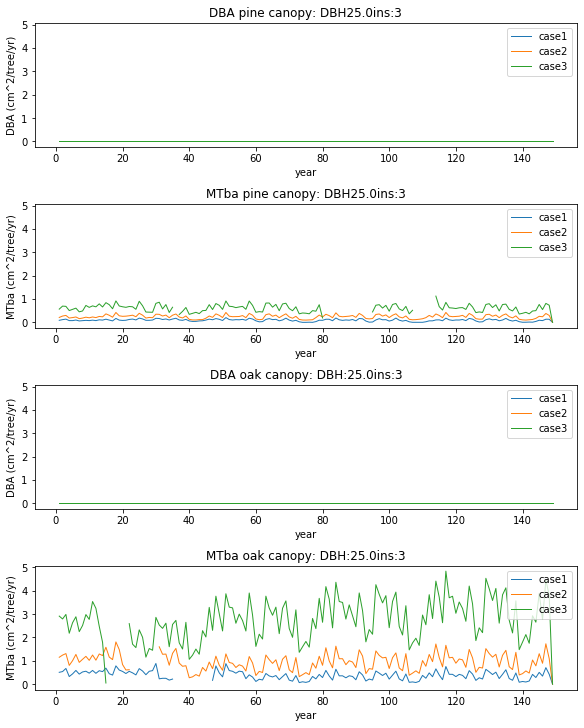

...

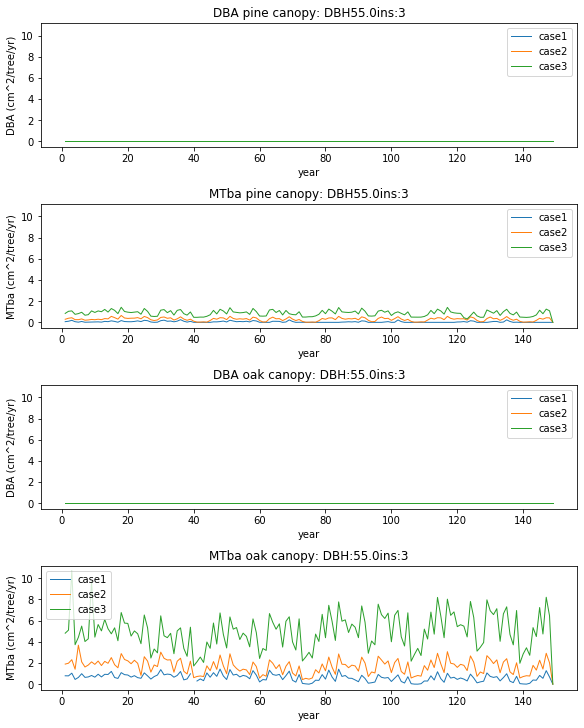

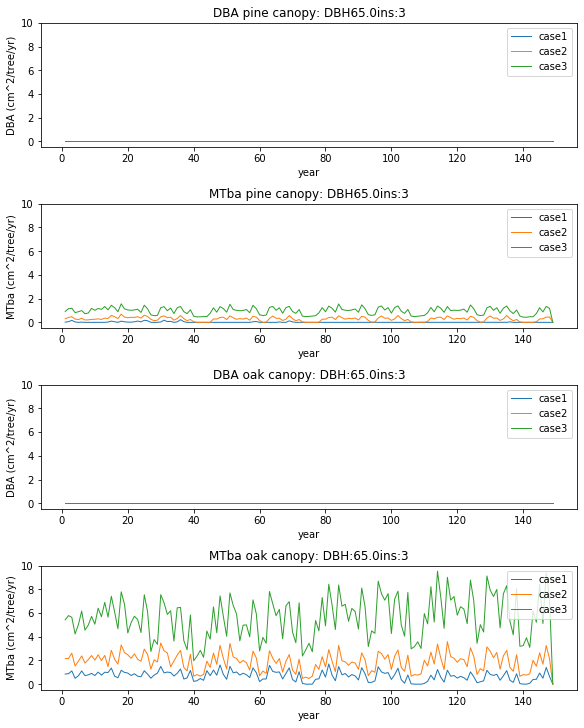

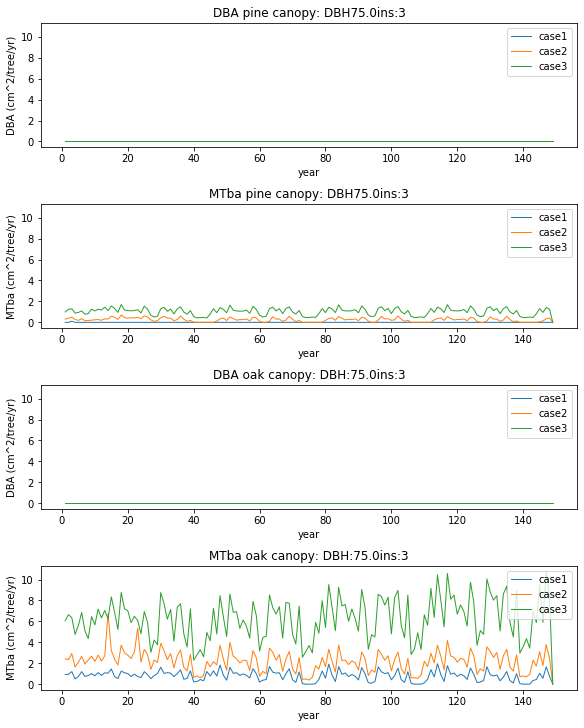

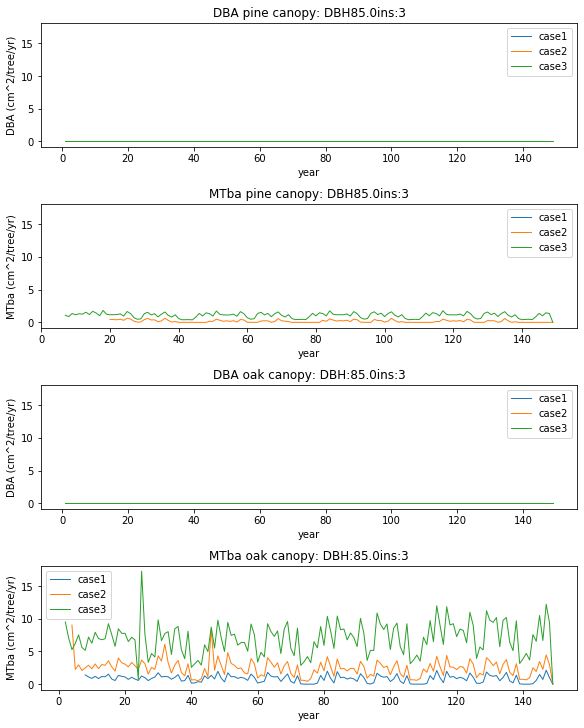

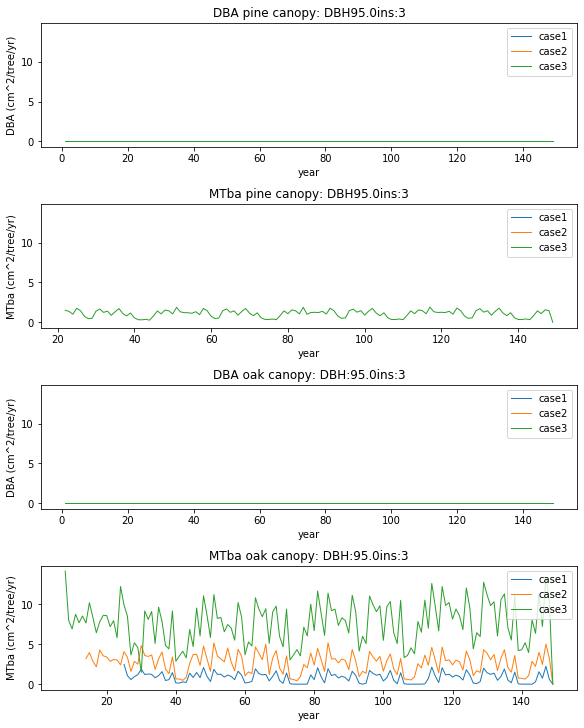

In [42]:
# plot DBA and MTba for canopy pine and oak
# plot canopy, understory and all in different figures
# 10000*DBA_CANadjyrmean[cid][theins][1:149,chid]
#10000*MTba_CANadjyrmean[cid][theins][70:149,chid]
pftadj=13
pinst=3

for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=4,ncols=1, sharey=True, figsize=(8,10),constrained_layout=True)
  for pcid in [1,2,3]:
    figplt[0].plot(range(1,150), 10000*DBA_CANadjyrmean[pcid][pinst][1:150,pchid], linewidth=1,label="case"+str(pcid))
    figplt[1].plot(range(1,150), 10000*MTba_CANadjyrmean[pcid][pinst][1:150,pchid], linewidth=1, label="case"+str(pcid))
    figplt[2].plot(range(1,150), 10000*DBA_CANadjyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1,label="case"+str(pcid))
    figplt[3].plot(range(1,150), 10000*MTba_CANadjyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1, label="case"+str(pcid))

    figplt[0].set_title("DBA pine canopy: DBH"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[0].set_xlabel("year")
    figplt[0].set_ylabel("DBA (cm^2/tree/yr)")  
    figplt[0].legend() 
    
    figplt[1].set_title("MTba pine canopy: DBH"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[1].set_xlabel("year")
    figplt[1].set_ylabel("MTba (cm^2/tree/yr)")  
    figplt[1].legend()     

    figplt[2].set_title("DBA oak canopy: DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[2].set_xlabel("year")
    figplt[2].set_ylabel("DBA (cm^2/tree/yr)")  
    figplt[2].legend() 
    
    figplt[3].set_title("MTba oak canopy: DBH:"+str(DBH[pchid])+"ins:"+str(pcid))  
    figplt[3].set_xlabel("year")
    figplt[3].set_ylabel("MTba (cm^2/tree/yr)")  
    figplt[3].legend()        
#for pcid in [4,5,6]:    

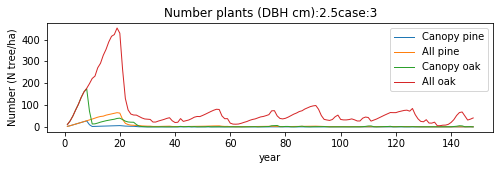

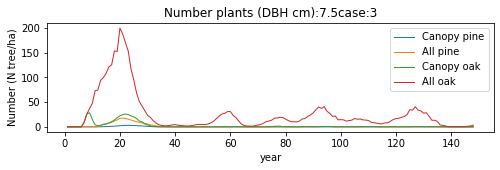

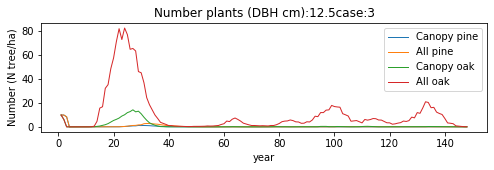

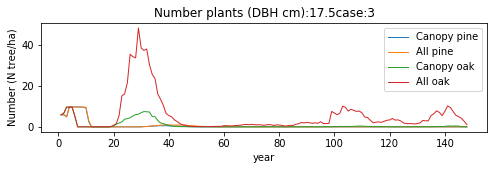

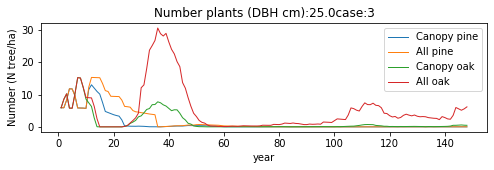

...

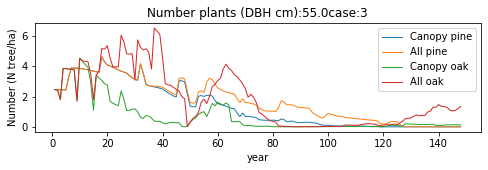

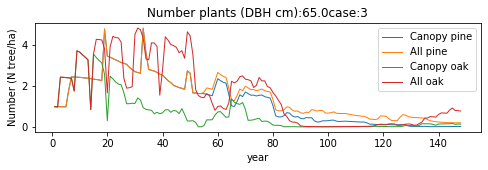

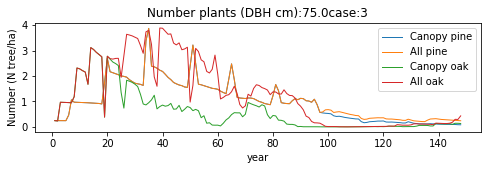

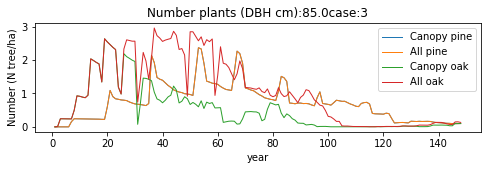

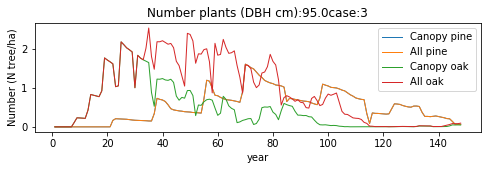

In [24]:
# plot DDBHadj by month of canopy layer for each cohort bin
cases=[3]
pftadj=13
pinst=3
for pcid in cases:
  for pchid in range(0,12):
    fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
    figplt.plot(range(1,150), NPLANT_CANyrmean[pcid][pinst][1:150,pchid], linewidth=1,label='Canopy pine')
    figplt.plot(range(1,150), NPLANTyrmean[pcid][pinst][1:150,pchid], linewidth=1, label='All pine')
    figplt.plot(range(1,150), NPLANT_CANyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1,label='Canopy oak')
    figplt.plot(range(1,150), NPLANTyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1, label='All oak')

    figplt.set_title("Number plants (DBH cm):"+str(DBH[pchid])+"case:"+str(pcid))  
    figplt.set_xlabel("year")
    figplt.set_ylabel("Number (N tree/ha)")  
    figplt.legend() 

In [ ]:
# plot DDBHadj yrmean for each cohort bin
#pcid=5
#pinst=2
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
  figplt.plot(range(1,150), 10000*DBA_CANadjyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1,label='DBA')
#  figplt.plot(range(1,150), 10000*MTba_CANadjyrmean[pcid][pinst][1:150,pchid], linewidth=1)

  figplt.set_title("mean chort size of canopy layer (DBH cm):"+str(DBH[pchid]))  
  figplt.set_xlabel("year")
  figplt.set_ylabel("cm^2/tree/yr")  
  figplt.legend()  
print("growth and mortality as basal area")    

In [ ]:
# plot annual MT rate yrmean for each cohort bin
pcid=5
#pinst=2
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
#  figplt.plot(range(1,150), DBA_UNDadjyrmean[pcid][pinst][1:150,pchid], linewidth=1)
  figplt.plot(range(1,150*12), MT_CANscpfadj[pcid][pinst][1:150*12,pchid+pftadj], linewidth=1,label='Canopy')
  figplt.plot(range(1,150*12), MTadj[pcid][pinst][1:150*12,pchid], linewidth=1,label='All')

  figplt.set_title("mean chort size understory layer (DBH cm):"+str(DBH[pchid]))  
  figplt.set_xlabel("month")
  figplt.set_ylabel("mortality rate (%/yr)")  
  figplt.legend()  

In [ ]:
# plot NPLANT  for each cohort bin
#pcid=5
#pinst=20
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
  figplt.plot(range(1,150*12), NPLANT[pcid][pinst][1:150*12,pchid+pftadj], linewidth=1)
  figplt.plot(range(1,150*12), OTHER3scpf[pcid][pinst][1:150*12,pchid+pftadj], linewidth=1)
  figplt.legend(["all", "canopy"])
  figplt.set_title("mean chort size (DBH cm):"+str(DBH[pchid]))  
  figplt.set_xlabel("months")
  figplt.set_ylabel("NPLANT (n/ha)")  

In [ ]:
# plot NPP_SCPF  for each cohort bin
#pcid=5
#pinst=20
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
  figplt.plot(range(1,150*12), NPPscpfadj[pcid][pinst][1:150*12,pchid+pftadj], linewidth=1)
  figplt.set_title("mean chort size (DBH cm):"+str(DBH[pchid]))  
  figplt.set_xlabel("months")
  figplt.set_ylabel("NPP per tree (kgC/year/tree)")

In [ ]:
# plot AWP  for each cohort bin
#pcid=5
#pinst=2
for pchid in range(0,12):
  fig, figplt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
  figplt.plot(range(1,150), AWPyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=1)
  figplt.set_title("AWP (MPa):"+str(DBH[pchid]))  
  figplt.set_xlabel("year")
  figplt.set_ylabel("AWP (MPa)")

fig, fig1plt = plt.subplots(nrows=1,ncols=1, sharey=True, figsize=(8,2))
for pchid in range(0,12):
  fig1plt.plot(range(1,150), AWPyrmean[pcid][pinst][1:150,pchid+pftadj], linewidth=0.5, label=str(DBH[pchid]))
fig1plt.plot(range(1,150), AWPpftyrmean[pcid][pinst][1:150,pft], linewidth=1, label="all",c="red")
fig1plt.set_title("AWP (MPa)")  
fig1plt.set_xlabel("year")
fig1plt.set_ylabel("AWP (MPa)")
fig1plt.legend()

In [ ]:
# define curve fitting functions for TBA vs AWP, MT and DBA vs AWP
# use linear function for TBA vs AWP
def fitTBA(awp,a,b):
   tba=a+b*awp
   return(tba) 

# use power law function for MT and DBA
def fitMT(awp,inter,coe,exp):
    mt=inter+coe*awp**exp
    return(mt)

def fitDBA(awp,inter,coe,exp):
    dba=inter+coe*awp**exp
    return(dba)

In [ ]:
# putup a master table for BA with rain 
inset=np.array([5,11,29,35])
Thecid=4
Thestyr=1
Theendyr=149
Thechid=0
Thepft=PFT

# define arrays to contain the pars and covs from curve fitting for each instance

# create a dataframe for annual AWP, AGB, and rain
BACZ1tb = pd.DataFrame({'rain':RAINyrmean[1][1:150-1]})
for Thecid in [1,2,3]:
  for insid in sets:
    cname="TBA"+str(inset[insid])
    Cdata=TBAyrmean[Thecid][inset[insid]][1:150-1]
    BACZ1tb[cname]=Cdata.tolist()
    for Thepft in [1,2]:
      cname="AWP_pft"+str(Thepft)+"s"+str(inset[insid])
      Cdata=AWPpftyrmean[Thecid][inset[insid]][1:150-1,Thepft]
      BACZ1tb[cname]=Cdata.tolist()  
    cname="AGB"+str(inset[insid])
    Cdata=AGByrmean[Thecid][inset[insid]][1:150-1,Thepft]
    BACZ1tb[cname]=Cdata.tolist()  

BACZ2tb = pd.DataFrame({'rain':RAINyrmean[4][1:150-1]})
for Thecid in [4,5,6]:
  for insid in sets:
    cname="TBA"+str(inset[insid])
    Cdata=TBAyrmean[Thecid][inset[insid]][1:150-1]
    BACZ2tb[cname]=Cdata.tolist()
    for Thepft in [1,2]:
      cname="AWP_pft"+str(Thepft)+"s"+str(inset[insid])
      Cdata=AWPpftyrmean[Thecid][inset[insid]][1:150-1,Thepft]
      BACZ2tb[cname]=Cdata.tolist()  
    cname="AGB"+str(inset[insid])
    Cdata=AGByrmean[Thecid][inset[insid]][1:150-1,Thepft]
    BACZ2tb[cname]=Cdata.tolist()  

# df['blocks'] = blocks.tolist()
#BAtb["rn"]=[10, 20,30]
#df[df["A"] > 0]

RAINqtls=BAtb['rain'].quantile([0.05, 0.475, 0.525,0.95])

BAtbq10=BAtb[BAtb['rain']<=RAINqtls[0.05]]
BAtbq50=BAtb[(BAtb['rain']>=RAINqtls[0.475]) & (BAtb['rain']>=RAINqtls[0.525])]
BAtbq90=BAtb[BAtb['rain']>=RAINqtls[0.95]]

# fit curves to each rain range curve_fit(f, xdata, ydata)
#curve_fit(fitTBA, xdata, ydata)


# plot BApft vs. AWPpft
fig,TBAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
insid=0
for i in range(0,2):
  for j in range(0,2):
   # plot DBA vs AWP
   xname="AWP"+str(inset[insid])
   yname="TBA"+str(inset[insid]) 
   TBAs[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj], TBApftyrmean[cid][inset[insid]][Thestyr:Theendyr,Thepft],c="gray") # ,marker=MK[1:54]   

   # fit linear function to each rain range, get estimated parameters
   pars_q10, cov_q10 = curve_fit(fitTBA, BAtbq10[xname], BAtbq10[yname])
   pars_q50, cov_q50 = curve_fit(fitTBA, BAtbq50[xname], BAtbq50[yname])
   pars_q90, cov_q90 = curve_fit(fitTBA, BAtbq90[xname], BAtbq90[yname])
   
   # plot raw data 
   TBAs[i][j].scatter(BAtbq10[xname],BAtbq10[yname],c="red")
   TBAs[i][j].scatter(BAtbq50[xname],BAtbq50[yname],c="green")
   TBAs[i][j].scatter(BAtbq90[xname],BAtbq90[yname],c="blue")

   # plot fitted curve
   Rangeq10=np.arange(min(BAtbq10[xname]), max(BAtbq10[xname]),0.1)  # x range of dataset 
   Rangeq50=np.arange(min(BAtbq50[xname]), max(BAtbq50[xname]),0.1)
   Rangeq90=np.arange(min(BAtbq90[xname]), max(BAtbq90[xname]),0.1)
   #TBAs[i][j].plot(Rangeq10,fitTBA(Rangeq10,*pars_q10),c="red")
   #TBAs[i][j].plot(Rangeq50,fitTBA(Rangeq50,*pars_q50),c="green")
   #TBAs[i][j].plot(Rangeq90,fitTBA(Rangeq90,*pars_q90),c="blue")


   TBAs[i][j].set_xlabel('AWP', labelpad = 5)
   TBAs[i][j].set_ylabel('TBA (m^2/ha)', labelpad = 5)
   TBAs[i][j].set_title("Mean annual TBA vs AWP, ins:"+str(inset[insid]))
#   TBAs[i][j].set_ylim([6, 12])
   insid=insid+1
# BAtb['rain'].hist


In [61]:
# plot DBA vs AWP and MTba vs AWP on the same plot
# Sept 9th working on this
inset=np.array([5,11,29,35])
#Thecid=5
Thestyr=1
Theendyr=148
Thechid=0
Thepft=2

# define arrays to contain par and covs from curve fitting
par_mtba = np.empty((len(path),nins+1,13*3,3))
cov_mtba = np.empty((len(path),nins+1,13*3,3,3))
par_dba = np.empty((len(path),nins+1,13*3,3))
cov_dba = np.empty((len(path),nins+1,13*3,3,3))

for cid in cases:
    for sid in inset:
        xvar = np.squeeze(AWPyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])

        yvar_dba = np.squeeze(10000*DBA_CANadjyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])
        yvar_mtba = np.squeeze(10000*MTba_CANadjyrmean[cid][sid][Thestyr:Theendyr,Thechid+pftadj])
        
        #print("case:", cid, "set:", sid)
        #print("xvar:",xvar)
        #print("yvar_dba:",yvar_dba)
        try:
          pardba,covdba=curve_fit(fitDBA, xvar, yvar_dba)
          parmt,covmt=curve_fit(fitMT, xvar, yvar_mtba)
          par_dba[cid][sid][Thechid+pftadj]=pardba
          #print("pardba",pardba)
          cov_dba[cid][sid][Thechid+pftadj]=covdba
          par_mtba[cid][sid][Thechid+pftadj]=parmt
          cov_mtba[cid][sid][Thechid+pftadj]=covmt 
        except ValueError:
          print("case:", cid, "set:", sid) 
        pass
print("Plot DBA and MT for canopy layer")

# plot DBA and MT of canopy layer vs TBOT
for Thecid in cases:
   fig,BAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
   #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)

   insid=0
   for i in range(0,2):
     for j in range(0,2):
      # plot DBA vs AWP  
      BAs[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj], 10000*DBA_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]
      BAs[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj], 10000*MTba_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      BAs[i][j].set_xlabel('AWP', labelpad = 5)
      BAs[i][j].set_ylabel('cm^2/yr/tree', labelpad = 5)
      BAs[i][j].set_title("Mean annual growth and mortality vs AWP, c"+str(Thecid)+"ins"+str(inset[insid]))
      #BAs[i][j].set_ylim([0, 0.00003]) 
      insid=insid+1

  #  TBOT
   fig,BAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
   #plt.scatter(DifBAmeanLM1, DifBAmeanHM1)

   insid=0
   for i in range(0,2):
     for j in range(0,2):
      # plot DBA vs AWP  
      BAs[i][j].scatter(TBOTyrmean[Thecid][Thestyr:Theendyr], 10000*DBA_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj],label="DBA") # ,marker=MK[1:54]
      BAs[i][j].scatter(TBOTyrmean[Thecid][Thestyr:Theendyr], 10000*MTba_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj],label="MTba") # ,marker=MK[1:54]

      #Rangex=np.arange(min(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]), max(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]),0.1)
      #BAs[i][j].plot(Rangex,fitDBA(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="blue")
      #BAs[i][j].plot(Rangex,fitMT(Rangex,*par_dba[Thecid][inset[insid]][Thechid+pftadj][:]),c="red")

      BAs[i][j].set_xlabel('TBOT K', labelpad = 5)
      BAs[i][j].set_ylabel('cm^2/yr/tree', labelpad = 5)
      BAs[i][j].set_title("Mean annual growth and mortality vs TBOT, c"+str(Thecid)+"ins"+str(inset[insid]))
      BAs[i][j].legend() 
      insid=insid+1
      

   fig,BAvsMT=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
   insid=0
   for i in range(0,2):
     for j in range(0,2):
      # plot DBA vs MTba  
      BAvsMT[i][j].scatter(10000*MTba_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj],10000*DBA_CANadjyrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid+pftadj]) # ,marker=MK[1:54]
   #   BAvsMT[i][j].scatter(AWPyrmean[Thecid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)], MTbayrmean[cid][inset[insid]][Thestyr:Theendyr,Thechid-max(i,j)]) # ,marker=MK[1:54]
  
      BAvsMT[i][j].set_xlabel('MTba (cm^2/year/tree)', labelpad = 5)
      BAvsMT[i][j].set_ylabel('DBA (cm^2/yr/tree)', labelpad = 5)
      BAvsMT[i][j].set_title("Growth vs mortality, ins:c"+str(Thecid)+"ins"+str(inset[insid]))
      #BAvsMT[i][j].set_ylim([0, 0.00002]) 
      #BAvsMT[i][j].set_xlim([0, 0.00002])
      insid=insid+1




NameError: name 'pftadj' is not defined

In [ ]:
BAmean[2][20:38]


BAmean[3][20:38]

DifBAmeanHM1[20:38]

In [40]:
# compute the difference in BAmean,std; DDBHmean,DDBHstd; MTmean, std between low-medium,
# high - medium co2 by per ppm change of c02
DifCO2_low_med=386-283
DifCO2_high_med=566-386

DifBAmeanLM1=(BAmean[2][:]-BAmean[1][:])/DifCO2_low_med  # cz1
DifBAmeanHM1=(BAmean[3][:]-BAmean[2][:])/DifCO2_high_med  # cz1
DifBAmeanLM2=(BAmean[5][:]-BAmean[4][:])/DifCO2_low_med  # cz2
DifBAmeanHM2=(BAmean[6][:]-BAmean[5][:])/DifCO2_high_med  # cz2

DifBAstdLM1=(BAstd[2][:]-BAstd[1][:])/DifCO2_low_med  # cz1
DifBAstdHM1=(BAstd[3][:]-BAstd[2][:])/DifCO2_high_med  # cz1
DifBAstdLM2=(BAstd[5][:]-BAstd[4][:])/DifCO2_low_med  # cz2
DifBAstdHM2=(BAstd[6][:]-BAstd[5][:])/DifCO2_high_med  # cz2

DifMTbameanLM1=(MTbamean[2][:]-MTbamean[1][:])/DifCO2_low_med  # cz1
DifMTbameanHM1=(MTbamean[3][:]-MTbamean[2][:])/DifCO2_high_med  # cz1
DifMTbameanLM2=(MTbamean[5][:]-MTbamean[4][:])/DifCO2_low_med  # cz2
DifMTbameanHM2=(MTbamean[6][:]-MTbamean[5][:])/DifCO2_high_med  # cz2

DifMTbastdLM1=(MTbastd[2][:]-MTbastd[1][:])/DifCO2_low_med  # cz1
DifMTbastdHM1=(MTbastd[3][:]-MTbastd[2][:])/DifCO2_high_med  # cz1
DifMTbastdLM2=(MTbastd[5][:]-MTbastd[4][:])/DifCO2_low_med  # cz2
DifMTbastdHM2=(MTbastd[6][:]-MTbastd[5][:])/DifCO2_high_med  # cz2

DifDBAmeanLM1=(DBAmean[2][:]-DBAmean[1][:])/DifCO2_low_med  # cz1
DifDBAmeanHM1=(DBAmean[3][:]-DBAmean[2][:])/DifCO2_high_med  # cz1
DifDBAmeanLM2=(DBAmean[5][:]-DBAmean[4][:])/DifCO2_low_med  # cz2
DifDBAmeanHM2=(DBAmean[6][:]-DBAmean[5][:])/DifCO2_high_med  # cz2

DifDBAstdLM1=(DBAstd[2][:]-DBAstd[1][:])/DifCO2_low_med  # cz1
DifDBAstdHM1=(DBAstd[3][:]-DBAstd[2][:])/DifCO2_high_med  # cz1
DifDBAstdLM2=(DBAstd[5][:]-DBAstd[4][:])/DifCO2_low_med  # cz2
DifDBAstdHM2=(DBAstd[6][:]-DBAstd[5][:])/DifCO2_high_med  # cz2


difference in BAmean and BAstd between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments

Impact of co2 on the mean MT and DBA


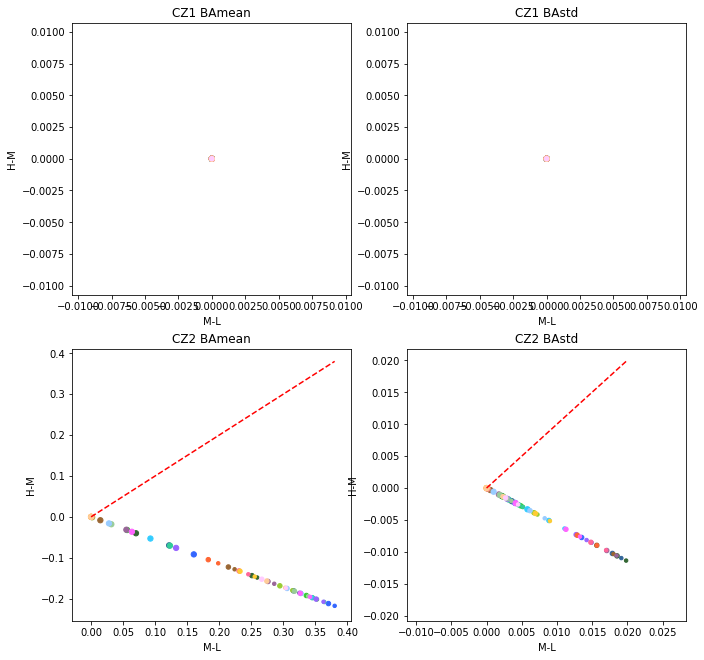

In [41]:
# PLOT 
# compare dif l-m and h-m 
# set the colors 
clid=1
CR=[0.2,0.6,1]
CG=[0.4,0.8,1]
CB=[0.2,0.6,1]
Mark=[12,20,28] #["o","v","x","."]
CO2colors=np.zeros([55,3])
MK=np.full(55,0)
xx=np.zeros((2,2,2))

#defube instances to examine
#insSet=np.array([20,23,26,29,32,35, 38,41,44,47,50,53]) 
# uncomment the line below for all instances
insSet=np.arange(1,54)  

#MK=['o', 'v', 'x', '.', 'o', 'v', 'x', '.', 'o', 'v', 'x', '.', 'o',
#       'v', 'x', '.', 'o', 'v', 'x', '.', 'o', 'v', 'x', '.', 'o', 'v',
#       'x', '.', 'o', 'v', 'x', '.', 'o', 'v', 'x', '.', 'o', 'v', 'x',
#       '.', 'o', 'v', 'x', '.', 'o', 'v', 'x', '.', 'x', 'x', 'x', 'x',
#       'x']
for vid in range(0,3):
    for pgsid in range(0,2):
        for agsid in range(0,3):
            for rid in range(0,3):
              CO2colors[clid]=(CR[vid],CG[pgsid],CB[agsid])
              MK[clid]=Mark[rid]
              clid=clid+1
fig,BAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
#plt.scatter(DifBAmeanLM1, DifBAmeanHM1)
BAs[0][0].scatter(DifBAmeanLM1[insSet], DifBAmeanHM1[insSet],c=CO2colors[insSet],s=MK[insSet]) # ,marker=MK[1:54]
BAs[0][0].set_xlabel('M-L', labelpad = 5)
BAs[0][0].set_ylabel('H-M', labelpad = 5)
BAs[0][0].set_title("CZ1 BAmean")
xx[0][0]=np.array([min(DifBAmeanLM1),max(DifBAmeanLM1)])  # adding 1-1 line

BAs[0][1].scatter(DifBAstdLM1[insSet], DifBAstdHM1[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][1].set_xlabel('M-L', labelpad = 5)
BAs[0][1].set_ylabel('H-M', labelpad = 5)
BAs[0][1].set_title("CZ1 BAstd")
xx[0][1]=np.array([min(DifBAstdLM1),max(DifBAstdLM1)])

BAs[1][0].scatter(DifBAmeanLM2[insSet], DifBAmeanHM2[insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[1][0].set_xlabel('M-L', labelpad = 5)
BAs[1][0].set_ylabel('H-M', labelpad = 5)
BAs[1][0].set_title("CZ2 BAmean")
xx[1][0]=np.array([min(DifBAmeanLM2),max(DifBAmeanLM2)])


BAs[1][1].scatter(DifBAstdLM2[insSet], DifBAstdHM2[insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[1][1].set_xlabel('M-L', labelpad = 5)
BAs[1][1].set_ylabel('H-M', labelpad = 5)
BAs[1][1].set_title("CZ2 BAstd")
xx[1][1]=np.array([min(DifBAstdLM2),max(DifBAstdLM2)])


for i in range(0,2):
    for j in range(0,2):
        BAs[i][j].plot([xx[i][j][0],xx[i][j][1]],[xx[i][j][0],xx[i][j][1]],"r--")
plt.show

print("difference in BAmean and BAstd between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments")
print("")
print("Impact of co2 on the mean MT and DBA")

CO2colors


print(xx[0][1][0])
plt.plot([xx[0][1][0],xx[0][1][1]],[xx[0][1][0],xx[0][1][1]],"r--")

difference in MTmean and DBAmean between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments

Impact of co2 on the mean of MT and DBA


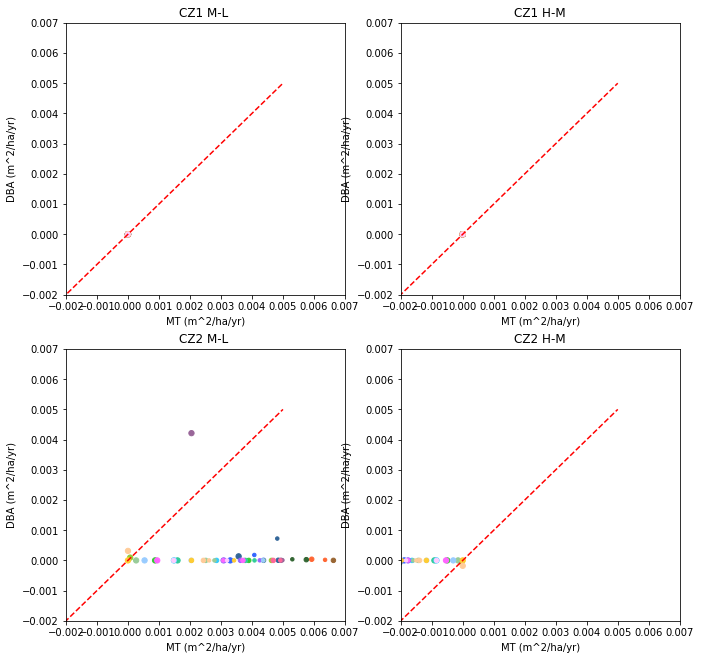

In [42]:
# PLOT 
# compare dif l-m and h-m difDBA vs. MTba 
fig,BAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
#plt.scatter(DifBAmeanLM1, DifBAmeanHM1)
BAs[0][0].scatter(DifMTbameanLM1[insSet], DifDBAmeanLM1[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][0].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[0][0].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[0][0].set_title("CZ1 M-L ")


BAs[0][1].scatter(DifMTbameanHM1[insSet], DifDBAmeanHM1[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][1].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[0][1].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[0][1].set_title("CZ1 H-M")


BAs[1][0].scatter(DifMTbameanLM2[insSet], DifDBAmeanLM2[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][0].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[1][0].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[1][0].set_title("CZ2 M-L ")


BAs[1][1].scatter(DifMTbameanHM2[insSet], DifDBAmeanHM2[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][1].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[1][1].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[1][1].set_title("CZ2 H-M")


for i in range(0,2):
   for j in range(0,2):
     BAs[i][j].set_xlim([-0.002, 0.007])
     BAs[i][j].set_ylim([-0.002, 0.007])
     BAs[i][j].plot([-0.005,0.005],[-0.005,0.005],"r--")
plt.show

print("difference in MTmean and DBAmean between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments")
print("")
print("Impact of co2 on the mean of MT and DBA")


difference in MTstd and DBAstd between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments

Impact of co2 level on the variation of growth and mortality rate


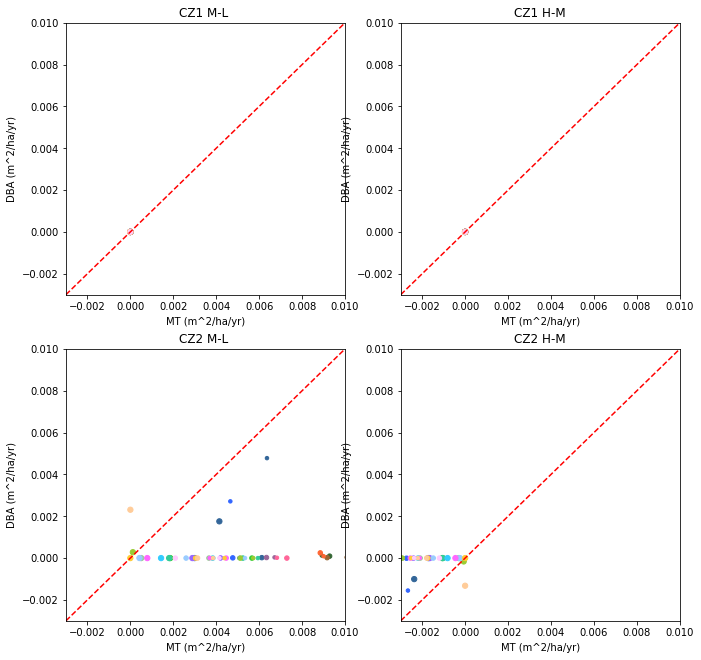

In [43]:
# PLOT 
# compare dif l-m and h-m difDBA vs. MTba 
fig,BAs=plt.subplots(nrows=2,ncols=2,figsize=(11,11))
#plt.scatter(DifBAmeanLM1, DifBAmeanHM1)
BAs[0][0].scatter(DifMTbastdLM1[insSet], DifDBAstdLM1[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][0].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[0][0].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[0][0].set_title("CZ1 M-L ")

BAs[0][1].scatter(DifMTbastdHM1[insSet], DifDBAstdHM1[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][1].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[0][1].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[0][1].set_title("CZ1 H-M")

BAs[1][0].scatter(DifMTbastdLM2[insSet], DifDBAstdLM2[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][0].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[1][0].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[1][0].set_title("CZ2 M-L ")

BAs[1][1].scatter(DifMTbastdHM2[insSet], DifDBAstdHM2[insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][1].set_xlabel('MT (m^2/ha/yr)', labelpad = 5)
BAs[1][1].set_ylabel('DBA (m^2/ha/yr)', labelpad = 5)
BAs[1][1].set_title("CZ2 H-M")


for i in range(0,2):
   for j in range(0,2):
     BAs[i][j].set_xlim([-0.003, 0.01])
     BAs[i][j].set_ylim([-0.003, 0.01])
     BAs[i][j].plot([-0.003,0.01],[-0.003,0.01],"r--")
plt.show
plt.show

print("difference in MTstd and DBAstd between different CO2 treatment standardized by the diffrence in CO2 concentration between the corresponding two treatments")
print("")
print("Impact of co2 level on the variation of growth and mortality rate")

In [44]:
# set up for plotting - 
# select case and instance to compare/plot
caseSet = np.array([2])
insSet = np.array([1,3])
## dinguish pft by line type, instance by color 
## assign line type, and line color
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 


In [45]:
CO2colors[50]

array([1. , 0.8, 0.6])

<function matplotlib.pyplot.show(*args, **kw)>

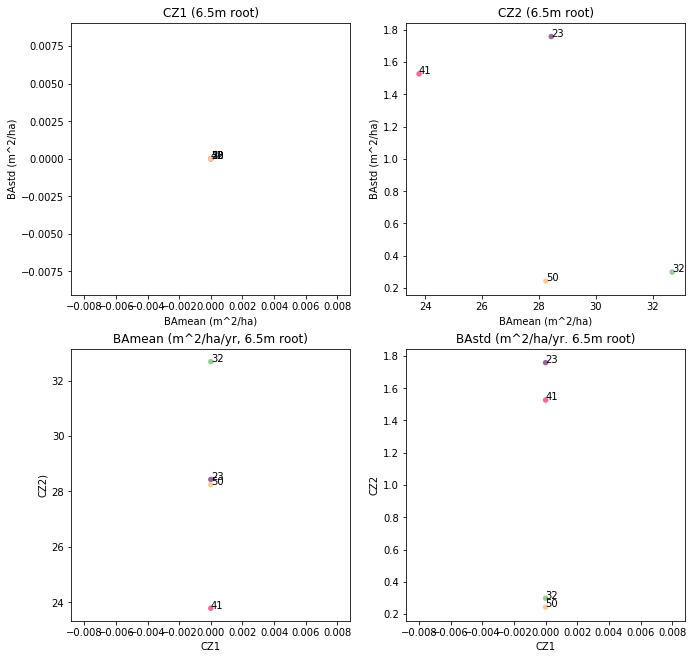

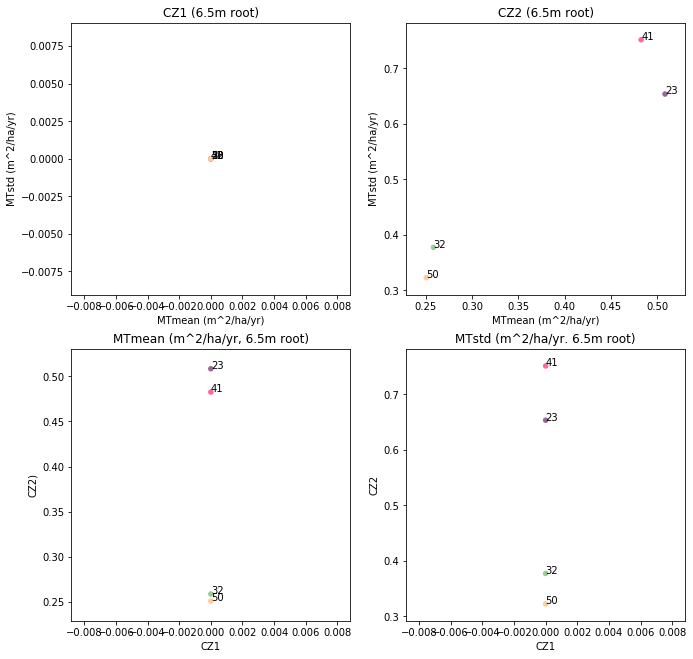

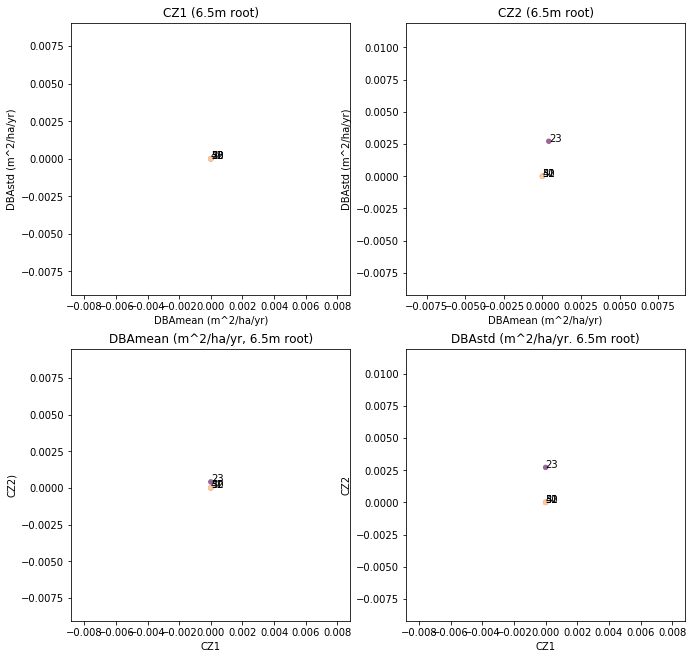

In [47]:
## Plot BAstd vs. BAmean for selected instances of intermediate CO2
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([23,32,41,50]) #20,23,26,29,32,35, 38,41,44,47,50,53 insid > 35 -> kmax=2, insid<=40 -> kmax=3
years=150
# define mark color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff','darkblue','black'])           # line color
ls = np.array(['-','--'])                          # line style 
# define mark colors
colors=np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff','darkblue','black','brown'])           # line color
TheMarkers=["$20$","$23$","$26$","$29$","$32$","$35$", "$38$","$41$","$44$","$47$","$50$","$53$"]
ilc=0

# plot BAstd vs. BAmean for 2 sites
fig,BAs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
BAs[0][0].scatter(BAmean[caseSet[0]][insSet], BAstd[caseSet[0]][insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][0].set_title("CZ1 (6.5m root)")
BAs[0][0].set_xlabel("BAmean (m^2/ha)") 
BAs[0][0].set_ylabel("BAstd (m^2/ha)")

BAs[0][1].scatter(BAmean[caseSet[1]][insSet], BAstd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[0][1].set_title("CZ2 (6.5m root)")
BAs[0][1].set_xlabel("BAmean (m^2/ha)") 
BAs[0][1].set_ylabel("BAstd (m^2/ha)")

# BAmean and BAstd cz2 vs. cz1
BAs[1][0].scatter(BAmean[caseSet[0]][insSet], BAmean[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][0].set_title("BAmean (m^2/ha/yr, 6.5m root)")
BAs[1][0].set_xlabel("CZ1") 
BAs[1][0].set_ylabel("CZ2)")

BAs[1][1].scatter(BAstd[caseSet[0]][insSet], BAstd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[1][1].set_title("BAstd (m^2/ha/yr. 6.5m root)")
BAs[1][1].set_xlabel("CZ1") 
BAs[1][1].set_ylabel("CZ2")

for txt in insSet:
    BAs[0][0].annotate(txt, (BAmean[caseSet[0]][txt], BAstd[caseSet[0]][txt]))
    BAs[0][1].annotate(txt, (BAmean[caseSet[1]][txt], BAstd[caseSet[1]][txt]))
    BAs[1][0].annotate(txt, (BAmean[caseSet[0]][txt], BAmean[caseSet[1]][txt]))    
    BAs[1][1].annotate(txt, (BAstd[caseSet[0]][txt], BAstd[caseSet[1]][txt]))
plt.show

##===================
# plot MTstd vs. MTmean for 2 sites
fig,MTs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
MTs[0][0].scatter(MTbamean[caseSet[0]][insSet], MTbastd[caseSet[0]][insSet],c=CO2colors[insSet],s=MK[insSet])
MTs[0][0].set_title("CZ1 (6.5m root)")
MTs[0][0].set_xlabel("MTmean (m^2/ha/yr)") 
MTs[0][0].set_ylabel("MTstd (m^2/ha/yr)")

MTs[0][1].scatter(MTbamean[caseSet[1]][insSet], MTbastd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet]) 
MTs[0][1].set_title("CZ2 (6.5m root)")
MTs[0][1].set_xlabel("MTmean (m^2/ha/yr)") 
MTs[0][1].set_ylabel("MTstd (m^2/ha/yr)")

# MTmean and MTstd cz2 vs. cz1
MTs[1][0].scatter(MTbamean[caseSet[0]][insSet], MTbamean[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet])
MTs[1][0].set_title("MTmean (m^2/ha/yr, 6.5m root)")
MTs[1][0].set_xlabel("CZ1") 
MTs[1][0].set_ylabel("CZ2)")

MTs[1][1].scatter(MTbastd[caseSet[0]][insSet], MTbastd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet]) 
MTs[1][1].set_title("MTstd (m^2/ha/yr. 6.5m root)")
MTs[1][1].set_xlabel("CZ1") 
MTs[1][1].set_ylabel("CZ2")

for txt in insSet:
    MTs[0][0].annotate(txt, (MTbamean[caseSet[0]][txt], MTbastd[caseSet[0]][txt]))
    MTs[0][1].annotate(txt, (MTbamean[caseSet[1]][txt], MTbastd[caseSet[1]][txt]))
    MTs[1][0].annotate(txt, (MTbamean[caseSet[0]][txt], MTbamean[caseSet[1]][txt]))    
    MTs[1][1].annotate(txt, (MTbastd[caseSet[0]][txt], MTbastd[caseSet[1]][txt]))

plt.show

### plot DBAmean vs. DBAstd
fig,MTs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
MTs[0][0].scatter(DBAmean[caseSet[0]][insSet], DBAstd[caseSet[0]][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet)
MTs[0][0].set_title("CZ1 (6.5m root)")
MTs[0][0].set_xlabel("DBAmean (m^2/ha/yr)") 
MTs[0][0].set_ylabel("DBAstd (m^2/ha/yr)")

MTs[0][1].scatter(DBAmean[5][insSet], DBAstd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet) 
MTs[0][1].set_title("CZ2 (6.5m root)")
MTs[0][1].set_xlabel("DBAmean (m^2/ha/yr)") 
MTs[0][1].set_ylabel("DBAstd (m^2/ha/yr)")


# DBAmean and DBAstd cz2 vs. cz1
MTs[1][0].scatter(DBAmean[caseSet[0]][insSet], DBAmean[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet)
MTs[1][0].set_title("DBAmean (m^2/ha/yr, 6.5m root)")
MTs[1][0].set_xlabel("CZ1") 
MTs[1][0].set_ylabel("CZ2)")

MTs[1][1].scatter(DBAstd[caseSet[0]][insSet], DBAstd[caseSet[1]][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet) 
MTs[1][1].set_title("DBAstd (m^2/ha/yr. 6.5m root)")
MTs[1][1].set_xlabel("CZ1") 
MTs[1][1].set_ylabel("CZ2")


for txt in insSet:
    MTs[0][0].annotate(txt, (DBAmean[caseSet[0]][txt], DBAstd[caseSet[0]][txt]))
    MTs[0][1].annotate(txt, (DBAmean[5][txt], DBAstd[caseSet[1]][txt]))
    MTs[1][0].annotate(txt, (DBAmean[caseSet[0]][txt], DBAmean[caseSet[1]][txt]))    
    MTs[1][1].annotate(txt, (DBAstd[caseSet[0]][txt], DBAstd[caseSet[1]][txt]))

plt.show

BAmean and BAstd for shallow roots, intermediate co2


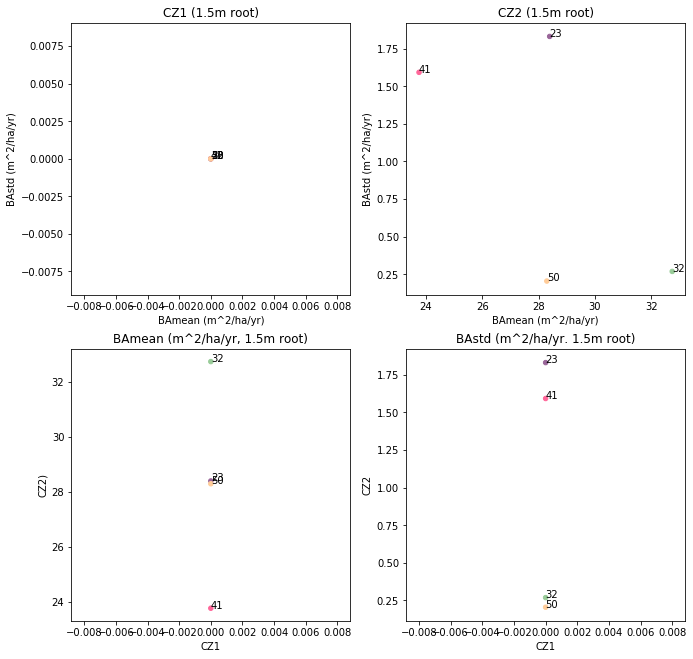

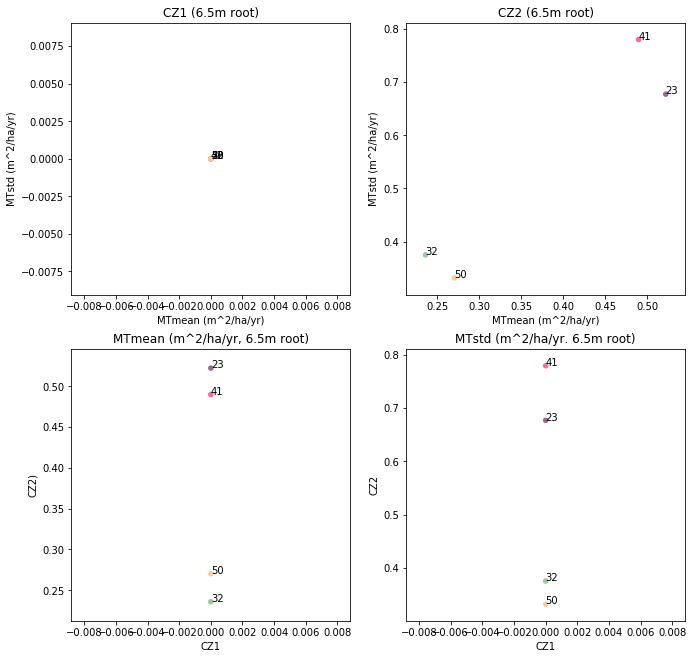

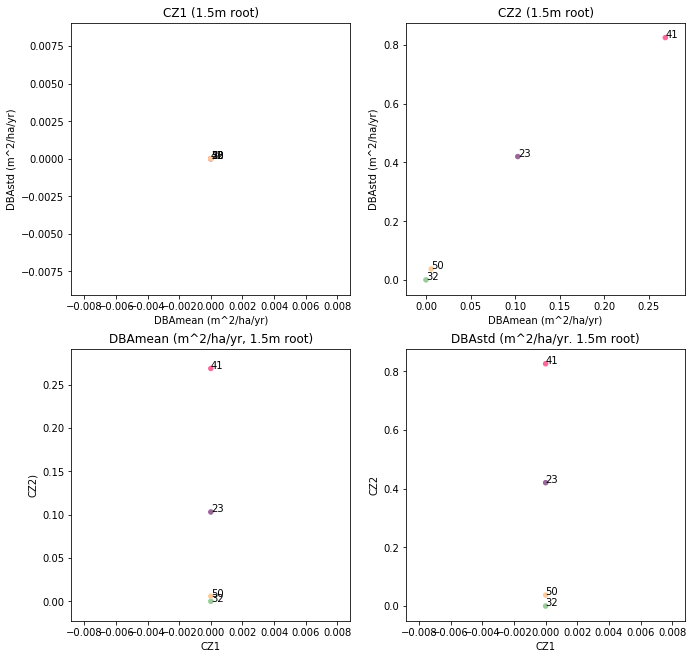

In [60]:
## Plot BAstd vs. BAmean for selected instances of intermediate CO2, shallow roots
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([23,32,41,50]) #21,24,27,30,33,36, 39,42,45,48,51,54 insid > 35 -> kmax=2, insid<=40 -> kmax=3
years=150
# define mark color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff','darkblue','black'])           # line color
ls = np.array(['-','--'])                          # line style 
# define mark colors
colors=np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff','darkblue','black','brown'])           # line color
TheMarkers=["$21$","$24$","$27$","$30$","$33$","$36$", "$39$","$42$","$45$","$48$","$51$","$54$"]
ilc=0

# plot BAstd vs. BAmean for 2 sites
fig,BAs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
BAs[0][0].scatter(BAmean[2][insSet], BAstd[2][insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[0][0].set_title("CZ1 (1.5m root)")
BAs[0][0].set_xlabel("BAmean (m^2/ha)") 
BAs[0][0].set_ylabel("BAstd (m^2/ha)")

BAs[0][1].scatter(BAmean[5][insSet], BAstd[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[0][1].set_title("CZ2 (1.5m root)")
BAs[0][1].set_xlabel("BAmean (m^2/ha)") 
BAs[0][1].set_ylabel("BAstd (m^2/ha)")

# BAmean and BAstd cz2 vs. cz1
BAs[1][0].scatter(BAmean[2][insSet], BAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet])
BAs[1][0].set_title("BAmean (m^2/ha, 1.5m root)")
BAs[1][0].set_xlabel("CZ1") 
BAs[1][0].set_ylabel("CZ2)")

BAs[1][1].scatter(BAstd[2][insSet], BAstd[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 
BAs[1][1].set_title("BAstd (m^2/ha. 1.5m root)")
BAs[1][1].set_xlabel("CZ1") 
BAs[1][1].set_ylabel("CZ2")

for txt in insSet:
    BAs[0][0].annotate(txt, (BAmean[2][txt], BAstd[2][txt]))
    BAs[0][1].annotate(txt, (BAmean[5][txt], BAstd[5][txt]))
    BAs[1][0].annotate(txt, (BAmean[2][txt], BAmean[5][txt]))    
    BAs[1][1].annotate(txt, (BAstd[2][txt], BAstd[5][txt]))
plt.show

##===================
# plot MTstd vs. MTmean for 2 sites
fig,MTs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
MTs[0][0].scatter(MTbamean[2][insSet], MTbastd[2][insSet],c=CO2colors[insSet],s=MK[insSet])
MTs[0][0].set_title("CZ1 (6.5m root)")
MTs[0][0].set_xlabel("MTmean (m^2/ha/yr)") 
MTs[0][0].set_ylabel("MTstd (m^2/ha/yr)")

MTs[0][1].scatter(MTbamean[5][insSet], MTbastd[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 
MTs[0][1].set_title("CZ2 (6.5m root)")
MTs[0][1].set_xlabel("MTmean (m^2/ha/yr)") 
MTs[0][1].set_ylabel("MTstd (m^2/ha/yr)")

# MTmean and MTstd cz2 vs. cz1
MTs[1][0].scatter(MTbamean[2][insSet], MTbamean[5][insSet],c=CO2colors[insSet],s=MK[insSet])
MTs[1][0].set_title("MTmean (m^2/ha/yr, 6.5m root)")
MTs[1][0].set_xlabel("CZ1") 
MTs[1][0].set_ylabel("CZ2)")

MTs[1][1].scatter(MTbastd[2][insSet], MTbastd[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 
MTs[1][1].set_title("MTstd (m^2/ha/yr. 6.5m root)")
MTs[1][1].set_xlabel("CZ1") 
MTs[1][1].set_ylabel("CZ2")

for txt in insSet:
    MTs[0][0].annotate(txt, (MTbamean[2][txt], MTbastd[2][txt]))
    MTs[0][1].annotate(txt, (MTbamean[5][txt], MTbastd[5][txt]))
    MTs[1][0].annotate(txt, (MTbamean[2][txt], MTbamean[5][txt]))    
    MTs[1][1].annotate(txt, (MTbastd[2][txt], MTbastd[5][txt]))

plt.show

### plot DBAmean vs. DBAstd
fig,MTs=plt.subplots(nrows=2, ncols=2,figsize=(11,11))
MTs[0][0].scatter(DBAmean[2][insSet], DBAstd[2][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet)
MTs[0][0].set_title("CZ1 (1.5m root)")
MTs[0][0].set_xlabel("DBAmean (m^2/ha/yr)") 
MTs[0][0].set_ylabel("DBAstd (m^2/ha/yr)")

MTs[0][1].scatter(DBAmean[5][insSet], DBAstd[5][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet) 
MTs[0][1].set_title("CZ2 (1.5m root)")
MTs[0][1].set_xlabel("DBAmean (m^2/ha/yr)") 
MTs[0][1].set_ylabel("DBAstd (m^2/ha/yr)")


# DBAmean and DBAstd cz2 vs. cz1
MTs[1][0].scatter(DBAmean[2][insSet], DBAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet)
MTs[1][0].set_title("DBAmean (m^2/ha/yr, 1.5m root)")
MTs[1][0].set_xlabel("CZ1") 
MTs[1][0].set_ylabel("CZ2)")

MTs[1][1].scatter(DBAstd[2][insSet], DBAstd[5][insSet],c=CO2colors[insSet],s=MK[insSet],label=insSet) 
MTs[1][1].set_title("DBAstd (m^2/ha/yr. 1.5m root)")
MTs[1][1].set_xlabel("CZ1") 
MTs[1][1].set_ylabel("CZ2")


for txt in insSet:
    MTs[0][0].annotate(txt, (DBAmean[2][txt], DBAstd[2][txt]))
    MTs[0][1].annotate(txt, (DBAmean[5][txt], DBAstd[5][txt]))
    MTs[1][0].annotate(txt, (DBAmean[2][txt], DBAmean[5][txt]))    
    MTs[1][1].annotate(txt, (DBAstd[2][txt], DBAstd[5][txt]))

plt.show
print("BAmean and BAstd for shallow roots, intermediate co2")

In [61]:
MTbamean[2][insSet]

array([0., 0., 0., 0.])

In [62]:
DBAmean[2][insSet]

array([0., 0., 0., 0.])

Total BA of Pine with 6.5m roots


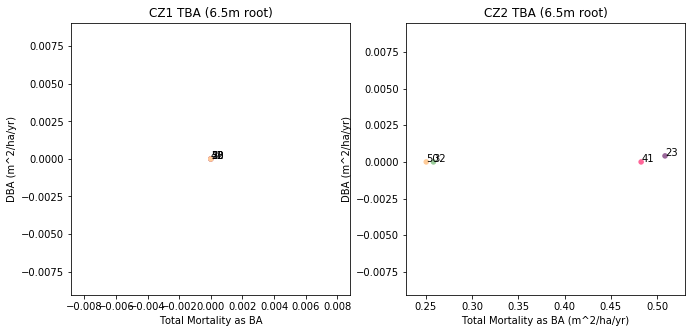

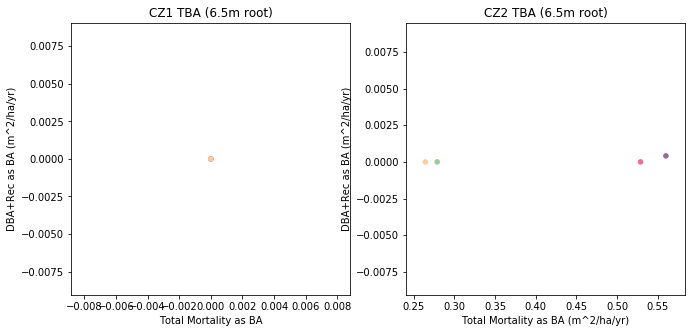

In [48]:
## Plot DDBH, REC, vs MTba for selected instances of intermediate CO2
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([23,32,41,50]) #20,23,26,29,32,35, 38,41,44,47,50,53 insid > 35 -> kmax=2, insid<=40 -> kmax=3

# define mark color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ilc=0

# plot total DDBH vs. MTba
fig,(Bt1,Bt2)=plt.subplots(nrows=1,ncols=2,figsize=(11,5))
Bt1.scatter(MTbamean[2][insSet], DBAmean[2][insSet],c=CO2colors[insSet],s=MK[insSet])
Bt2.scatter(MTbamean[5][insSet], DBAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 

Bt1.set_title("CZ1 TBA (6.5m root)")
Bt1.set_xlabel("Total Mortality as BA") 
Bt1.set_ylabel("DBA (m^2/ha/yr)")
#Bt1.legend(insSet, title="Instance",loc='upper left')

Bt2.set_title("CZ2 TBA (6.5m root)")
Bt2.set_xlabel("Total Mortality as BA (m^2/ha/yr)") 
Bt2.set_ylabel("DBA (m^2/ha/yr)")
#Bt2.legend(insSet, title="Instance",loc='upper left')

for txt in insSet:
    Bt1.annotate(txt, (MTbamean[2][txt], DBAmean[2][txt]))
    Bt2.annotate(txt, (MTbamean[5][txt], DBAmean[5][txt]))
plt.show

# plot recruitment vs. MTba

# plot the total DDBH + recruitment vs. MTba
fig,(Bt1,Bt2)=plt.subplots(nrows=1,ncols=2,figsize=(11,5))
Bt1.scatter((MTbamean[2][insSet]+RECbamean[2][insSet]), DBAmean[2][insSet],c=CO2colors[insSet],s=MK[insSet])
Bt2.scatter((MTbamean[5][insSet]+RECbamean[5][insSet]), DBAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 

Bt1.set_title("CZ1 TBA (6.5m root)")
Bt1.set_xlabel("Total Mortality as BA") 
Bt1.set_ylabel("DBA+Rec as BA (m^2/ha/yr)")
#Bt1.legend(insSet, title="Instance",loc='upper left')

Bt2.set_title("CZ2 TBA (6.5m root)")
Bt2.set_xlabel("Total Mortality as BA (m^2/ha/yr)") 
Bt2.set_ylabel("DBA+Rec as BA (m^2/ha/yr)")
#Bt2.legend(insSet, title="Instance",loc='upper left')

plt.show


print("Total BA of Pine with 6.5m roots")

 DBA vs MT of 1.5m roots instances


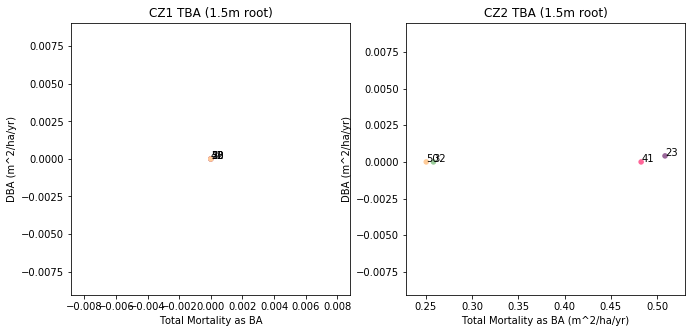

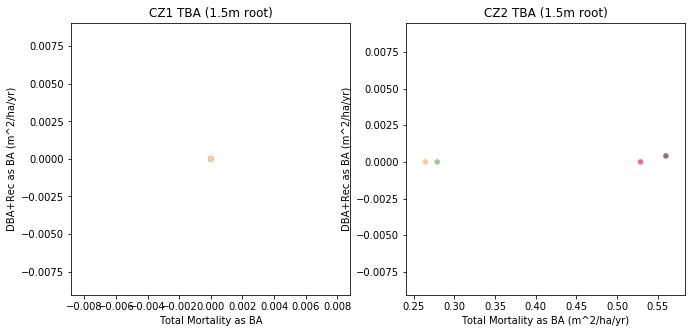

In [49]:
## Plot DDBH, REC, vs MTba for selected instances of intermediate CO2
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([23,32,41,50]) #21,24,27,30,33,36, 39,42,45,48,51,54 insid > 35 -> kmax=2, insid<=40 -> kmax=3

# define mark color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ilc=0

# plot total DDBH vs. MTba
fig,(Bt1,Bt2)=plt.subplots(nrows=1,ncols=2,figsize=(11,5))
Bt1.scatter(MTbamean[2][insSet], DBAmean[2][insSet],c=CO2colors[insSet],s=MK[insSet])
Bt2.scatter(MTbamean[5][insSet], DBAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 

Bt1.set_title("CZ1 TBA (1.5m root)")
Bt1.set_xlabel("Total Mortality as BA") 
Bt1.set_ylabel("DBA (m^2/ha/yr)")
#Bt1.legend(insSet, title="Instance",loc='upper left')

Bt2.set_title("CZ2 TBA (1.5m root)")
Bt2.set_xlabel("Total Mortality as BA (m^2/ha/yr)") 
Bt2.set_ylabel("DBA (m^2/ha/yr)")
#Bt2.legend(insSet, title="Instance",loc='upper left')

for txt in insSet:
    Bt1.annotate(txt, (MTbamean[2][txt], DBAmean[2][txt]))
    Bt2.annotate(txt, (MTbamean[5][txt], DBAmean[5][txt]))
plt.show

# plot recruitment vs. MTba

# plot the total DDBH + recruitment vs. MTba
fig,(Bt1,Bt2)=plt.subplots(nrows=1,ncols=2,figsize=(11,5))
Bt1.scatter((MTbamean[2][insSet]+RECbamean[2][insSet]), DBAmean[2][insSet],c=CO2colors[insSet],s=MK[insSet])
Bt2.scatter((MTbamean[5][insSet]+RECbamean[5][insSet]), DBAmean[5][insSet],c=CO2colors[insSet],s=MK[insSet]) 

Bt1.set_title("CZ1 TBA (1.5m root)")
Bt1.set_xlabel("Total Mortality as BA") 
Bt1.set_ylabel("DBA+Rec as BA (m^2/ha/yr)")
#Bt1.legend(insSet, title="Instance",loc='upper left')

Bt2.set_title("CZ2 TBA (1.5m root)")
Bt2.set_xlabel("Total Mortality as BA (m^2/ha/yr)") 
Bt2.set_ylabel("DBA+Rec as BA (m^2/ha/yr)")
#Bt2.legend(insSet, title="Instance",loc='upper left')

plt.show


print(" DBA vs MT of 1.5m roots instances")

Total BA of Pine with 6.5m roots, kmax=3,P50x=, differ in stoma


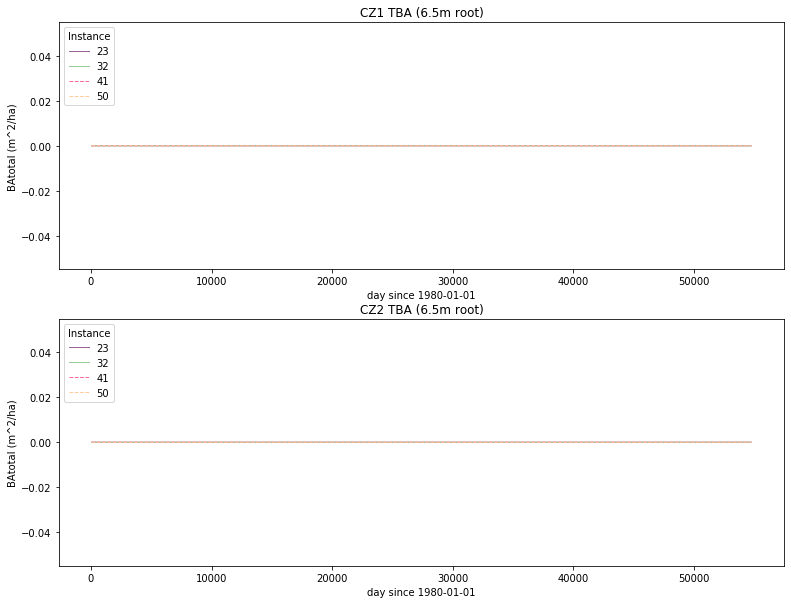

In [56]:
## exploraty plots
## plot time series BA in different ways: A - compare BA between instance for the same case for 130 years
## plot different instance but same CO2 treatment in same subplot for each site
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([23,32,41,50])
#insSet=np.arange(1,54)  20,23,26,29,32,35, 38,41,44,47,50,53
# 
# insid > 35 -> kmax=2, insid<=40 -> kmax=3
years=150
# define line color and line type to distinguish instances
lc = CO2colors #np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ilc=0
fig,(Bt1,Bt2)=plt.subplots(nrows=2,ncols=1,figsize=(13,10))
for inst in insSet: 

  for cid in caseSet:
     if inst <= 35:
       ils = 0
     else:
       ils = 1  
     if cid <= 3:
       Bt1.plot(Thetime[1:12*years], BAtotal[cid][inst][1:12*years], linestyle=ls[ils], color=lc[inst], linewidth=1)
     else:
       Bt2.plot(Thetime[1:12*years], BAtotal[cid][inst][1:12*years], linestyle=ls[ils], color=lc[inst], linewidth=1) 
  ilc=ilc+1
  if ilc>=len(insSet)/2:
    ilc=0
  Bt1.set_title("CZ1 TBA (6.5m root)")
  Bt1.set_xlabel("day since 1980-01-01") 
  Bt1.set_ylabel("BAtotal (m^2/ha)")
  Bt1.legend(insSet, title="Instance",loc='upper left')

  Bt2.set_title("CZ2 TBA (6.5m root)")
  Bt2.set_xlabel("day since 1980-01-01") 
  Bt2.set_ylabel("BAtotal (m^2/ha)")
  Bt2.legend(insSet, title="Instance",loc='upper left')
plt.show        
print("Total BA of Pine with 6.5m roots, kmax=3,P50x=, differ in stoma")

In [66]:
## exploraty plots
## plot time series DDBHba in different ways: A - compare BA between instance for the same case for 130 years
## plot different instance but same CO2 treatment in same subplot for each site
## setup plots to make
DDBHtoMT=DDBHtotal-MTbatotal
caseSet=np.array([2,5])
insSet=np.array([20,23,26,29,32,35, 38,41,44,47,50,53]) # insid > 35 -> kmax=2, insid<=40 -> kmax=3
years=150
# define line color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ilc=0
#fig,(Bt1,Bt2)=plt.subplots(nrows=2,ncols=1,figsize=(13,13))
for inst in insSet: 
  fig,(Bt1,Bt2)=plt.subplots(nrows=2,ncols=1,figsize=(13,5))
  for cid in caseSet:
     if inst <= 35:
       ils = 0
     else:
       ils = 1  
     if cid <= 3:
       Bt1.plot(Thetime[1:12*years], DDBHtoMT[cid][inst][1:12*years], linestyle=ls[ils], color=lc[ilc], linewidth=1)
     else:
       Bt2.plot(Thetime[1:12*years], DDBHtoMT[cid][inst][1:12*years], linestyle=ls[ils], color=lc[ilc], linewidth=1) 
  ilc=ilc+1
  if ilc>=len(insSet)/2:
    ilc=0
  Bt1.set_title("CZ1 Total DDBH-MTba (6.5m root), inst: "+str(inst),y=0.8)
  Bt1.set_xlabel("day since 1980-01-01") 
  Bt1.set_ylabel("Total DDBH-MTba (m^2/ha/YR)")
#  Bt1.legend(inst, title="Instance",loc='upper left')

  Bt2.set_title("CZ2 Total DDBH-MTba (6.5m root), inst: "+str(inst), y=0.8)
  Bt2.set_xlabel("day since 1980-01-01") 
  Bt2.set_ylabel("Total DDBH-MTba (m^2/ha/yr)")
#  Bt2.legend(inst, title="Instance",loc='upper left')
plt.show        
print("Total BA of Pine with 6.5m roots, kmax=3,P50x=, differ in stoma")

NameError: name 'DDBHtotal' is not defined

In [ ]:
## exploraty plots
## plot time series Recruitment between instance for the same case for 130 years
## plot different instance but same CO2 treatment in same subplot for each site
## setup plots to make
caseSet=np.array([2,5])
insSet=np.array([20,23,26,29,32,35,38,41,44,47,50,53]) # insid > 35 -> kmax=2, insid<=40 -> kmax=3
years=150
# define line color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ilc=0
fig,(Bt1,Bt2)=plt.subplots(nrows=2,ncols=1,figsize=(13,13))
for inst in insSet: 
  for cid in caseSet:
     if inst <= 35:
       ils = 0
     else:
       ils = 1  
     if cid <= 3:
       Bt1.plot(Thetime[1:12*years], REC[cid][inst][1:12*years], linestyle=ls[ils], color=lc[ilc], linewidth=1)
     else:
       Bt2.plot(Thetime[1:12*years], REC[cid][inst][1:12*years], linestyle=ls[ils], color=lc[ilc], linewidth=1) 
  ilc=ilc+1
  if ilc>=len(insSet)/2:
    ilc=0
  Bt1.set_title("CZ1 TBA (6.5m root)")
  Bt1.set_xlabel("day since 1980-01-01") 
  Bt1.set_ylabel("Recruitment (n/ha/yr)")
  Bt1.legend(insSet, title="Instance",loc='upper left')

  Bt2.set_title("CZ2 TBA (6.5m root)")
  Bt2.set_xlabel("day since 1980-01-01") 
  Bt2.set_ylabel("Recruitment (n/ha/yr)")
  Bt2.legend(insSet, title="Instance",loc='upper left')
plt.show        
print("Total BA of Pine with 6.5m roots, kmax=3,P50x=, differ in stoma")

In [ ]:
## exploraty plots
## plot time series BA in different ways: A - compare BA between instance for the same case for 130 years
## plot different CO2 treatment of same instances of CZ1 in same subplot for up to three instances 
## setup plots to make
caseSet1=np.array([1,2,3])  # rerun case 3 - high co2 
insSet1=np.array([20,23,26,29,32,35,38,41,44,47,50,53])
# shallow roots[]
years=150
# define line color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ils=0

fig,Bt1=plt.subplots(nrows=len(insSet1),ncols=1,figsize=(13,36))
for instid in range (0,len(insSet1)): 
  inst=insSet1[instid]  
  for cid in caseSet1:
     print(cid,inst)   
     Bt1[instid].plot(Thetime[1:12*years], BAtotal[cid][inst][1:12*years], linestyle=ls[ils], color=lc[cid-1], linewidth=1)

  Bt1[instid].set_title("CZ1 TBA ins:"+str(insSet1[instid]),y=0.1)
  Bt1[instid].set_xlabel("day since 1980-01-01") 
  Bt1[instid].set_ylabel("BAtotal (m^2/ha)")
  Bt1[instid].legend(caseSet1, title="CO2 level",loc='upper left')

plt.show        
print("notes: the high c02 treatment drop to zero at arund 38000 days because the run stopped")
print("at that time due to time off, not because all the trees are dies suddently")
print("Also, case6 high co2 treatment were not run properly, running it again")

4 20
5 20
6 20
4 23
5 23
6 23
4 26
5 26
6 26
4 29
5 29
6 29
4 32
5 32
6 32
4 35
5 35
6 35
4 38
5 38
6 38
4 41
5 41
6 41
4 44
5 44
6 44
4 47
5 47
6 47
4 50
5 50
6 50
4 53
5 53
6 53
notes: 


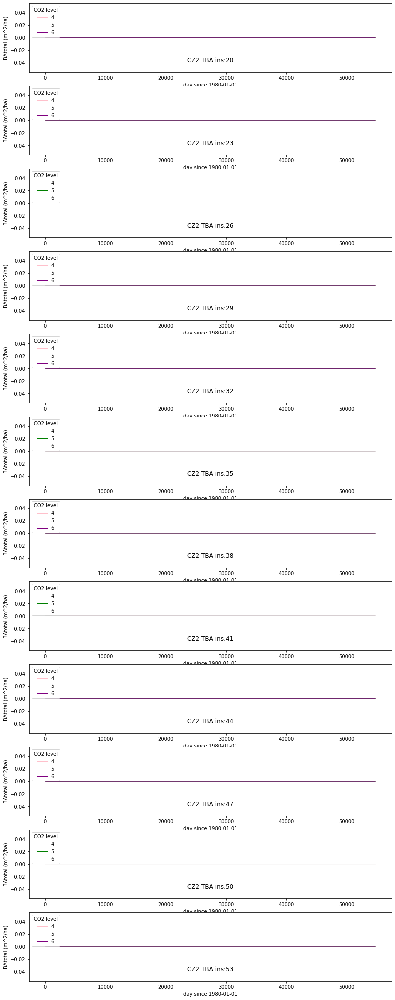

In [53]:
## exploraty plots
## plot time series BA in different ways: A - compare BA between instance for the same case for 130 years
## plot different CO2 treatment of same instances of CZ2 in same subplot for up to three instances 
## setup plots to make
caseSet2=np.array([4,5,6])  # need to run high co2 case6 again
insSet2=np.array([20,23,26,29,32,35,38,41,44,47,50,53])
years=150
# define line color and line type to distinguish instances
lc = np.array(['blue','brown','orange','pink','green','purple','olive','red','peachpuff'])           # line color
ls = np.array(['-','--'])                          # line style 
ils=0
fig,Btx=plt.subplots(nrows=len(insSet2),ncols=1,figsize=(13,36))
for instid in range (0,len(insSet2)): 
  inst=insSet2[instid]  

  for cid in caseSet2:
     print(cid,inst)    
     Btx[instid].plot(Thetime[1:12*years], BAtotal[cid][inst][1:12*years], linestyle=ls[ils], color=lc[cid-1], linewidth=1)

  Btx[instid].set_title("CZ2 TBA ins:"+str(insSet2[instid]),y=0.1)
  Btx[instid].set_xlabel("day since 1980-01-01") 
  Btx[instid].set_ylabel("BAtotal (m^2/ha)")
  Btx[instid].legend(caseSet2, title="CO2 level",loc='upper left')

plt.show        
print("notes: ")

In [ ]:
## plot GPP and QVEGT
## setup plots to make
# r1 long term GPP, r2 2yr GPP with flux tower, r3, long term qvegt, r4, 2yr LH with flux tower 
sToyr=365*24*60*60
fig,(PGPP, PGPPflx,PQVEGT,PLHflx)=plt.subplots(nrows=4,ncols=1,figsize=(8,10))
fig.tight_layout()
for cid in caseSet:
  for inst in insSet:
     if inst <=8:
       ils = 0
       ilc = inst -1   
     else:
       ils = 1
       ilc = inst - 9   
     PGPP.plot(Thetime[1:len(Thetime)], GPP[inst][1:(len(Thetime))]*sToyr, linestyle=ls[ils], color=lc[ilc], linewidth=1)
PGPP.set_xlabel("day since 1980-01-01") 
PGPP.set_ylabel("GPP (gC/m^2/yr)")
PGPP.legend(cases, title="Instance",loc='right')

# plot 2011 + 33 to 2012 + 33
st = (2066 - 1980) * 12-1
ent = st + 24
for inst in cases:
   if inst <=8:
     ils = 0
     ilc = inst -1   
   else:
     ils = 1    
     ilc = inst - 9   
   PGPPflx.plot(GPP[inst][st:ent]*sToyr, linestyle=ls[ils], color=lc[ilc],linewidth=1)
#PGPPflx.plot(cz1GEE*sToyr, linestyle='--', linewidth=2, color='blue')
PGPPflx.set_xlabel("month since 2011-01") 
PGPPflx.set_ylabel("GPP (gC/m^2/yr)")
PGPPflx.legend(np.append(cases,'observed'), title="Instance", loc='right')


for inst in insSet:
   if inst <=8:
     ils = 0
     ilc = inst -1
   else:
     ils = 1 
     ilc = inst - 9    
   PQVEGT.plot(Thetime[1:len(Thetime)], QVEGT[inst][1:(len(Thetime))], linestyle=ls[ils], color=lc[ilc],linewidth=1)
PQVEGT.set_xlabel("day since 1980-01-01") 
PQVEGT.set_ylabel("QVEGT (mm/s)")
PQVEGT.legend(cases, title="Instance", loc='right')

for inst in insSet:
   if inst <=8:
     ils = 0
     ilc = inst - 1   
   else:
     ils = 1  
     ilc = inst - 9   
   PLHflx.plot(LH[inst][st:ent], linestyle=ls[ils], color=lc[ilc],linewidth=1)
#PLHflx.plot(cz1LH*sToyr, linestyle='--', linewidth=2, color='blue')
PLHflx.set_xlabel("month since 2011-01") 
PLHflx.set_ylabel("Latent heat flux (W/m^2)")
PLHflx.ticklabel_format(useOffset=False)

PLHflx.legend(np.append(cases,'observed'), title="Instance", loc='right')
#+ 'observed'
print("notes: hightly over estimted WUE, this is likely due to higher")
print("oak proportion, oak has safer xylem and higher WUE")
print("solid line - fire off, dash line - fire on")
#plt.show        

In [9]:
# plot MR to AR ratio
GRtoMR=GR/MR
GRtoMR.shape

/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/IPython/kernel/__main__.py:2: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


(9, 1211, 39)

In [ ]:
# plot GR to AR ratio of size 55 cm DBH cohort of each pft 
fig1,(Ppine,Poak) = plt.subplots(nrows=2,ncols=1,figsize=(10,8))
fig1.tight_layout()

for ins in range(1,nins+1):
  Ppine.plot(Thetime[(len(Thetime)-240):len(Thetime)], GRtoMR[ins,(len(Thetime)-240):(len(Thetime)),8],linestyle='-', color=lc[ins-1])
Ppine.set_title("GR to MR ratio of :dbh 55cm")  
Ppine.set_ylabel("GR/MR pine")
Ppine.set_xlabel("day since 1980-01-01")
Ppine.legend(range(1,nins+1), title="Instance",loc='upper left')

for ins in range(1,nins+1):
  Poak.plot(Thetime[(len(Thetime)-240):len(Thetime)], GRtoMR[ins,(len(Thetime)-240):(len(Thetime)),21], linestyle='-', color=lc[ins-1])
#Poak.set_title("GR to MR ratio of Pine:dbh 55cm") 
Poak.set_ylabel("GR/MR oak")  
Poak.set_xlabel("day since 1980-01-01")
Poak.legend(range(1,nins+1), title="Instance",loc='upper left')


TypeError: Dimensions of C (12, 39) are incompatible with X (1210) and/or Y (13); see help(pcolormesh)

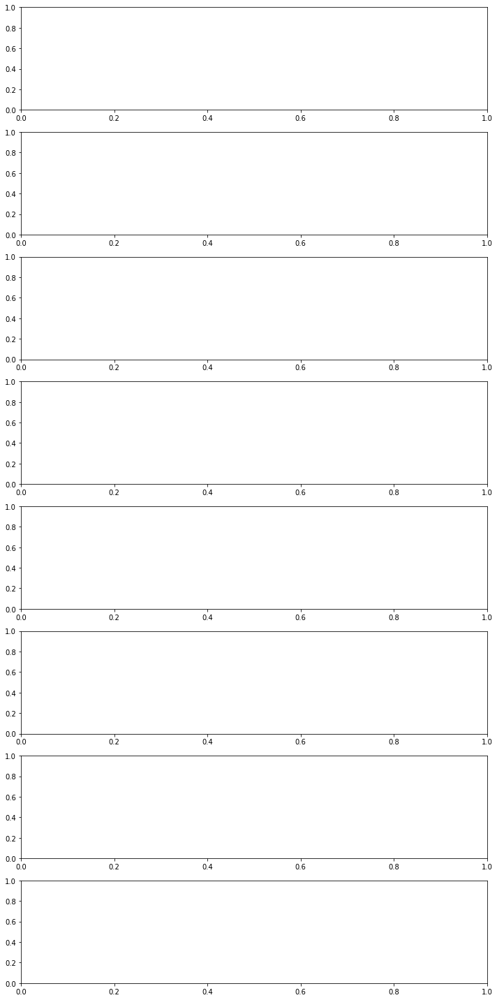

In [30]:
# plot BA of cohorts 
fig1,pBAch = plt.subplots(nrows=8,figsize=(10,20))
fig1.tight_layout()
levels = np.arange(0.,1.1, 0.1)
cmap = plt.get_cmap('Blues')
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

for ins in range(1,nins+1):
  im = pBAch[ins].pcolormesh(Thetime[1:len(Thetime)], Thesizebin, BA[ins,0:12], cmap=cmap, norm=norm)
  pBAch[ins].set_title("GR to MR ratio of :dbh 55cm")  
  pBAch[ins].set_ylabel("Cohort ")
  pBAch[ins].set_xlabel("day since 1980-01-01")

## set up the first plot: the fractional area of patches of a given age range
#levels = np.arange(0.,1.1, 0.1)
#cmap = plt.get_cmap('Blues')
#norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)
#im = f1ax0.pcolormesh(time, patch_age_bins, PATCH_AREA_BY_AGE[:,:,0].transpose(), cmap=cmap, norm=norm)
#fig1.colorbar(im, ax=f1ax0)
#f1ax0.set_title(r'Patch Area by Age (m$^2$ patch m$^{-2}$ site)')
#f1ax0.set_xlabel('Time (yr)')
#f1ax0.set_ylabel('Patch Age (yr)')


In [ ]:
# below are old codes

Figure 3. Growth vs. mortality rate


/global/software/sl-7.x86_64/modules/langs/python/3.7/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


ValueError: scatter requires x column to be numeric

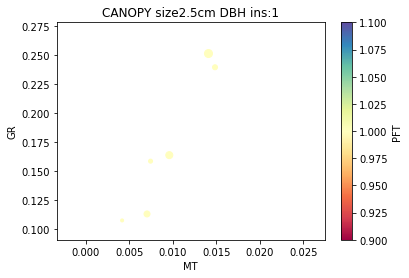

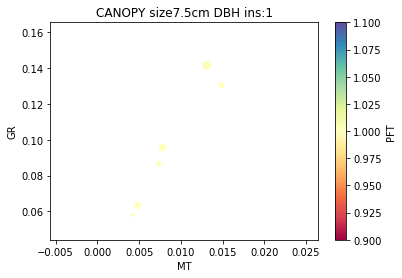

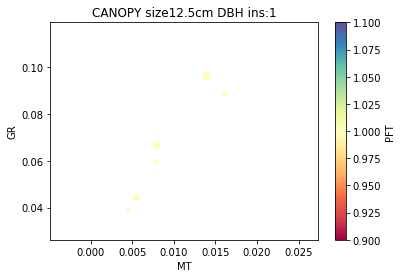

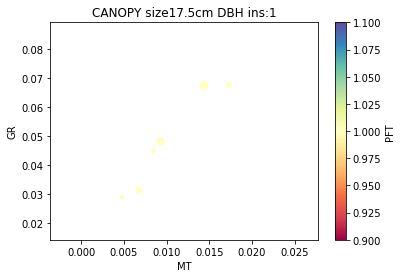

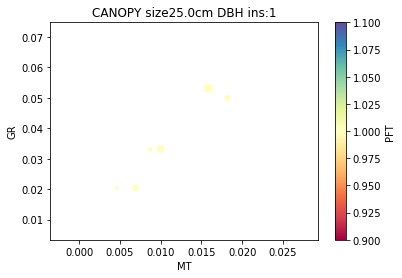

...

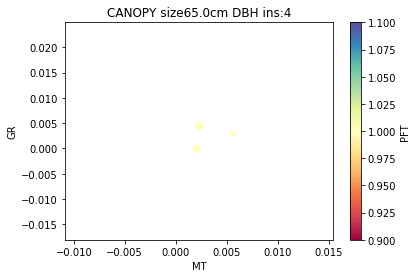

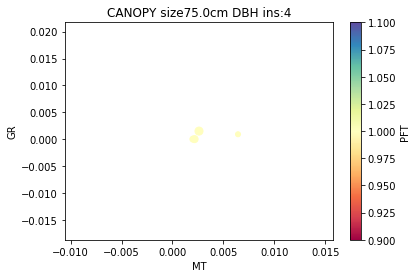

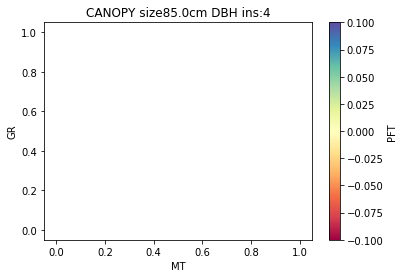

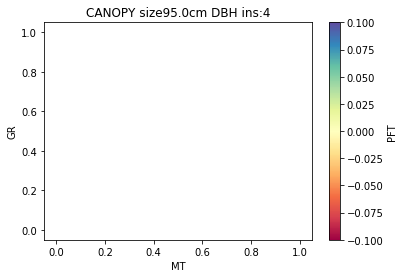

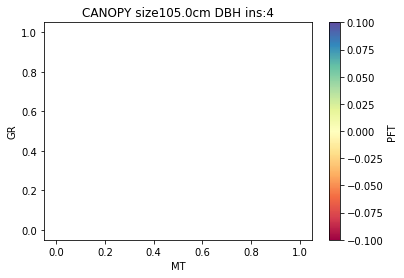

In [20]:
# plot figure 3 growth rate vs. mortality rate of canopy level
setsP=np.array([1,2,3,4,9])
setsO=np.array([5,6,7,8,9])
print("Figure 3. Growth vs. mortality rate")
for theins in sets:
  ChStcSel=ChStc[(ChStc.cid.isin([1,2,3,4,5,6])) & (ChStc.instid.isin([theins]))]
  for chid in range(0,13):
    ChStcSel0=ChStcSel[ChStcSel.chid.isin([chid,chid+13])]

    ax1 = ChStcSel0.plot.scatter(x='MTmn',y='GRmn',s=(ChStcSel0["cid"]+2)**2, c='PFT',colormap='Spectral')
    ax1.set_title("CANOPY size"+str(DBH[chid])+"cm DBH ins:"+str(theins))
    ax1.set_xlabel("MT")
    ax1.set_ylabel("GR")
    ax1.xaxis.get_label().set_visible(True)    
    ax1.tick_params(axis='x', bottom=True, labelbottom=True)
       
    
print("Figure 4. growth and mortality vs. cohort size")
for theins in [3]:
  ChStcSelb=ChStc[(ChStc.cid.isin([1,2,3,4,5,6])) & (ChStc.instid.isin([theins]))& (ChStc['MTmn']<1)]
  for thepft in [1,2]:
    ChStcSelb0=ChStcSelb[ChStcSelb.PFT.isin([thepft])]

    ax1 = ChStcSelb0.plot.scatter(x='chid',y='GRmn',c='cid',colormap='Spectral')
    ax1.set_title("CANOPY growth rate (mean) of cohort: PFT"+str(thepft))
    ax1.set_xlabel("DBH")
    ax1.set_ylabel("GR (DBA/BA/yr)")
    ax1.xaxis.get_label().set_visible(True)    
    ax1.tick_params(axis='x', bottom=True, labelbottom=True)

    ax2 = ChStcSelb0.plot.scatter(x='chid',y='MTmn',c='cid',colormap='Spectral')
    ax2.set_title("CANOPY mortality rate (mean) of cohort: PFT"+str(thepft))
    ax2.set_xlabel("DBH")
    ax2.set_ylabel("MT (n/n/yr)")   
    ax2.xaxis.get_label().set_visible(True)
    ax2.tick_params(axis='x', bottom=True, labelbottom=True)
    
for theins in [3]:
  ChStcSelb=ChStc[(ChStc.cid.isin([1,2,3,4,5,6])) & (ChStc.instid.isin([theins]))]
  for thepft in [1,2]:
    ChStcSelb0=ChStcSelb[ChStcSelb.PFT.isin([thepft])]

    ax1 = ChStcSelb0.plot.scatter(x='chid',y='GRmed',c='cid',colormap='Spectral')
    ax1.set_title("CANOPY growth rate (median) of cohort: PFT"+str(thepft))
    ax1.set_xlabel("DBH")
    ax1.set_ylabel("GR (DBA/BA/yr)")
    ax1.xaxis.get_label().set_visible(True)    
    ax1.tick_params(axis='x', bottom=True, labelbottom=True)
    
    
    ax2 = ChStcSelb0.plot.scatter(x='chid',y='MTmed',c='cid',colormap='Spectral')
    ax2.set_title("CANOPY mortality rate (median) of cohort: PFT"+str(thepft))
    ax2.set_xlabel("DBH")
    ax2.set_ylabel("MT (n/n/yr)")      
    ax2.xaxis.get_label().set_visible(True)
    ax2.tick_params(axis='x', bottom=True, labelbottom=True)